# INTRODUCTION

Crime clustering is a cutting-edge approach that utilizes the capabilities of unsupervised learning to gain valuable insights from the complex world of crime patterns and occurrences in society. By harnessing the power of unsupervised learning, one can explore crime data without explicit guidance or labeled outcomes. Unlike supervised learning, where models need to be trained on labeled data to make predictions or classifications, unsupervised learning is more flexible by utilizing algorithms to discover inherent patterns and structures within the crime data on their own.

The process of crime clustering begins by inputting a dataset comprising various crime-related features, such as location, type of crime, time of occurrence, demographics of the area, and other contextual factors. These features may encompass aspects like crime rates, socio-economic conditions, population density, and geographical attributes. Through unsupervised learning algorithms, crime clustering endeavors to identify natural groupings or clusters within the data, where similar crime patterns and occurrences are grouped together. This can provide valuable insights into crime hotspots, trends, and potential risk factors, enabling law enforcement agencies and policymakers to make more informed decisions and implement targeted crime prevention strategies.



# PROBLEM STATEMENT

Crime is a pervasive and complex issue that affects every city across the globe, regardless of its size, location or socio-economic issue. It is a significant concern in urban areas, impacting public safety, community well-being and the development of a city. As urban centers grow and populations increase, it becomes increasingly difficult to tackle issues related to preventing crime, enforcing laws and ensuring public safety. Criminal activities not only pose a direct threat to the safety and well-being of individuals but also have far-reaching consequences on communities and city development. In order to address the issues, clustering analysis will be done here to find out the different types of crimes that are most likely to occur by clustering the dataset into different clusters. With the aid of various clustering techniques, the crime hotspots that happen in Boston can be identified which may allow law enforcement to focus their resources allocation on these crime hotspots which can enhance crime prevention in those areas. By utilizing these clustering techniques, this project aims to uncover the crime patterns and types prevalent in different districts. The insights gained can assist law enforcement agencies to develop tailored crime prevention strategies and allocation resources effectively. Thus, the city can take proactive steps towards reducing crime rates and fostering safer and more secure neighborhoods.


# Objective:

1. Group criminal activities based on longitude and latitude coordinates.


2. Conduct an in-depth analysis and create visual representations of criminal statistics for individual clusters.

# 1: Data Collection and Understanding

In [1]:
# Note:
# Make sure you install the following dependencies:
# 1. Folium

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [3]:
file_names = ['crime_dataset/crime2017.csv',
             'crime_dataset/crime2018.csv',
             'crime_dataset/crime2019.csv',
             'crime_dataset/crime2020.csv',
             'crime_dataset/crime2021.csv',
              'crime_dataset/crime2022.csv']

dfs = []

for file in file_names:
    df_file = pd.read_csv(file, low_memory=False)
    dfs.append(df_file)

df = pd.concat(dfs, ignore_index=True)
del(dfs)

In [4]:
#Get the dimensions of the DataFrame
df.shape

(503877, 17)

In [5]:
#Check the first few rows of the DataFrame
df.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182050863,2629,Harassment,HARASSMENT,A1,123,NaN,2017-01-01 00:00:00,2017,1,Sunday,0,Part Two,KNEELAND ST,42.350826,-71.062624,"(42.35082577, -71.06262352)"
1,I172089248,3112,Landlord/Tenant Disputes,LANDLORD - TENANT SERVICE,E13,578,NaN,2017-01-01 00:00:00,2017,1,Sunday,0,Part Three,PAUL GORE ST,42.320305,-71.109667,"(42.32030543, -71.10966668)"
2,I172089248,2629,Harassment,HARASSMENT,E13,578,NaN,2017-01-01 00:00:00,2017,1,Sunday,0,Part Two,PAUL GORE ST,42.320305,-71.109667,"(42.32030543, -71.10966668)"
3,I192021827,619,Larceny,LARCENY ALL OTHERS,C11,340,NaN,2017-01-01 00:00:00,2017,1,Sunday,0,Part One,FOX ST,42.306096,-71.064257,"(42.30609597, -71.06425709)"
4,I182058070,3201,Property Lost,PROPERTY - LOST,C11,335,NaN,2017-01-01 00:00:00,2017,1,Sunday,0,Part Three,BOWDOIN ST,42.306480,-71.066758,"(42.30648026, -71.06675783)"


In [6]:
#Check the last few rows of the DataFrame
df.tail()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
503872,232000091,1402,NaN,VANDALISM,A1,66,0,2022-12-31 23:30:00,2022,12,Saturday,23,NaN,CHARLES ST,42.359790,-71.070782,"(42.35979037458775, -71.07078234449541)"
503873,232000002,3831,NaN,M/V - LEAVING SCENE - PROPERTY DAMAGE,C11,,0,2022-12-31 23:37:00,2022,12,Saturday,23,NaN,COLUMBIA RD,42.319593,-71.062607,"(42.31959298334654, -71.06260699634272)"
503874,232000140,619,NaN,LARCENY ALL OTHERS,D14,778,0,2022-12-31 23:45:00,2022,12,Saturday,23,NaN,WASHINGTON ST,42.349056,-71.150498,"(42.34905600030506, -71.15049849975023)"
503875,232000315,3201,NaN,PROPERTY - LOST/ MISSING,D4,167,0,2022-12-31 23:50:00,2022,12,Saturday,23,NaN,HARRISON AVENUE,NaN,NaN,NaN
503876,232000052,3114,NaN,INVESTIGATE PROPERTY,A1,,0,2022-12-31 23:50:00,2022,12,Saturday,23,NaN,MOUNT VERNON ST,42.357879,-71.069680,"(42.357878706878985, -71.06967973039733)"


In [7]:
#Get the data types of each column in the DataFrame
df.dtypes

INCIDENT_NUMBER         object
OFFENSE_CODE             int64
OFFENSE_CODE_GROUP      object
OFFENSE_DESCRIPTION     object
DISTRICT                object
REPORTING_AREA          object
SHOOTING                object
OCCURRED_ON_DATE        object
YEAR                     int64
MONTH                    int64
DAY_OF_WEEK             object
HOUR                     int64
UCR_PART                object
STREET                  object
Lat                    float64
Long                   float64
Location                object
dtype: object

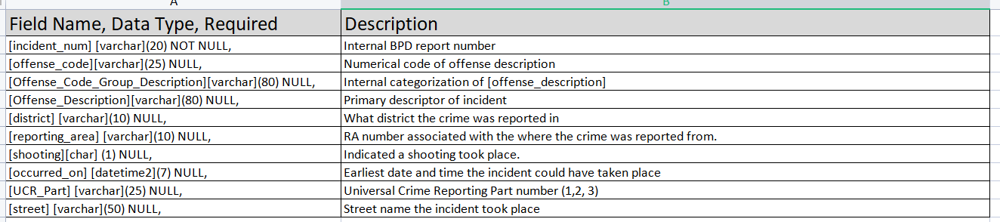

# 2: Data Cleaning and Data Preprocessing

## 2.1: Check for duplicate data

In [8]:
#Print the rows where it is duplicated
duplicate_rows_all = df.duplicated(keep=False)
duplicate_rows_df_all = df[duplicate_rows_all]
duplicate_rows_df_all

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
83,I172000047,413,Aggravated Assault,ASSAULT - AGGRAVATED - BATTERY,B3,442,Y,2017-01-01 02:26:00,2017,1,Sunday,2,Part One,BROWNING AVE,42.294150,-71.081750,"(42.29415023, -71.08175047)"
84,I172000047,413,Aggravated Assault,ASSAULT - AGGRAVATED - BATTERY,B3,442,Y,2017-01-01 02:26:00,2017,1,Sunday,2,Part One,BROWNING AVE,42.294150,-71.081750,"(42.29415023, -71.08175047)"
89,I172000057,3008,Medical Assistance,SUICIDE / SUICIDE ATTEMPT,D14,814,NaN,2017-01-01 02:36:00,2017,1,Sunday,2,Part Three,CAMBRIDGE ST,42.358680,-71.124323,"(42.35868007, -71.12432266)"
90,I172000057,3008,Medical Assistance,SUICIDE / SUICIDE ATTEMPT,D14,814,NaN,2017-01-01 02:36:00,2017,1,Sunday,2,Part Three,CAMBRIDGE ST,42.358680,-71.124323,"(42.35868007, -71.12432266)"
1745,I140346143-00,1849,Drug Violation,"DRUGS - POSS CLASS B - COCAINE, ETC.",E13,906,NaN,2017-01-07 20:00:00,2017,1,Saturday,20,Part Two,AMERICAN LEGION HWY,42.275313,-71.115878,"(42.27531312, -71.11587798)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
198523,I182103979,3502,Missing Person Located,MISSING PERSON - LOCATED,B2,319,NaN,2018-12-23 18:00:00,2018,12,Sunday,18,Part Three,CHENEY ST,42.309700,-71.085824,"(42.30970016, -71.08582414)"
198524,I182103979,3502,Missing Person Located,MISSING PERSON - LOCATED,B2,319,NaN,2018-12-23 18:00:00,2018,12,Sunday,18,Part Three,CHENEY ST,42.309700,-71.085824,"(42.30970016, -71.08582414)"
199103,I182104066,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",B3,434,Y,2018-12-27 00:34:00,2018,12,Thursday,0,Part One,DYER ST,42.283369,-71.080380,"(42.28336878, -71.08038038)"
199104,I182104066,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",B3,434,Y,2018-12-27 00:34:00,2018,12,Thursday,0,Part One,DYER ST,42.283369,-71.080380,"(42.28336878, -71.08038038)"


In [9]:
#Remove duplicate rows and keep the last occurrence of each set of duplicates
df.drop_duplicates(keep='last', inplace=True)

In [10]:
#Check for the dimension of the DataFrame after remove duplicate rows
df.shape

(503576, 17)

## 2.2: Check the present of the non-visible missing value

In [11]:
for column in df.columns:
    print(f"Column Name:{column}")
    print(np.sort(df[column].astype('str').unique()))
    print("-" * 30 + "\n")

Column Name:INCIDENT_NUMBER
['020030892' '020038446' '020046400' ... 'PLTEST003' 'PLTEST005'
 'S87066666']
------------------------------

Column Name:OFFENSE_CODE
['100' '1000' '1001' '1100' '1102' '1106' '1107' '1108' '1109' '111'
 '1200' '1201' '121' '122' '123' '1300' '1304' '1400' '1402' '1415' '1500'
 '1501' '1502' '1503' '1504' '1510' '1601' '1602' '1603' '1605' '1610'
 '1620' '1800' '1805' '1806' '1807' '1810' '1815' '1825' '1830' '1831'
 '1832' '1841' '1842' '1843' '1844' '1845' '1846' '1847' '1848' '1849'
 '1850' '1864' '1870' '1874' '1901' '2003' '2004' '2005' '2006' '2007'
 '2010' '2101' '2102' '2204' '2400' '2401' '2403' '2405' '2407' '2500'
 '2511' '2600' '2604' '2605' '2606' '2608' '2610' '2611' '2612' '2613'
 '2616' '2617' '2618' '2619' '2622' '2623' '2628' '2629' '2631' '2632'
 '2636' '2641' '2642' '2646' '2647' '2648' '2657' '2660' '2662' '2663'
 '2664' '2670' '2671' '2672' '2900' '2905' '2906' '2907' '2914' '2950'
 '300' '3000' '3001' '3002' '3004' '3005' '3006' '300

['0' '1' 'Y' 'nan']
------------------------------

Column Name:OCCURRED_ON_DATE
['2017-01-01 00:00:00' '2017-01-01 00:01:00' '2017-01-01 00:07:00' ...
 '2022-12-31 23:37:00' '2022-12-31 23:45:00' '2022-12-31 23:50:00']
------------------------------

Column Name:YEAR
['2017' '2018' '2019' '2020' '2021' '2022']
------------------------------

Column Name:MONTH
['1' '10' '11' '12' '2' '3' '4' '5' '6' '7' '8' '9']
------------------------------

Column Name:DAY_OF_WEEK
['Friday' 'Monday' 'Saturday' 'Sunday' 'Thursday' 'Tuesday' 'Wednesday']
------------------------------

Column Name:HOUR
['0' '1' '10' '11' '12' '13' '14' '15' '16' '17' '18' '19' '2' '20' '21'
 '22' '23' '3' '4' '5' '6' '7' '8' '9']
------------------------------

Column Name:UCR_PART
['Other' 'Part One' 'Part Three' 'Part Two' 'nan']
------------------------------

Column Name:STREET
['    ' '   MA ' '  BOSTON MA ' ... 'ZIEGLER ST'
 'ZIEGLER ST & WARREN ST\nBOSTON  MA 02119\nUNITED STA' 'nan']
--------------------------

There are some suspicious value in column "REPORTING_AREA" and column "STREET"

In [12]:
street = np.sort(df['STREET'].astype('str').unique())
print(street[0:30])

['    ' '   MA ' '  BOSTON MA ' '  BRLN MA ' '  BROCKTON MA ' '  BSTN MA '
 '  BTSN MA ' '  DORCHESTER MA ' '  EAST BOSTON MA ' '  S BOSTON MA '
 '  SOUTH BOSTON MA ' ' BLUE HILL AVE ' '//' '0 MASS AVE' '00 CENTRE ST'
 '00 MASS AVE' '1 BENTHAM RD\nDORCHESTER  MA 02122\nUNITED STATES'
 '1 COURTHOUSE WAY\nSOUTH BOSTON  MA 02210\nUNITED STA'
 '1 DEACONESS RD\nBOSTON  MA 02215\nUNITED STATES'
 '1 DEACONESS RD\nROXBURY  MA 02215\nUNITED STATES'
 '1 ERIE ST\nDORCHESTER  MA 02121\nUNITED STATES'
 '1 FANEUIL HALL MARKETPLACE\nBOSTON  MA 02109\nUNITED' '1 FINANCIAL CTR'
 '1 FOREST PL\nCHARLESTOWN  MA 02129\nUNITED STATES'
 '1 HASTINGS ST\nWEST ROXBURY  MA 02132\nUNITED STATES'
 '1 JEWISH WAR VETERANS DR\nDORCHESTER  MA 02121\nUNIT'
 '1 JOYCE RD\nHYDE PARK  MA 02136\nUNITED STATES'
 '1 MARINA PARK DR\nSOUTH BOSTON  MA 02210\nUNITED STA'
 '1 MARION ST\nROSLINDALE  MA 02131\nUNITED STATES'
 '1 ROSA ST\nHYDE PARK  MA 02136\nUNITED STATES']


In [13]:
reporting_area = np.sort(df['REPORTING_AREA'].astype('str').unique())
print(reporting_area[0:100])

[' ' '000' '1' '10' '100' '101' '102' '103' '104' '105' '106' '107' '108'
 '109' '11' '110' '111' '112' '113' '114' '115' '116' '117' '118' '119'
 '12' '120' '121' '122' '123' '124' '125' '126' '127' '128' '129' '13'
 '130' '131' '132' '133' '134' '135' '136' '137' '138' '139' '14' '140'
 '141' '142' '143' '144' '145' '146' '147' '148' '149' '15' '150' '151'
 '152' '153' '154' '155' '156' '157' '158' '159' '16' '160' '161' '162'
 '163' '164' '165' '166' '167' '168' '169' '17' '170' '171' '172' '173'
 '174' '175' '176' '177' '178' '179' '18' '180' '181' '182' '183' '184'
 '185' '186' '187']


Remove leading and trailing space inside column "STREET".

In [14]:
df['STREET'] = df['STREET'].str.strip()

In [15]:
np.sort(df['STREET'].astype('str').unique())

array(['', '//', '0 MASS AVE', ..., 'ZIEGLER ST',
       'ZIEGLER ST & WARREN ST\nBOSTON  MA 02119\nUNITED STA', 'nan'],
      dtype=object)

Convert suspicious value to null

In [16]:
df['STREET'].replace(['', '//'], np.nan, inplace=True)

Perform final check for present of suspicious value

In [17]:
np.sort(df['STREET'].astype('str').unique())

array(['0 MASS AVE', '00 CENTRE ST', '00 MASS AVE', ..., 'ZIEGLER ST',
       'ZIEGLER ST & WARREN ST\nBOSTON  MA 02119\nUNITED STA', 'nan'],
      dtype=object)

Remove leading and trailing space inside column "REPORTING_AREA".

In [18]:
df['REPORTING_AREA'] = df['REPORTING_AREA'].str.strip()

In [19]:
np.sort(df['REPORTING_AREA'].astype('str').unique()[0:50])

array(['', '109', '111', '115', '117', '118', '120', '121', '123', '149',
       '177', '193', '211', '213', '253', '257', '276', '300', '303',
       '307', '335', '340', '357', '359', '370', '381', '403', '435',
       '452', '456', '485', '487', '495', '517', '525', '54', '578',
       '618', '62', '626', '627', '694', '735', '748', '792', '806',
       '809', '909', '914', '916'], dtype=object)

Convert suspicious value to null

In [20]:
df['REPORTING_AREA'].replace([''], np.nan, inplace=True)

Perform final check for present of suspicious value

In [21]:
np.sort(df['REPORTING_AREA'].astype('str').unique()[0:50])

array(['109', '111', '115', '117', '118', '120', '121', '123', '149',
       '177', '193', '211', '213', '253', '257', '276', '300', '303',
       '307', '335', '340', '357', '359', '370', '381', '403', '435',
       '452', '456', '485', '487', '495', '517', '525', '54', '578',
       '618', '62', '626', '627', '694', '735', '748', '792', '806',
       '809', '909', '914', '916', 'nan'], dtype=object)

## 2.3: Remove Leading and Trailing Space inside object column

In [22]:
object_columns = df.select_dtypes(include=['object'])
object_column_names = object_columns.columns.tolist()

print(object_column_names)

['INCIDENT_NUMBER', 'OFFENSE_CODE_GROUP', 'OFFENSE_DESCRIPTION', 'DISTRICT', 'REPORTING_AREA', 'SHOOTING', 'OCCURRED_ON_DATE', 'DAY_OF_WEEK', 'UCR_PART', 'STREET', 'Location']


In [23]:
# Convert object columns to strings, remove leading/trailing spaces, and replace multiple spaces with a single space
df[object_column_names] = df[object_column_names].astype(str).apply(lambda x: x.str.strip().replace('\s+', ' ', regex=True))
del object_columns, object_column_names

In [24]:
# replace string 'nan' to np.nan
df.replace(to_replace='nan', value=np.nan, inplace=True)

## 2.4: Detect Outlier

In [25]:
#Check which column is a numerical data types
#The answer is YEAR, MONTH, HOUR, Lat, Long

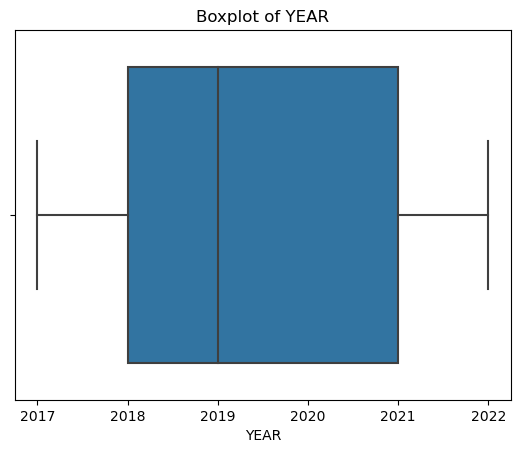

<Figure size 100x100 with 0 Axes>

In [26]:
sns.boxplot(data=df, x='YEAR')

plt.title('Boxplot of YEAR')
plt.figure(figsize=(1,1))
plt.show()

#### Insights:
- No outlier for year

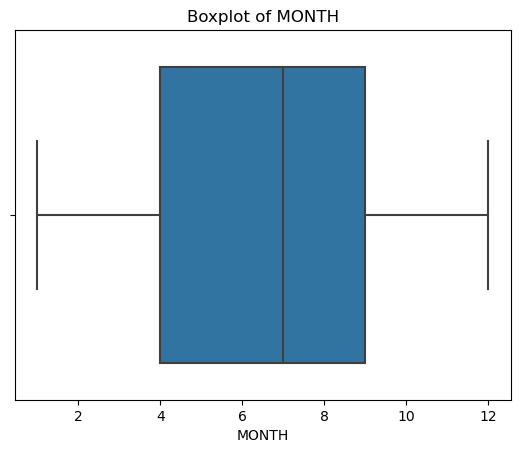

In [27]:
sns.boxplot(data=df, x='MONTH')

plt.title('Boxplot of MONTH')
plt.show()

#### Insights:
- No outlier for month

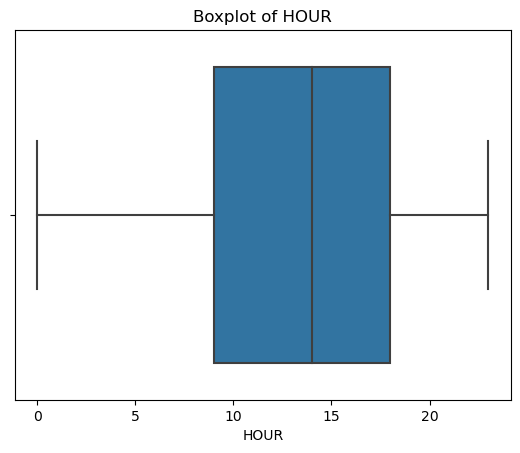

In [28]:
sns.boxplot(data=df, x='HOUR')

plt.title('Boxplot of HOUR')
plt.show()

#### Insights:
- No outlier for hour

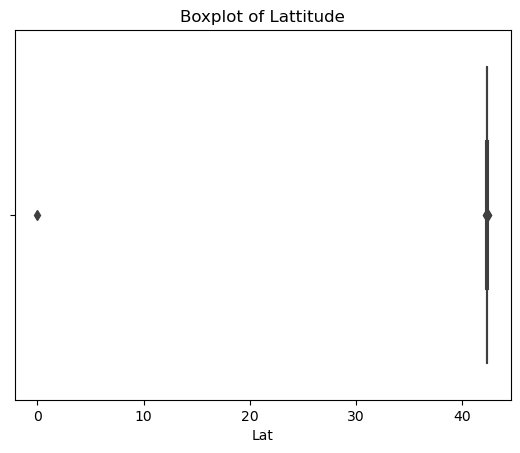

In [29]:
sns.boxplot(data=df, x='Lat')
plt.title('Boxplot of Lattitude')
plt.show()

#### Insights:
- Outlier is exist for latitude

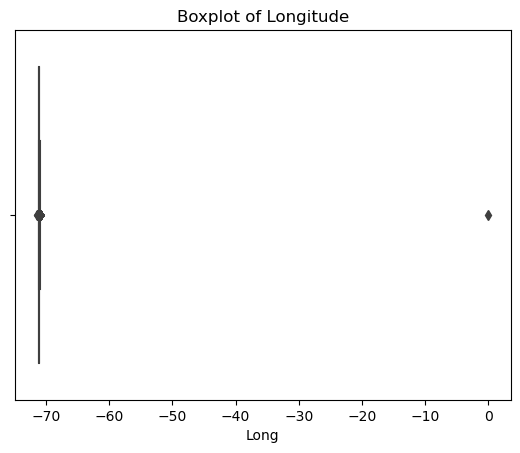

In [30]:
sns.boxplot(data=df, x='Long')

plt.title('Boxplot of Longitude')
plt.show()

#### Insights:
- Outlier exist in longtitude

In [31]:
outlier_location = df[(df['Long'] > -10) & (df['Lat'] < 10)]
outlier_location

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
357391,202094496,3802,NaN,M/V ACCIDENT - PROPERTY DAMAGE,B2,NaN,0,2020-12-27 03:47:00,2020,12,Sunday,3,NaN,GAYLAND & W COTTAGE ST ROXBURY MA 02119 UNITED ST,1.327276e-07,5.249691e-08,"(1.32727612912185e-07, 5.24969124614893e-08)"


In [32]:
import folium
# Create a base map centered around the mean of latitude and longitude
center_latitude = outlier_location['Lat'].mean()
center_longitude = outlier_location['Long'].mean()
map = folium.Map(location=[center_latitude, center_longitude], zoom_start=4)

# Add markers for latitude and longitude points from the DataFrame
for index, row in outlier_location.iterrows():
    folium.Marker(
        location=[row['Lat'], row['Long']],
        popup=row['DISTRICT']
    ).add_to(map)

# Display the map in the notebook
map

The location indicated on the map is not in Boston, will remove this outlier

In [33]:
df.drop(labels=357391, axis=0, inplace=True)

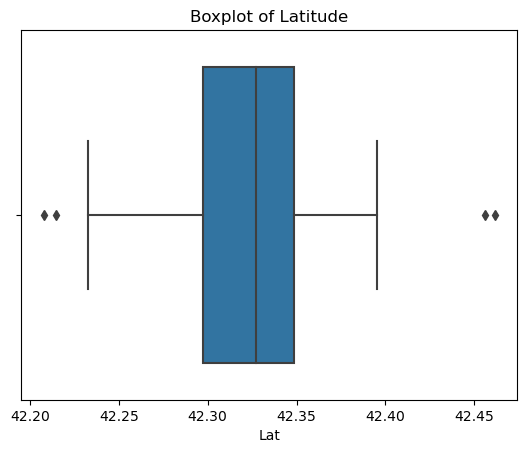

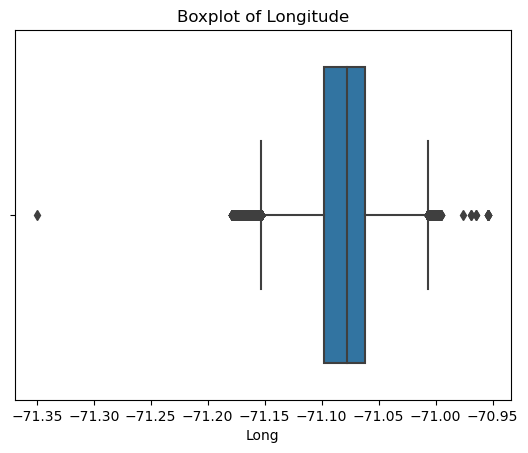

In [34]:
# Boxplot of Latitude
sns.boxplot(data=df, x='Lat')
plt.title('Boxplot of Latitude')
plt.show()

# Boxplot of Longitude
sns.boxplot(data=df, x='Long')
plt.title('Boxplot of Longitude')
plt.show()

#### Insights:
- Outlier still exist in Latitude and Longtitude

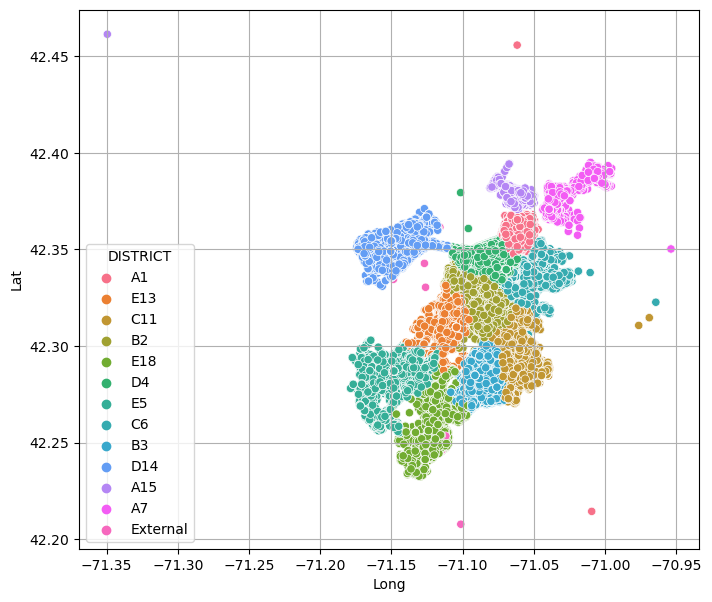

In [35]:
plt.figure(figsize=(8,7))
sns.scatterplot(data=df, x='Long', y='Lat', hue='DISTRICT')
plt.grid(True)
plt.show()

These outliers are near to Boston, will remain these outliers

## 2.5: Converting object data type to datetime data type

In [36]:
import datetime

#converting object dtype to datetime dtype
df['OCCURRED_ON_DATE'] = pd.to_datetime(df['OCCURRED_ON_DATE'], format='%Y-%m-%d %H:%M:%S')

In [37]:
#Check datatypes after conversion
df.dtypes

INCIDENT_NUMBER                object
OFFENSE_CODE                    int64
OFFENSE_CODE_GROUP             object
OFFENSE_DESCRIPTION            object
DISTRICT                       object
REPORTING_AREA                 object
SHOOTING                       object
OCCURRED_ON_DATE       datetime64[ns]
YEAR                            int64
MONTH                           int64
DAY_OF_WEEK                    object
HOUR                            int64
UCR_PART                       object
STREET                         object
Lat                           float64
Long                          float64
Location                       object
dtype: object

In [38]:
#sort the datetime in ascending order
df.sort_values('OCCURRED_ON_DATE', inplace=True)

In [39]:
df.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182050863,2629,Harassment,HARASSMENT,A1,123,NaN,2017-01-01,2017,1,Sunday,0,Part Two,KNEELAND ST,42.350826,-71.062624,"(42.35082577, -71.06262352)"
22,I172033499,1108,Fraud,FRAUD - WELFARE,B3,452,NaN,2017-01-01,2017,1,Sunday,0,Part Two,KENBERMA RD,42.295740,-71.073226,"(42.29574022, -71.07322638)"
21,I172019406,1102,Fraud,FRAUD - FALSE PRETENSE / SCHEME,C11,403,NaN,2017-01-01,2017,1,Sunday,0,Part Two,WASHINGTON ST,42.280962,-71.070807,"(42.28096173, -71.07080703)"
20,I172044522,1106,Confidence Games,FRAUD - CREDIT CARD / ATM FRAUD,C11,381,NaN,2017-01-01,2017,1,Sunday,0,Part Two,GALLIVAN BLVD,42.284543,-71.045310,"(42.28454300, -71.04531029)"
19,I172000529,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,E18,517,NaN,2017-01-01,2017,1,Sunday,0,Part Three,TYLER ST,42.246252,-71.124800,"(42.24625203, -71.12479983)"


## 2.6: Check missing value

In [40]:
#Check for missing values
df.isna().sum()

INCIDENT_NUMBER             0
OFFENSE_CODE                0
OFFENSE_CODE_GROUP     303650
OFFENSE_DESCRIPTION         0
DISTRICT                 3698
REPORTING_AREA          91723
SHOOTING               199236
OCCURRED_ON_DATE            0
YEAR                        0
MONTH                       0
DAY_OF_WEEK                 0
HOUR                        0
UCR_PART               303709
STREET                   4998
Lat                     25928
Long                    25928
Location                25928
dtype: int64

In [41]:
#Check for missing values percentage
df.isna().mean() * 100

INCIDENT_NUMBER         0.000000
OFFENSE_CODE            0.000000
OFFENSE_CODE_GROUP     60.298863
OFFENSE_DESCRIPTION     0.000000
DISTRICT                0.734349
REPORTING_AREA         18.214367
SHOOTING               39.564315
OCCURRED_ON_DATE        0.000000
YEAR                    0.000000
MONTH                   0.000000
DAY_OF_WEEK             0.000000
HOUR                    0.000000
UCR_PART               60.310579
STREET                  0.992504
Lat                     5.148786
Long                    5.148786
Location                5.148786
dtype: float64

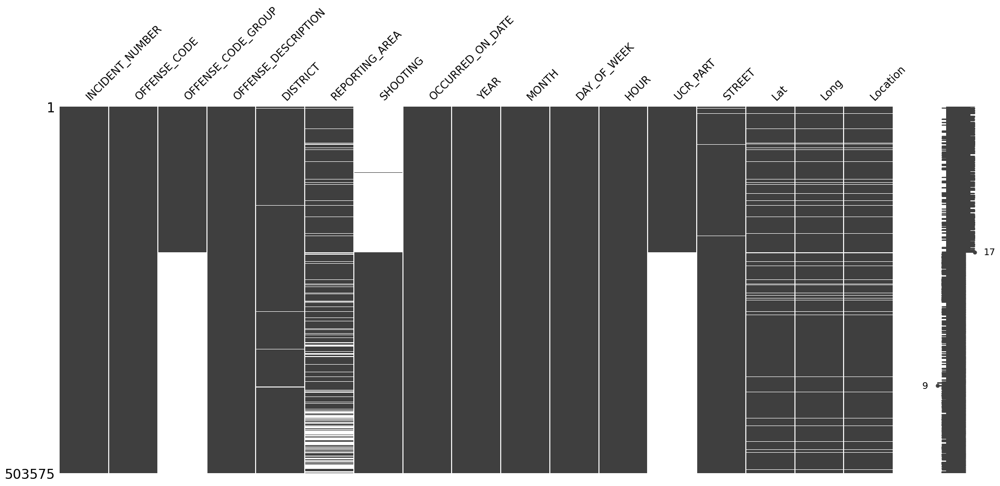

In [42]:
# Visualize missing values
import missingno as msno
msno.matrix(df)
plt.show()

## 2.6.1: Use Hot Deck/Cold Deck imputation 
(**Note: dataframe is saved as df_cold_hot)

In [43]:
# copy the dataframe
df_cold_hot = df.copy()

### 2.6.1.1: Handling the null value of column: 

#### OFFENSE_CODE_GROUP

In [44]:
#Convert all strings to uppercase
df_cold_hot['OFFENSE_CODE_GROUP'] = df_cold_hot['OFFENSE_CODE_GROUP'].str.upper()

# Remove duplicated values
offense_code_group = df_cold_hot[(df_cold_hot['OFFENSE_CODE_GROUP'].notna())][['OFFENSE_CODE', 'OFFENSE_CODE_GROUP']].drop_duplicates(keep='last')

# Create a dictionary with key = 'OFFENSE_CODE' and value = 'OFFENSE_CODE_GROUP'
offense_code_group_dict = dict(zip(offense_code_group['OFFENSE_CODE'], offense_code_group['OFFENSE_CODE_GROUP']))
del offense_code_group
offense_code_group_dict 

{339: 'ROBBERY',
 803: 'SIMPLE ASSAULT',
 1620: 'HUMAN TRAFFICKING - INVOLUNTARY SERVITUDE',
 123: 'MANSLAUGHTER',
 2664: 'OTHER',
 1901: 'GAMBLING',
 2606: 'PRISONER RELATED INCIDENTS',
 121: 'MANSLAUGHTER',
 2672: 'BIOLOGICAL THREAT',
 1864: 'DRUG VIOLATION',
 2611: 'OTHER',
 3029: 'PRISONER RELATED INCIDENTS',
 2605: 'OFFENSES AGAINST CHILD / FAMILY',
 3302: 'ASSEMBLY OR GATHERING VIOLATIONS',
 2636: 'PRISONER RELATED INCIDENTS',
 1502: 'FIREARM VIOLATIONS',
 335: 'ROBBERY',
 1108: 'FRAUD',
 2618: 'EXPLOSIVES',
 2608: 'OFFENSES AGAINST CHILD / FAMILY',
 3123: 'EXPLOSIVES',
 3016: 'MEDICAL ASSISTANCE',
 618: 'LARCENY',
 1603: 'PROSTITUTION',
 2663: 'OTHER',
 3203: 'FIREARM DISCOVERY',
 1807: 'DRUG VIOLATION',
 2010: 'HOME INVASION',
 2642: 'MISSING PERSON REPORTED',
 3004: 'MEDICAL ASSISTANCE',
 2004: 'OFFENSES AGAINST CHILD / FAMILY',
 3403: 'POLICE SERVICE INCIDENTS',
 1601: 'PROSTITUTION',
 2641: 'OTHER',
 371: 'ROBBERY',
 804: 'SIMPLE ASSAULT',
 1870: 'DRUG VIOLATION',
 1605: 'PR

In [45]:
df_cold_hot['OFFENSE_CODE_GROUP'].fillna(df_cold_hot['OFFENSE_CODE'].map(offense_code_group_dict), inplace=True)

In [46]:
#final check
df_cold_hot.isna().sum()

INCIDENT_NUMBER             0
OFFENSE_CODE                0
OFFENSE_CODE_GROUP      12272
OFFENSE_DESCRIPTION         0
DISTRICT                 3698
REPORTING_AREA          91723
SHOOTING               199236
OCCURRED_ON_DATE            0
YEAR                        0
MONTH                       0
DAY_OF_WEEK                 0
HOUR                        0
UCR_PART               303709
STREET                   4998
Lat                     25928
Long                    25928
Location                25928
dtype: int64

The remaining 12272 OFFENSE_CODE are not labelled with OFFENSE_CODE_GROUP before, perform listwise deletion to remove them

In [47]:
df_cold_hot.dropna(subset=['OFFENSE_CODE_GROUP'], inplace=True)

In [48]:
#final check
df_cold_hot.isna().sum()

INCIDENT_NUMBER             0
OFFENSE_CODE                0
OFFENSE_CODE_GROUP          0
OFFENSE_DESCRIPTION         0
DISTRICT                 3583
REPORTING_AREA          89268
SHOOTING               199236
OCCURRED_ON_DATE            0
YEAR                        0
MONTH                       0
DAY_OF_WEEK                 0
HOUR                        0
UCR_PART               291437
STREET                   4956
Lat                     25560
Long                    25560
Location                25560
dtype: int64

### 2.6.1.2: Handling the null value of column:
### DISTRICT

Techique: Impute by referencing the STREET

In [49]:
district_df = df_cold_hot[df_cold_hot['DISTRICT'].notna()][['STREET', 'DISTRICT']]
district_df.drop_duplicates(keep='last', inplace=True)
district_df_count = pd.DataFrame(district_df.value_counts()).reset_index()
district_df_count['STREET'].value_counts()[district_df_count['STREET'].value_counts() > 1].index

Index(['WASHINGTON STREET', 'BSTN MA', 'WASHINGTON ST',
       '3347 WASHINGTON ST JAMAICA PLAIN MA 02130 UNITED', 'BOYLSTON ST',
       'BLUE HILL AVE', 'HARRISON AVE', 'GIBSON ST',
       '40 GIBSON ST DORCHESTER MA 02122 UNITED STATES', 'TREMONT ST',
       ...
       'BOWDOIN ST & DRAPER ST DORCHESTER MA 02122 UNITED', 'HEATH ST',
       'MONMOUTH ST', 'FULLER ST & WASHINGTON ST BOSTON MA 02124 UNITED',
       'HARVEST ST', 'GLENDALE ST',
       'NEWBURY ST & DARTMOUTH ST BOSTON MA 02116 UNITED', 'FOREST HILLS AVE',
       'TREMONT', 'HUBBARD ST'],
      dtype='object', length=868)

In [50]:
for street_name in district_df_count['STREET'].value_counts()[district_df_count['STREET'].value_counts() > 1].index:
    mode_district = district_df_count[district_df_count['STREET'] == street_name]['DISTRICT'].mode()[0]
    print(f'Street Name: {street_name}\nDistrict mode value: {mode_district}\n\n')


Street Name: WASHINGTON STREET
District mode value: A1


Street Name: BSTN MA
District mode value: A1


Street Name: WASHINGTON ST
District mode value: A1


Street Name: 3347 WASHINGTON ST JAMAICA PLAIN MA 02130 UNITED
District mode value: A1


Street Name: BOYLSTON ST
District mode value: A1


Street Name: BLUE HILL AVE
District mode value: A1


Street Name: HARRISON AVE
District mode value: A1


Street Name: GIBSON ST
District mode value: A1


Street Name: 40 GIBSON ST DORCHESTER MA 02122 UNITED STATES
District mode value: A1


Street Name: TREMONT ST
District mode value: A1


Street Name: 2400 WASHINGTON ST ROXBURY MA 02119 UNITED STATES
District mode value: A1


Street Name: SCHOOL ST
District mode value: A1


Street Name: MA
District mode value: A1


Street Name: RIVER ST
District mode value: A1


Street Name: CENTRE ST
District mode value: B2


Street Name: PARIS ST
District mode value: A1


Street Name: HUNTINGTON AVE
District mode value: B2


Street Name: PARK ST
District mode 

Street Name: PARK STREET
District mode value: A1


Street Name: BARRY ST
District mode value: A15


Street Name: MORRISEY BLVD
District mode value: C11


Street Name: MOUNT VERNON STREET
District mode value: A1


Street Name: TD GARDEN
District mode value: A1


Street Name: LONG ISLAND RD
District mode value: C11


Street Name: HIGHLAND ST
District mode value: B2


Street Name: MAGNOLIA ST
District mode value: B2


Street Name: CAMBRIDGE STREET
District mode value: A1


Street Name: SOUTHAMPTON ST
District mode value: B2


Street Name: WEST BROADWAY
District mode value: C11


Street Name: ALLSTON ST
District mode value: A15


Street Name: MT VERNON ST
District mode value: A1


Street Name: SHAWMUT AVE
District mode value: A1


Street Name: NORTON ST
District mode value: C11


Street Name: MILTON AVE
District mode value: B3


Street Name: HYDE PARK AVENUE
District mode value: E13


Street Name: POND ST
District mode value: C11


Street Name: ALLSTATE RD
District mode value: B2


Street 

Street Name: MARGINAL ST
District mode value: A7


Street Name: CLEAVES ST
District mode value: B3


Street Name: COLUMBIA RD & STANWOOD ST DORCHESTER MA 02121 UNI
District mode value: B2


Street Name: 272 BOWDOIN ST DORCHESTER MA 02122 UNITED STATES
District mode value: B2


Street Name: COLUMBIA RD & STOUGHTON ST DORCHESTER MA 02125 UN
District mode value: B2


Street Name: 2001 WASHINGTON ST ROXBURY MA 02120 UNITED STATES
District mode value: B2


Street Name: COLUMBIA RD & WASHINGTON ST BOSTON MA 02121 UNITE
District mode value: B2


Street Name: COLUMBIA RD & WASHINGTON ST DORCHESTER MA 02121 U
District mode value: B2


Street Name: ROSEMONT ST
District mode value: C11


Street Name: PROCTOR ST
District mode value: B2


Street Name: MARSH ST
District mode value: C11


Street Name: CHESTNUT STREET
District mode value: A1


Street Name: ROSEDALE ST & WASHINGTON ST DORCHESTER MA 02124 U
District mode value: B3


Street Name: OLD RD & COLUMBIA RD DORCHESTER MA 02121 UNITED S
District

Street Name: DRISCOLL DR
District mode value: B3


Street Name: BRIGHTON AVE
District mode value: D14


Street Name: SOUTHBAY
District mode value: C11


Street Name: SCHOOL ST & WASHINGTON ST BOSTON MA 02108 UNITED
District mode value: A1


Street Name: SANFORD ST
District mode value: B3


Street Name: ALFORD STREET
District mode value: A15


Street Name: GOULD ST
District mode value: D14


Street Name: EDGERLY PL
District mode value: A1


Street Name: NORMANDY ST
District mode value: B2


Street Name: FOREST PL
District mode value: A15


Street Name: ARLINGTON STREET
District mode value: D14


Street Name: FORBES ST
District mode value: C11


Street Name: EDGEWATER DR
District mode value: B3


Street Name: MA-3A
District mode value: C11


Street Name: DARTMOUTH ST & STUART ST BOSTON MA 02116 UNITED S
District mode value: A1


Street Name: GALLIVAN BLVD
District mode value: B3


Street Name: MAPLE PL
District mode value: A1


Street Name: ALASKA ST
District mode value: B2


Street Name

Use mode value of DISTRICT to impute the missing value

In [51]:
district_df = pd.DataFrame(district_df.groupby('STREET')['DISTRICT'].agg(pd.Series.mode).reset_index())

# Get the mode at position 0 from mode list. Because some times, there can exist 2 or more mode
district_df['DISTRICT'] = district_df['DISTRICT'].apply(lambda x: x[0] if type(x) == np.ndarray else x)

In [52]:
# Create a district dictionary with key = 'STREET' and value = 'DISTRICT'
district_dict = district_df.set_index('STREET')['DISTRICT'].to_dict()

In [53]:
df_cold_hot['DISTRICT'].fillna(df_cold_hot['STREET'].map(district_dict), inplace=True)

In [54]:
df_cold_hot.isna().sum()

INCIDENT_NUMBER             0
OFFENSE_CODE                0
OFFENSE_CODE_GROUP          0
OFFENSE_DESCRIPTION         0
DISTRICT                 1448
REPORTING_AREA          89268
SHOOTING               199236
OCCURRED_ON_DATE            0
YEAR                        0
MONTH                       0
DAY_OF_WEEK                 0
HOUR                        0
UCR_PART               291437
STREET                   4956
Lat                     25560
Long                    25560
Location                25560
dtype: int64

The remaining missing DISTRICT does not have STREET value, perform listwise deletion

In [55]:
df_cold_hot.dropna(subset=['DISTRICT'], inplace=True)

In [56]:
# final check
df_cold_hot.isna().sum()

INCIDENT_NUMBER             0
OFFENSE_CODE                0
OFFENSE_CODE_GROUP          0
OFFENSE_DESCRIPTION         0
DISTRICT                    0
REPORTING_AREA          87943
SHOOTING               198243
OCCURRED_ON_DATE            0
YEAR                        0
MONTH                       0
DAY_OF_WEEK                 0
HOUR                        0
UCR_PART               290982
STREET                   4197
Lat                     24923
Long                    24923
Location                24923
dtype: int64

### 2.6.1.3: Handling the null value of column:
### REPORTING_AREA
Technique: Impute by referencing the STREET column

In [57]:
street_df = df_cold_hot[(df_cold_hot['STREET'].notna()) & (df_cold_hot['REPORTING_AREA'].notna())][['STREET', 'REPORTING_AREA']]
street_df.drop_duplicates(keep='last', inplace=True)

In [58]:
street_df = pd.DataFrame(street_df.groupby('STREET')['REPORTING_AREA'].agg(pd.Series.mode).reset_index())
street_df['REPORTING_AREA'] = street_df['REPORTING_AREA'].apply(lambda x: x[0] if type(x) == np.ndarray else x)
street_dict = street_df.set_index('STREET')['REPORTING_AREA'].to_dict()
del street_df

In [59]:
df_cold_hot['REPORTING_AREA'].fillna(df_cold_hot['STREET'].map(street_dict), inplace=True)

In [60]:
# final check
df_cold_hot.isna().sum()

INCIDENT_NUMBER             0
OFFENSE_CODE                0
OFFENSE_CODE_GROUP          0
OFFENSE_DESCRIPTION         0
DISTRICT                    0
REPORTING_AREA          15187
SHOOTING               198243
OCCURRED_ON_DATE            0
YEAR                        0
MONTH                       0
DAY_OF_WEEK                 0
HOUR                        0
UCR_PART               290982
STREET                   4197
Lat                     24923
Long                    24923
Location                24923
dtype: int64

The remaining missing REPORTING_AREA does not have STREET, perform listwise deletion

In [61]:
df_cold_hot.dropna(subset=['REPORTING_AREA'], inplace=True)

In [62]:
# final check
df_cold_hot.isna().sum()

INCIDENT_NUMBER             0
OFFENSE_CODE                0
OFFENSE_CODE_GROUP          0
OFFENSE_DESCRIPTION         0
DISTRICT                    0
REPORTING_AREA              0
SHOOTING               194762
OCCURRED_ON_DATE            0
YEAR                        0
MONTH                       0
DAY_OF_WEEK                 0
HOUR                        0
UCR_PART               279291
STREET                    701
Lat                     21215
Long                    21215
Location                21215
dtype: int64

### 2.6.1.4: Handling the null value of column:
### SHOOTING
Technique: Impute by referencing the extra datasets and OFFENSE_CODE column.

Extra dataset:
1. shootings.csv 

About this file: The Shootings dashboard contains information on shooting incidents where a victim was struck by a bullet, either fatally or non-fatally; that occurred in the City of Boston and fall under Boston Police Department jurisdiction.
https://data.boston.gov/dataset/shootings


2. shots_fired.csv

About this file: The Shots Fired dashboard contains information on shooting incidents that did not result in any victim(s) being struck; but occurred in the city of Boston and fall under Boston Police Department jurisdiction. https://data.boston.gov/dataset/shots-fired


In [63]:
extra_shooting1 = pd.read_csv('extra_crime_dataset/shootings.csv', usecols=['incident_num'])
extra_shooting2 = pd.read_csv('extra_crime_dataset/shots_fired.csv', usecols=['incident_num'])
extra_shooting = pd.concat([extra_shooting1, extra_shooting2], ignore_index=True)
extra_shooting.drop_duplicates(keep='last', inplace=True)
del extra_shooting1, extra_shooting2

In [64]:
extra_shooting['Shooting'] = 'Yes'
extra_shooting_dict = extra_shooting.set_index('incident_num')['Shooting'].to_dict()
del extra_shooting

Standardize the value shooting

In [65]:
df_cold_hot['SHOOTING'] = df_cold_hot['SHOOTING'].map({'Y':'Yes', '1':'Yes', '0':'No'})

In [66]:
df_cold_hot['SHOOTING'].unique()

array([nan, 'Yes', 'No'], dtype=object)

In [67]:
df_cold_hot['SHOOTING'].fillna(df_cold_hot['INCIDENT_NUMBER'].map(extra_shooting_dict), inplace=True)

In [68]:
df_cold_hot.isna().sum()

INCIDENT_NUMBER             0
OFFENSE_CODE                0
OFFENSE_CODE_GROUP          0
OFFENSE_DESCRIPTION         0
DISTRICT                    0
REPORTING_AREA              0
SHOOTING               192885
OCCURRED_ON_DATE            0
YEAR                        0
MONTH                       0
DAY_OF_WEEK                 0
HOUR                        0
UCR_PART               279291
STREET                    701
Lat                     21215
Long                    21215
Location                21215
dtype: int64

Check which offense code has both shooting and non-shooting events

In [69]:
shooting_offense_list = list(df_cold_hot[df_cold_hot['SHOOTING'] == 'Yes']['OFFENSE_CODE'].unique())
no_shooting_offense_list = list(df_cold_hot[df_cold_hot['SHOOTING'] == 'No']['OFFENSE_CODE'].unique())
crimes_with_shooting_and_no_shooting_list = list(filter(lambda x: x in no_shooting_offense_list, shooting_offense_list)) 
print(crimes_with_shooting_and_no_shooting_list)
del shooting_offense_list, no_shooting_offense_list

[3114, 413, 2662, 3115, 1501, 111, 1510, 1504, 361, 381, 1402, 423, 3106, 3207, 301, 3125, 802, 3130, 1874, 3801, 2622, 2660, 2610, 1848, 3119, 1806, 3410, 1849, 3170, 3803, 2405, 2900, 2010, 3304, 724, 3006, 1845, 2907, 1300, 311, 2007, 3301, 3831, 3001, 3201, 2403, 1503, 3802, 1841, 1843, 2641, 1847, 2647, 3109, 3807, 3111, 617, 2906, 2905, 706, 1844, 371, 619, 3018, 3805, 3007, 1810, 3110, 801, 520, 3008, 1304, 3016, 2657]


In [70]:
shootingdf = df_cold_hot[['OFFENSE_CODE', 'OFFENSE_DESCRIPTION', 'SHOOTING']]
shootingdf = df_cold_hot[df_cold_hot['SHOOTING'].notna()]
both_shooting_df = shootingdf[shootingdf['OFFENSE_CODE'].isin(crimes_with_shooting_and_no_shooting_list)]
both_shooting_df

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
30,I172000007,3114,INVESTIGATE PROPERTY,INVESTIGATE PROPERTY,B3,427,Yes,2017-01-01 00:16:00,2017,1,Sunday,0,Part Three,EVELYN ST,NaN,NaN,NaN
31,I172000051,3114,INVESTIGATE PROPERTY,INVESTIGATE PROPERTY,B3,435,Yes,2017-01-01 00:18:00,2017,1,Sunday,0,Part Three,WHITMAN ST,42.287017,-71.077065,"(42.28701738, -71.07706453)"
84,I172000047,413,AGGRAVATED ASSAULT,ASSAULT - AGGRAVATED - BATTERY,B3,442,Yes,2017-01-01 02:26:00,2017,1,Sunday,2,Part One,BROWNING AVE,42.294150,-71.081750,"(42.29415023, -71.08175047)"
431,I172000430,3114,INVESTIGATE PROPERTY,INVESTIGATE PROPERTY,B2,316,Yes,2017-01-02 16:59:00,2017,1,Monday,16,Part Three,WALNUT AVE,42.315278,-71.093618,"(42.31527777, -71.09361838)"
438,I172000436,2662,BALLISTICS,BALLISTICS EVIDENCE/FOUND,B2,330,Yes,2017-01-02 17:21:00,2017,1,Monday,17,Part Two,BLUE HILL AVE,42.304339,-71.084779,"(42.30433950, -71.08477887)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
503872,232000091,1402,VANDALISM,VANDALISM,A1,66,No,2022-12-31 23:30:00,2022,12,Saturday,23,NaN,CHARLES ST,42.359790,-71.070782,"(42.35979037458775, -71.07078234449541)"
503873,232000002,3831,MOTOR VEHICLE ACCIDENT RESPONSE,M/V - LEAVING SCENE - PROPERTY DAMAGE,C11,167,No,2022-12-31 23:37:00,2022,12,Saturday,23,NaN,COLUMBIA RD,42.319593,-71.062607,"(42.31959298334654, -71.06260699634272)"
503874,232000140,619,LARCENY,LARCENY ALL OTHERS,D14,778,No,2022-12-31 23:45:00,2022,12,Saturday,23,NaN,WASHINGTON ST,42.349056,-71.150498,"(42.34905600030506, -71.15049849975023)"
503875,232000315,3201,PROPERTY LOST,PROPERTY - LOST/ MISSING,D4,167,No,2022-12-31 23:50:00,2022,12,Saturday,23,NaN,HARRISON AVENUE,NaN,NaN,NaN


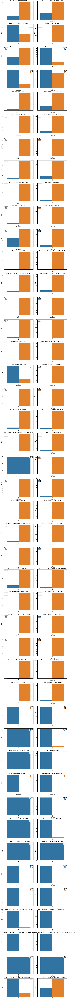

In [71]:

import math

# Assuming you have the data in both_shooting_df DataFrame

# Get the unique values of OFFENSE_DESCRIPTION column
unique_offense_desc = both_shooting_df['OFFENSE_DESCRIPTION'].unique()

# Calculate the number of rows and columns for the subplot grid
num_rows = math.ceil(len(unique_offense_desc) / 2)
num_cols = 2

# Create the subplot grid
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows*5))
axes = axes.flatten()

# Plot a count plot for each offense description
for i, offense_desc in enumerate(unique_offense_desc):
    ax = axes[i]
    subset = both_shooting_df[both_shooting_df['OFFENSE_DESCRIPTION'] == offense_desc]
    sns.countplot(data=subset, x='OFFENSE_CODE', hue='SHOOTING', ax=ax)
    ax.set_title(f"Offense Description: {offense_desc}")
    ax.legend(title='SHOOTING')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# Remove any empty subplots
for i in range(len(unique_offense_desc), num_rows*num_cols):
    fig.delaxes(axes[i])

# Adjust layout and display the plots
plt.tight_layout()
plt.show()


From the graph above, some crimes has higher number of shooting event, while some crimes has lesser number of shooting event. We can use this mode value to impute the missing value

Group the offense code by mode from shooting column

In [72]:
group_shooting = shootingdf.groupby(['OFFENSE_CODE'])['SHOOTING'].agg(pd.Series.mode)
group_shooting.head()

OFFENSE_CODE
111    Yes
121     No
123    Yes
301     No
311     No
Name: SHOOTING, dtype: object

In [73]:
# Creating a dictionary with key as 'offense_code', and value as 'mode value for shooting category'
shooting_category_dict = group_shooting.to_dict()

In [74]:
# Impute the missing shooting value
df_cold_hot['SHOOTING'] = df_cold_hot['SHOOTING'].fillna(df_cold_hot['OFFENSE_CODE'].map(shooting_category_dict))

In [75]:
df_cold_hot['SHOOTING'].value_counts()

No     467904
Yes      6328
Name: SHOOTING, dtype: int64

In [76]:
# final check
df_cold_hot.isna().sum()

INCIDENT_NUMBER             0
OFFENSE_CODE                0
OFFENSE_CODE_GROUP          0
OFFENSE_DESCRIPTION         0
DISTRICT                    0
REPORTING_AREA              0
SHOOTING                  436
OCCURRED_ON_DATE            0
YEAR                        0
MONTH                       0
DAY_OF_WEEK                 0
HOUR                        0
UCR_PART               279291
STREET                    701
Lat                     21215
Long                    21215
Location                21215
dtype: int64

The remaining missing SHOOTING value does not have OFFENSE_CODE that indicate whether shooting exist or not. Perform listwise deletion. 

In [77]:
df_cold_hot.dropna(subset=['SHOOTING'], inplace=True)

In [78]:
#final check
df_cold_hot.isna().sum()

INCIDENT_NUMBER             0
OFFENSE_CODE                0
OFFENSE_CODE_GROUP          0
OFFENSE_DESCRIPTION         0
DISTRICT                    0
REPORTING_AREA              0
SHOOTING                    0
OCCURRED_ON_DATE            0
YEAR                        0
MONTH                       0
DAY_OF_WEEK                 0
HOUR                        0
UCR_PART               279284
STREET                    701
Lat                     21203
Long                    21203
Location                21203
dtype: int64

In [79]:
df_cold_hot['SHOOTING'].unique()

array(['No', 'Yes'], dtype=object)

### 2.6.1.5: Handling the null value of column:

### UCR_PART

Method: Hot-deck imputation

In [80]:
offense_ucr_part = df_cold_hot[['OFFENSE_CODE','UCR_PART']]
offense_ucr_part = offense_ucr_part[offense_ucr_part['UCR_PART'].notna()]
offense_ucr_part = offense_ucr_part.drop_duplicates(keep="first")

In [81]:
df_cold_hot.dtypes

INCIDENT_NUMBER                object
OFFENSE_CODE                    int64
OFFENSE_CODE_GROUP             object
OFFENSE_DESCRIPTION            object
DISTRICT                       object
REPORTING_AREA                 object
SHOOTING                       object
OCCURRED_ON_DATE       datetime64[ns]
YEAR                            int64
MONTH                           int64
DAY_OF_WEEK                    object
HOUR                            int64
UCR_PART                       object
STREET                         object
Lat                           float64
Long                          float64
Location                       object
dtype: object

In [82]:
offense_ucr_part_dict = offense_ucr_part.set_index('OFFENSE_CODE')['UCR_PART'].to_dict()
offense_ucr_part_dict

{2629: 'Part Two',
 1108: 'Part Two',
 1102: 'Part Two',
 1106: 'Part Two',
 3831: 'Part Three',
 616: 'Part One',
 3802: 'Part Three',
 724: 'Part One',
 3001: 'Part Three',
 3114: 'Part Three',
 3115: 'Part Three',
 3112: 'Part Three',
 3201: 'Part Three',
 1107: 'Part Two',
 619: 'Part One',
 802: 'Part Two',
 1402: 'Part Two',
 2647: 'Part Two',
 3301: 'Part Three',
 617: 'Part One',
 3801: 'Part Three',
 3006: 'Part Three',
 3108: 'Part Three',
 2662: 'Part Two',
 3111: 'Part Three',
 413: 'Part One',
 3805: 'Part Three',
 3410: 'Part Three',
 3502: 'Part Three',
 1300: 'Part Two',
 614: 'Part One',
 3125: 'Part Three',
 2610: 'Part Two',
 2405: 'Part Two',
 2905: 'Part Two',
 801: 'Part Two',
 2403: 'Part Two',
 3008: 'Part Three',
 3119: 'Part Three',
 301: 'Part One',
 3207: 'Part Three',
 520: 'Part One',
 311: 'Part One',
 361: 'Part One',
 3018: 'Part Three',
 423: 'Part One',
 2900: 'Part Two',
 3501: 'Part Three',
 611: 'Part One',
 1830: 'Part Two',
 3803: 'Part Three',
 

In [83]:
df_cold_hot['UCR_PART'] = df_cold_hot['UCR_PART'].fillna(df_cold_hot['OFFENSE_CODE'].map(offense_ucr_part_dict))

Check missing value frequency and percentage

In [84]:
df_cold_hot.isna().sum()

INCIDENT_NUMBER            0
OFFENSE_CODE               0
OFFENSE_CODE_GROUP         0
OFFENSE_DESCRIPTION        0
DISTRICT                   0
REPORTING_AREA             0
SHOOTING                   0
OCCURRED_ON_DATE           0
YEAR                       0
MONTH                      0
DAY_OF_WEEK                0
HOUR                       0
UCR_PART                  53
STREET                   701
Lat                    21203
Long                   21203
Location               21203
dtype: int64

Remove the remaining missing UCR_PART values because these offense_codes has never been labelled with ucr_part before

In [85]:
df_cold_hot.dropna(subset=['UCR_PART'], inplace=True)

In [86]:
# final check
df_cold_hot.isna().sum()

INCIDENT_NUMBER            0
OFFENSE_CODE               0
OFFENSE_CODE_GROUP         0
OFFENSE_DESCRIPTION        0
DISTRICT                   0
REPORTING_AREA             0
SHOOTING                   0
OCCURRED_ON_DATE           0
YEAR                       0
MONTH                      0
DAY_OF_WEEK                0
HOUR                       0
UCR_PART                   0
STREET                   701
Lat                    21203
Long                   21203
Location               21203
dtype: int64

In [87]:
df_cold_hot.isna().mean() * 100

INCIDENT_NUMBER        0.000000
OFFENSE_CODE           0.000000
OFFENSE_CODE_GROUP     0.000000
OFFENSE_DESCRIPTION    0.000000
DISTRICT               0.000000
REPORTING_AREA         0.000000
SHOOTING               0.000000
OCCURRED_ON_DATE       0.000000
YEAR                   0.000000
MONTH                  0.000000
DAY_OF_WEEK            0.000000
HOUR                   0.000000
UCR_PART               0.000000
STREET                 0.147834
Lat                    4.471518
Long                   4.471518
Location               4.471518
dtype: float64

### 2.6.1.6: Handling the null value of column:
### STREET,   Lat, Long,  Location

In [88]:
# Check for the percentage of row numbers where 'Lat' is missing
print(f"{((df_cold_hot['Lat'].isna().sum() / df_cold_hot.shape[0]) * 100):.1f}% of rows have missing values.")

4.5% of rows have missing values.


Note: If 'Lat' is missing, then 'Long' and 'Location' will be missing as well as there are interconnected.

In [89]:
# Check rows with missing values in the 'Lat' column
lat_na = df_cold_hot[df_cold_hot['Lat'].isnull()]
lat_na.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
30,I172000007,3114,INVESTIGATE PROPERTY,INVESTIGATE PROPERTY,B3,427,Yes,2017-01-01 00:16:00,2017,1,Sunday,0,Part Three,EVELYN ST,NaN,NaN,NaN
74,I172000049,802,SIMPLE ASSAULT,ASSAULT SIMPLE - BATTERY,C6,226,No,2017-01-01 02:04:00,2017,1,Sunday,2,Part Two,E FOURTH ST,NaN,NaN,NaN
183,I182054544,619,LARCENY,LARCENY ALL OTHERS,B3,428,No,2017-01-01 12:00:00,2017,1,Sunday,12,Part One,MORTON,NaN,NaN,NaN
216,I172000177,3831,MOTOR VEHICLE ACCIDENT RESPONSE,M/V - LEAVING SCENE - PROPERTY DAMAGE,B2,315,No,2017-01-01 15:35:00,2017,1,Sunday,15,Part Three,HUMBOLDT AVE,NaN,NaN,NaN
269,I172000227,3002,MEDICAL ASSISTANCE,ANIMAL CONTROL - DOG BITES - ETC.,C6,214,No,2017-01-01 21:00:00,2017,1,Sunday,21,Part Three,W BROADWAY,NaN,NaN,NaN


In [90]:
# find out how many rows where "STREET" column are not missing but 'Lat' column is missing

latna_street_notna = lat_na['STREET'].notna().sum()
print(latna_street_notna, 'out of 25928 rows contains "STREET" data.')
print(f'{((latna_street_notna/25928)*100):.1f}% of rows contains "STREET" data.')

20754 out of 25928 rows contains "STREET" data.
80.0% of rows contains "STREET" data.


In [91]:
# find out the rows where "STREET" and "Lat" is not missing
stlat_notna = df_cold_hot[(df_cold_hot['STREET'].notna()) & df_cold_hot['Lat'].notna()]

# find out the number of rows where it have complete street name and latitude that can be used in imputing other rows
count_matching_rows = (lat_na['STREET'][lat_na['STREET'].notna()]).isin(stlat_notna['STREET']).sum()
print(count_matching_rows, 'out of 22936 rows with complete street name and latitude.')
print('These rows can be use to impute some of the missing rows.')

18676 out of 22936 rows with complete street name and latitude.
These rows can be use to impute some of the missing rows.


In [92]:
# Group the DataFrame by 'STREET' and calculate the median latitude and longitude for each street
median_lat_by_street = df_cold_hot.groupby('STREET')['Lat'].median()
median_long_by_street = df_cold_hot.groupby('STREET')['Long'].median()

# Iterate through rows with missing 'Lat', 'Long', 'Location' values and non-null 'STREET' values 
# and impute those rows with the median found above
for index, row in df_cold_hot[(df_cold_hot['Lat'].isnull()) & (df_cold_hot['STREET'].notna())].iterrows():
    street = row['STREET']
    if street in median_lat_by_street and street in median_long_by_street:
        median_lat = median_lat_by_street[street]
        median_long = median_long_by_street[street]
        loc = '(' + str(median_lat) + ', ' + str(median_long) + ')'
        df_cold_hot.at[index, 'Lat'] = median_lat
        df_cold_hot.at[index, 'Long'] = median_long
        if not pd.isna(median_lat) and not pd.isna(median_long):
            df_cold_hot.at[index, 'Location'] = loc

In [93]:
df_cold_hot.isna().sum()

INCIDENT_NUMBER           0
OFFENSE_CODE              0
OFFENSE_CODE_GROUP        0
OFFENSE_DESCRIPTION       0
DISTRICT                  0
REPORTING_AREA            0
SHOOTING                  0
OCCURRED_ON_DATE          0
YEAR                      0
MONTH                     0
DAY_OF_WEEK               0
HOUR                      0
UCR_PART                  0
STREET                  701
Lat                    2527
Long                   2527
Location               2527
dtype: int64

For the rows that without street names, it is not possible to impute. So, it will be removed.

In [94]:
# Removing all rows where 'STREET' is NA
df_cold_hot = df_cold_hot.dropna(subset=['STREET'], how='all')

In [95]:
df_cold_hot.isna().sum()

INCIDENT_NUMBER           0
OFFENSE_CODE              0
OFFENSE_CODE_GROUP        0
OFFENSE_DESCRIPTION       0
DISTRICT                  0
REPORTING_AREA            0
SHOOTING                  0
OCCURRED_ON_DATE          0
YEAR                      0
MONTH                     0
DAY_OF_WEEK               0
HOUR                      0
UCR_PART                  0
STREET                    0
Lat                    2078
Long                   2078
Location               2078
dtype: int64

In [96]:
df_cold_hot.isna().mean()*100

INCIDENT_NUMBER        0.00000
OFFENSE_CODE           0.00000
OFFENSE_CODE_GROUP     0.00000
OFFENSE_DESCRIPTION    0.00000
DISTRICT               0.00000
REPORTING_AREA         0.00000
SHOOTING               0.00000
OCCURRED_ON_DATE       0.00000
YEAR                   0.00000
MONTH                  0.00000
DAY_OF_WEEK            0.00000
HOUR                   0.00000
UCR_PART               0.00000
STREET                 0.00000
Lat                    0.43888
Long                   0.43888
Location               0.43888
dtype: float64

In [97]:
df_cold_hot = df_cold_hot.dropna(subset=['Lat'], how='all')

In [98]:
#final check
df_cold_hot.isna().sum()

INCIDENT_NUMBER        0
OFFENSE_CODE           0
OFFENSE_CODE_GROUP     0
OFFENSE_DESCRIPTION    0
DISTRICT               0
REPORTING_AREA         0
SHOOTING               0
OCCURRED_ON_DATE       0
YEAR                   0
MONTH                  0
DAY_OF_WEEK            0
HOUR                   0
UCR_PART               0
STREET                 0
Lat                    0
Long                   0
Location               0
dtype: int64

## 2.6.2: Using mean, mode and median

### 2.6.2.1: Duplicate original DataFrame

Duplicate the original DataFrame for handling missing values with mean, mode and median

In [99]:
df_mean_mode = df.copy()

In [100]:
df_mean_mode

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182050863,2629,Harassment,HARASSMENT,A1,123,NaN,2017-01-01 00:00:00,2017,1,Sunday,0,Part Two,KNEELAND ST,42.350826,-71.062624,"(42.35082577, -71.06262352)"
22,I172033499,1108,Fraud,FRAUD - WELFARE,B3,452,NaN,2017-01-01 00:00:00,2017,1,Sunday,0,Part Two,KENBERMA RD,42.295740,-71.073226,"(42.29574022, -71.07322638)"
21,I172019406,1102,Fraud,FRAUD - FALSE PRETENSE / SCHEME,C11,403,NaN,2017-01-01 00:00:00,2017,1,Sunday,0,Part Two,WASHINGTON ST,42.280962,-71.070807,"(42.28096173, -71.07080703)"
20,I172044522,1106,Confidence Games,FRAUD - CREDIT CARD / ATM FRAUD,C11,381,NaN,2017-01-01 00:00:00,2017,1,Sunday,0,Part Two,GALLIVAN BLVD,42.284543,-71.045310,"(42.28454300, -71.04531029)"
19,I172000529,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,E18,517,NaN,2017-01-01 00:00:00,2017,1,Sunday,0,Part Three,TYLER ST,42.246252,-71.124800,"(42.24625203, -71.12479983)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
503872,232000091,1402,NaN,VANDALISM,A1,66,0,2022-12-31 23:30:00,2022,12,Saturday,23,NaN,CHARLES ST,42.359790,-71.070782,"(42.35979037458775, -71.07078234449541)"
503873,232000002,3831,NaN,M/V - LEAVING SCENE - PROPERTY DAMAGE,C11,NaN,0,2022-12-31 23:37:00,2022,12,Saturday,23,NaN,COLUMBIA RD,42.319593,-71.062607,"(42.31959298334654, -71.06260699634272)"
503874,232000140,619,NaN,LARCENY ALL OTHERS,D14,778,0,2022-12-31 23:45:00,2022,12,Saturday,23,NaN,WASHINGTON ST,42.349056,-71.150498,"(42.34905600030506, -71.15049849975023)"
503875,232000315,3201,NaN,PROPERTY - LOST/ MISSING,D4,167,0,2022-12-31 23:50:00,2022,12,Saturday,23,NaN,HARRISON AVENUE,NaN,NaN,NaN


### 2.6.2.2: Handling the null value of column: 
### OFFENSE_CODE_GROUP 

In [101]:
# View the rows where OFFENSE_CODE_GROUP are null
df_mean_mode[df_mean_mode['OFFENSE_CODE_GROUP'].isna()]

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
200248,192000329,614,NaN,LARCENY THEFT FROM MV - NON-ACCESSORY,C11,345,0,2019-01-01 00:00:00,2019,1,Tuesday,0,NaN,HOMES AVE,42.303441,-71.066746,"(42.30344062, -71.06674611)"
200247,202011340,2670,NaN,HARASSMENT/ CRIMINAL HARASSMENT,C11,NaN,0,2019-01-01 00:00:00,2019,1,Tuesday,0,NaN,MORSE ST,42.297555,-71.059709,"(42.29755532959655, -71.05970910242573)"
200246,192023961,3201,NaN,PROPERTY - LOST,C11,358,0,2019-01-01 00:00:00,2019,1,Tuesday,0,NaN,PARK ST,NaN,NaN,NaN
200245,192097179,2670,NaN,HARASSMENT/ CRIMINAL HARASSMENT,C11,NaN,0,2019-01-01 00:00:00,2019,1,Tuesday,0,NaN,WESTVILLE ST,42.297555,-71.059709,"(42.29755532959655, -71.05970910242573)"
200244,202007729,3115,NaN,INVESTIGATE PERSON,C11,NaN,0,2019-01-01 00:00:00,2019,1,Tuesday,0,NaN,HOLIDAY ST,42.297555,-71.059709,"(42.29755532959655, -71.05970910242573)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
503872,232000091,1402,NaN,VANDALISM,A1,66,0,2022-12-31 23:30:00,2022,12,Saturday,23,NaN,CHARLES ST,42.359790,-71.070782,"(42.35979037458775, -71.07078234449541)"
503873,232000002,3831,NaN,M/V - LEAVING SCENE - PROPERTY DAMAGE,C11,NaN,0,2022-12-31 23:37:00,2022,12,Saturday,23,NaN,COLUMBIA RD,42.319593,-71.062607,"(42.31959298334654, -71.06260699634272)"
503874,232000140,619,NaN,LARCENY ALL OTHERS,D14,778,0,2022-12-31 23:45:00,2022,12,Saturday,23,NaN,WASHINGTON ST,42.349056,-71.150498,"(42.34905600030506, -71.15049849975023)"
503875,232000315,3201,NaN,PROPERTY - LOST/ MISSING,D4,167,0,2022-12-31 23:50:00,2022,12,Saturday,23,NaN,HARRISON AVENUE,NaN,NaN,NaN


In [102]:
# View the rows where OFFENSE_CODE_GROUP are not null
df_mean_mode[df_mean_mode['OFFENSE_CODE_GROUP'].notna()]

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182050863,2629,Harassment,HARASSMENT,A1,123,NaN,2017-01-01 00:00:00,2017,1,Sunday,0,Part Two,KNEELAND ST,42.350826,-71.062624,"(42.35082577, -71.06262352)"
22,I172033499,1108,Fraud,FRAUD - WELFARE,B3,452,NaN,2017-01-01 00:00:00,2017,1,Sunday,0,Part Two,KENBERMA RD,42.295740,-71.073226,"(42.29574022, -71.07322638)"
21,I172019406,1102,Fraud,FRAUD - FALSE PRETENSE / SCHEME,C11,403,NaN,2017-01-01 00:00:00,2017,1,Sunday,0,Part Two,WASHINGTON ST,42.280962,-71.070807,"(42.28096173, -71.07080703)"
20,I172044522,1106,Confidence Games,FRAUD - CREDIT CARD / ATM FRAUD,C11,381,NaN,2017-01-01 00:00:00,2017,1,Sunday,0,Part Two,GALLIVAN BLVD,42.284543,-71.045310,"(42.28454300, -71.04531029)"
19,I172000529,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,E18,517,NaN,2017-01-01 00:00:00,2017,1,Sunday,0,Part Three,TYLER ST,42.246252,-71.124800,"(42.24625203, -71.12479983)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
200221,I182105272,3006,Medical Assistance,SICK/INJURED/MEDICAL - PERSON,E18,555,NaN,2018-12-31 23:26:00,2018,12,Monday,23,Part Three,POPLAR ST,42.277147,-71.125124,"(42.27714676, -71.12512415)"
200222,I192000256,1402,Vandalism,VANDALISM,E5,564,NaN,2018-12-31 23:30:00,2018,12,Monday,23,Part Two,WASHINGTON ST,42.294217,-71.119853,"(42.29421690, -71.11985262)"
200223,I192000003,3006,Medical Assistance,SICK/INJURED/MEDICAL - PERSON,D14,773,NaN,2018-12-31 23:38:00,2018,12,Monday,23,Part Three,KIRKWOOD RD,42.341269,-71.157506,"(42.34126852, -71.15750565)"
200224,I192000002,3114,Investigate Property,INVESTIGATE PROPERTY,D4,620,NaN,2018-12-31 23:41:00,2018,12,Monday,23,Part Three,BOYLSTON ST,42.347102,-71.088417,"(42.34710196, -71.08841746)"


In [103]:
# View the occurence of unique values in OFFENSE_CODE_GROUP
df_mean_mode['OFFENSE_CODE_GROUP'].value_counts()

Motor Vehicle Accident Response              23700
Medical Assistance                           16074
Larceny                                      15937
Investigate Person                           12127
Other                                        10924
                                             ...  
Gambling                                         6
Manslaughter                                     4
Biological Threat                                2
HUMAN TRAFFICKING - INVOLUNTARY SERVITUDE        1
INVESTIGATE PERSON                               1
Name: OFFENSE_CODE_GROUP, Length: 66, dtype: int64

In [104]:
# Since OFFENSE_CODE_GROUP is a categorical data, so will be using MODE
# Replace the missing values with most frequent value in the column using MODE
df_mean_mode['OFFENSE_CODE_GROUP'].fillna(df_mean_mode['OFFENSE_CODE_GROUP'].mode().iloc[0], inplace=True)

In [105]:
# Perform a check for null value
df_mean_mode.isna().sum()

INCIDENT_NUMBER             0
OFFENSE_CODE                0
OFFENSE_CODE_GROUP          0
OFFENSE_DESCRIPTION         0
DISTRICT                 3698
REPORTING_AREA          91723
SHOOTING               199236
OCCURRED_ON_DATE            0
YEAR                        0
MONTH                       0
DAY_OF_WEEK                 0
HOUR                        0
UCR_PART               303709
STREET                   4998
Lat                     25928
Long                    25928
Location                25928
dtype: int64

### 2.6.2.3: Handling the null value of column

### DISTRICT

In [106]:
# View the rows where OFFENSE_CODE_GROUP are null
df_mean_mode[df_mean_mode['DISTRICT'].isna()]

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
183,I182054544,619,Larceny,LARCENY ALL OTHERS,NaN,NaN,NaN,2017-01-01 12:00:00,2017,1,Sunday,12,Part One,MORTON,NaN,NaN,NaN
360,I172000393,3116,Harbor Related Incidents,HARBOR INCIDENT / VIOLATION,NaN,NaN,NaN,2017-01-02 11:39:00,2017,1,Monday,11,Part Three,LNG-INNER HARBOR SECURITY,NaN,NaN,NaN
424,I172000435,3114,Investigate Property,INVESTIGATE PROPERTY,NaN,NaN,NaN,2017-01-02 16:08:00,2017,1,Monday,16,Part Three,NaN,42.273567,-71.108368,"(42.27356661, -71.10836833)"
541,I172000534,3803,Motor Vehicle Accident Response,M/V ACCIDENT - PERSONAL INJURY,NaN,NaN,NaN,2017-01-03 08:24:00,2017,1,Tuesday,8,Part Three,NaN,42.336750,-71.093077,"(42.33674971, -71.09307687)"
1042,I172001135,3803,Motor Vehicle Accident Response,M/V ACCIDENT - PERSONAL INJURY,NaN,NaN,NaN,2017-01-05 08:09:00,2017,1,Thursday,8,Part Three,NaN,42.287742,-71.106781,"(42.28774219, -71.10678133)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
502535,222099201,3115,Motor Vehicle Accident Response,INVESTIGATE PERSON,NaN,NaN,0,2022-12-23 12:00:00,2022,12,Friday,12,NaN,WASHINGTON,NaN,NaN,NaN
502786,222099479,3006,Motor Vehicle Accident Response,SICK/INJURED/MEDICAL - PERSON,NaN,NaN,0,2022-12-25 01:40:00,2022,12,Sunday,1,NaN,TREMONT STEET,NaN,NaN,NaN
503109,222100004,1831,Motor Vehicle Accident Response,SICK ASSIST,NaN,NaN,0,2022-12-27 18:05:00,2022,12,Tuesday,18,NaN,PUBLIC ALLEY 442,NaN,NaN,NaN
503536,222100640,801,Motor Vehicle Accident Response,ASSAULT - SIMPLE,NaN,NaN,0,2022-12-30 09:52:00,2022,12,Friday,9,NaN,BREWERY LN,NaN,NaN,NaN


In [107]:
# View the rows where OFFENSE_CODE_GROUP are not null
df_mean_mode[df_mean_mode['DISTRICT'].notna()]

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182050863,2629,Harassment,HARASSMENT,A1,123,NaN,2017-01-01 00:00:00,2017,1,Sunday,0,Part Two,KNEELAND ST,42.350826,-71.062624,"(42.35082577, -71.06262352)"
22,I172033499,1108,Fraud,FRAUD - WELFARE,B3,452,NaN,2017-01-01 00:00:00,2017,1,Sunday,0,Part Two,KENBERMA RD,42.295740,-71.073226,"(42.29574022, -71.07322638)"
21,I172019406,1102,Fraud,FRAUD - FALSE PRETENSE / SCHEME,C11,403,NaN,2017-01-01 00:00:00,2017,1,Sunday,0,Part Two,WASHINGTON ST,42.280962,-71.070807,"(42.28096173, -71.07080703)"
20,I172044522,1106,Confidence Games,FRAUD - CREDIT CARD / ATM FRAUD,C11,381,NaN,2017-01-01 00:00:00,2017,1,Sunday,0,Part Two,GALLIVAN BLVD,42.284543,-71.045310,"(42.28454300, -71.04531029)"
19,I172000529,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,E18,517,NaN,2017-01-01 00:00:00,2017,1,Sunday,0,Part Three,TYLER ST,42.246252,-71.124800,"(42.24625203, -71.12479983)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
503872,232000091,1402,Motor Vehicle Accident Response,VANDALISM,A1,66,0,2022-12-31 23:30:00,2022,12,Saturday,23,NaN,CHARLES ST,42.359790,-71.070782,"(42.35979037458775, -71.07078234449541)"
503873,232000002,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,C11,NaN,0,2022-12-31 23:37:00,2022,12,Saturday,23,NaN,COLUMBIA RD,42.319593,-71.062607,"(42.31959298334654, -71.06260699634272)"
503874,232000140,619,Motor Vehicle Accident Response,LARCENY ALL OTHERS,D14,778,0,2022-12-31 23:45:00,2022,12,Saturday,23,NaN,WASHINGTON ST,42.349056,-71.150498,"(42.34905600030506, -71.15049849975023)"
503875,232000315,3201,Motor Vehicle Accident Response,PROPERTY - LOST/ MISSING,D4,167,0,2022-12-31 23:50:00,2022,12,Saturday,23,NaN,HARRISON AVENUE,NaN,NaN,NaN


In [108]:
# View the occurence of unique values in DISTRICT
df_mean_mode['DISTRICT'].value_counts()

B2          74985
C11         64917
D4          64581
A1          55872
B3          55254
C6          38653
D14         33780
E18         28590
E13         28067
E5          22657
A7          21407
A15         10580
External      534
Name: DISTRICT, dtype: int64

In [109]:
# Since DISTRICT is a categorical data, will use MODE to impute it instead
# Replace the missing values with most frequent value in the column
df_mean_mode['DISTRICT'].fillna(df_mean_mode['DISTRICT'].mode().iloc[0], inplace=True)

In [110]:
# Check if the null values has been replaced
df_mean_mode.isna().sum()

INCIDENT_NUMBER             0
OFFENSE_CODE                0
OFFENSE_CODE_GROUP          0
OFFENSE_DESCRIPTION         0
DISTRICT                    0
REPORTING_AREA          91723
SHOOTING               199236
OCCURRED_ON_DATE            0
YEAR                        0
MONTH                       0
DAY_OF_WEEK                 0
HOUR                        0
UCR_PART               303709
STREET                   4998
Lat                     25928
Long                    25928
Location                25928
dtype: int64

### 2.6.2.4: Handling the null value of column: 
### REPORTING_AREA

In [111]:
# View the rows where REPORTING_AREA are null
df_mean_mode[df_mean_mode['REPORTING_AREA'].isna()]

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
30,I172000007,3114,Investigate Property,INVESTIGATE PROPERTY,B3,NaN,NaN,2017-01-01 00:16:00,2017,1,Sunday,0,Part Three,EVELYN ST,NaN,NaN,NaN
99,I172000061,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,B3,NaN,NaN,2017-01-01 03:43:00,2017,1,Sunday,3,Part Three,MATTAPAN,NaN,NaN,NaN
107,I172000078,3801,Motor Vehicle Accident Response,M/V ACCIDENT - OTHER,B2,NaN,NaN,2017-01-01 04:37:00,2017,1,Sunday,4,Part Three,NaN,NaN,NaN,NaN
113,I172000090,3803,Motor Vehicle Accident Response,M/V ACCIDENT - PERSONAL INJURY,D4,NaN,NaN,2017-01-01 05:10:00,2017,1,Sunday,5,Part Three,NaN,NaN,NaN,NaN
171,I172000129,724,Auto Theft,AUTO THEFT,B2,NaN,NaN,2017-01-01 11:15:00,2017,1,Sunday,11,Part One,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
503868,222101109,801,Motor Vehicle Accident Response,ASSAULT - SIMPLE,A1,NaN,0,2022-12-31 22:55:00,2022,12,Saturday,22,NaN,BROAD ST,42.357556,-71.052992,"(42.3575560087439, -71.05299155869439)"
503869,222101098,3007,Motor Vehicle Accident Response,SUDDEN DEATH,C11,NaN,0,2022-12-31 22:56:00,2022,12,Saturday,22,NaN,PARK ST,42.298784,-71.060120,"(42.298784378507484, -71.06011997561453)"
503871,222101107,3111,Motor Vehicle Accident Response,LICENSE PREMISE VIOLATION,A1,NaN,0,2022-12-31 23:11:00,2022,12,Saturday,23,NaN,CAUSEWAY ST,42.365375,-71.061542,"(42.365374796420454, -71.06154161481645)"
503873,232000002,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,C11,NaN,0,2022-12-31 23:37:00,2022,12,Saturday,23,NaN,COLUMBIA RD,42.319593,-71.062607,"(42.31959298334654, -71.06260699634272)"


In [112]:
# View the rows where REPORTING_AREA are not null
df_mean_mode[df_mean_mode['REPORTING_AREA'].notna()]

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182050863,2629,Harassment,HARASSMENT,A1,123,NaN,2017-01-01 00:00:00,2017,1,Sunday,0,Part Two,KNEELAND ST,42.350826,-71.062624,"(42.35082577, -71.06262352)"
22,I172033499,1108,Fraud,FRAUD - WELFARE,B3,452,NaN,2017-01-01 00:00:00,2017,1,Sunday,0,Part Two,KENBERMA RD,42.295740,-71.073226,"(42.29574022, -71.07322638)"
21,I172019406,1102,Fraud,FRAUD - FALSE PRETENSE / SCHEME,C11,403,NaN,2017-01-01 00:00:00,2017,1,Sunday,0,Part Two,WASHINGTON ST,42.280962,-71.070807,"(42.28096173, -71.07080703)"
20,I172044522,1106,Confidence Games,FRAUD - CREDIT CARD / ATM FRAUD,C11,381,NaN,2017-01-01 00:00:00,2017,1,Sunday,0,Part Two,GALLIVAN BLVD,42.284543,-71.045310,"(42.28454300, -71.04531029)"
19,I172000529,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,E18,517,NaN,2017-01-01 00:00:00,2017,1,Sunday,0,Part Three,TYLER ST,42.246252,-71.124800,"(42.24625203, -71.12479983)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
503867,232000117,724,Motor Vehicle Accident Response,AUTO THEFT,D14,778,0,2022-12-31 22:41:00,2022,12,Saturday,22,NaN,WASHINGTON ST,42.349056,-71.150498,"(42.34905600030506, -71.15049849975023)"
503870,232000032,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,A1,77,0,2022-12-31 23:00:00,2022,12,Saturday,23,NaN,SUDBURY ST,NaN,NaN,NaN
503872,232000091,1402,Motor Vehicle Accident Response,VANDALISM,A1,66,0,2022-12-31 23:30:00,2022,12,Saturday,23,NaN,CHARLES ST,42.359790,-71.070782,"(42.35979037458775, -71.07078234449541)"
503874,232000140,619,Motor Vehicle Accident Response,LARCENY ALL OTHERS,D14,778,0,2022-12-31 23:45:00,2022,12,Saturday,23,NaN,WASHINGTON ST,42.349056,-71.150498,"(42.34905600030506, -71.15049849975023)"


In [113]:
# View the occurence of unique values in DISTRICT to see if it is categorical or continuous data
df_mean_mode['REPORTING_AREA'].value_counts()

355    9431
465    7035
167    6635
77     5867
282    5780
       ... 
665      11
190       7
218       1
950       1
666       1
Name: REPORTING_AREA, Length: 880, dtype: int64

In [114]:
# Since REPORTING_AREA is a categorical data, will use MODE to impute the missing value
df_mean_mode['REPORTING_AREA'].fillna(df_mean_mode['REPORTING_AREA'].mode().iloc[0], inplace=True)

In [115]:
# Check if the null values has been replaced
df_mean_mode.isna().sum()

INCIDENT_NUMBER             0
OFFENSE_CODE                0
OFFENSE_CODE_GROUP          0
OFFENSE_DESCRIPTION         0
DISTRICT                    0
REPORTING_AREA              0
SHOOTING               199236
OCCURRED_ON_DATE            0
YEAR                        0
MONTH                       0
DAY_OF_WEEK                 0
HOUR                        0
UCR_PART               303709
STREET                   4998
Lat                     25928
Long                    25928
Location                25928
dtype: int64

### 2.6.2.5: Handling the null value of column: 
### SHOOTING

In [116]:
# View the rows where SHOOTING are null
df_mean_mode[df_mean_mode['SHOOTING'].isna()]

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182050863,2629,Harassment,HARASSMENT,A1,123,NaN,2017-01-01 00:00:00,2017,1,Sunday,0,Part Two,KNEELAND ST,42.350826,-71.062624,"(42.35082577, -71.06262352)"
22,I172033499,1108,Fraud,FRAUD - WELFARE,B3,452,NaN,2017-01-01 00:00:00,2017,1,Sunday,0,Part Two,KENBERMA RD,42.295740,-71.073226,"(42.29574022, -71.07322638)"
21,I172019406,1102,Fraud,FRAUD - FALSE PRETENSE / SCHEME,C11,403,NaN,2017-01-01 00:00:00,2017,1,Sunday,0,Part Two,WASHINGTON ST,42.280962,-71.070807,"(42.28096173, -71.07080703)"
20,I172044522,1106,Confidence Games,FRAUD - CREDIT CARD / ATM FRAUD,C11,381,NaN,2017-01-01 00:00:00,2017,1,Sunday,0,Part Two,GALLIVAN BLVD,42.284543,-71.045310,"(42.28454300, -71.04531029)"
19,I172000529,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,E18,517,NaN,2017-01-01 00:00:00,2017,1,Sunday,0,Part Three,TYLER ST,42.246252,-71.124800,"(42.24625203, -71.12479983)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
200221,I182105272,3006,Medical Assistance,SICK/INJURED/MEDICAL - PERSON,E18,555,NaN,2018-12-31 23:26:00,2018,12,Monday,23,Part Three,POPLAR ST,42.277147,-71.125124,"(42.27714676, -71.12512415)"
200222,I192000256,1402,Vandalism,VANDALISM,E5,564,NaN,2018-12-31 23:30:00,2018,12,Monday,23,Part Two,WASHINGTON ST,42.294217,-71.119853,"(42.29421690, -71.11985262)"
200223,I192000003,3006,Medical Assistance,SICK/INJURED/MEDICAL - PERSON,D14,773,NaN,2018-12-31 23:38:00,2018,12,Monday,23,Part Three,KIRKWOOD RD,42.341269,-71.157506,"(42.34126852, -71.15750565)"
200224,I192000002,3114,Investigate Property,INVESTIGATE PROPERTY,D4,620,NaN,2018-12-31 23:41:00,2018,12,Monday,23,Part Three,BOYLSTON ST,42.347102,-71.088417,"(42.34710196, -71.08841746)"


In [117]:
# View the rows where SHOOTING are not null
df_mean_mode[df_mean_mode['SHOOTING'].notna()]

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
84,I172000047,413,Aggravated Assault,ASSAULT - AGGRAVATED - BATTERY,B3,442,Y,2017-01-01 02:26:00,2017,1,Sunday,2,Part One,BROWNING AVE,42.294150,-71.081750,"(42.29415023, -71.08175047)"
1877,I172002024,413,Aggravated Assault,ASSAULT - AGGRAVATED - BATTERY,B3,463,Y,2017-01-08 13:43:00,2017,1,Sunday,13,Part One,AMERICAN LEGION HWY,42.295203,-71.092716,"(42.29520338, -71.09271640)"
1876,I172002024,1501,Firearm Violations,"WEAPON - FIREARM - CARRYING / POSSESSING, ETC",B3,463,Y,2017-01-08 13:43:00,2017,1,Sunday,13,Part Two,AMERICAN LEGION HWY,42.295203,-71.092716,"(42.29520338, -71.09271640)"
2204,I172002376,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",B2,268,Y,2017-01-09 19:27:00,2017,1,Monday,19,Part One,DEARBORN ST,42.329912,-71.078759,"(42.32991249, -71.07875908)"
2205,I172002376,1510,Firearm Violations,WEAPON - FIREARM - OTHER VIOLATION,B2,268,Y,2017-01-09 19:27:00,2017,1,Monday,19,Part Two,DEARBORN ST,42.329912,-71.078759,"(42.32991249, -71.07875908)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
503872,232000091,1402,Motor Vehicle Accident Response,VANDALISM,A1,66,0,2022-12-31 23:30:00,2022,12,Saturday,23,NaN,CHARLES ST,42.359790,-71.070782,"(42.35979037458775, -71.07078234449541)"
503873,232000002,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,C11,355,0,2022-12-31 23:37:00,2022,12,Saturday,23,NaN,COLUMBIA RD,42.319593,-71.062607,"(42.31959298334654, -71.06260699634272)"
503874,232000140,619,Motor Vehicle Accident Response,LARCENY ALL OTHERS,D14,778,0,2022-12-31 23:45:00,2022,12,Saturday,23,NaN,WASHINGTON ST,42.349056,-71.150498,"(42.34905600030506, -71.15049849975023)"
503875,232000315,3201,Motor Vehicle Accident Response,PROPERTY - LOST/ MISSING,D4,167,0,2022-12-31 23:50:00,2022,12,Saturday,23,NaN,HARRISON AVENUE,NaN,NaN,NaN


In [118]:
# View the occurence of unique values in SHOOTING
df_mean_mode['SHOOTING'].value_counts()

0    300076
1      3574
Y       689
Name: SHOOTING, dtype: int64

In [119]:
# Since SHOOTING is a categorical value, will use MODE to impute it
df_mean_mode['SHOOTING'].fillna(df_mean_mode['SHOOTING'].mode().iloc[0], inplace=True)

In [120]:
# Perform final check for null value
df_mean_mode.isna().sum()

INCIDENT_NUMBER             0
OFFENSE_CODE                0
OFFENSE_CODE_GROUP          0
OFFENSE_DESCRIPTION         0
DISTRICT                    0
REPORTING_AREA              0
SHOOTING                    0
OCCURRED_ON_DATE            0
YEAR                        0
MONTH                       0
DAY_OF_WEEK                 0
HOUR                        0
UCR_PART               303709
STREET                   4998
Lat                     25928
Long                    25928
Location                25928
dtype: int64

### 2.6.2.6: Handling the null value of column: 
### UCR_PART

In [121]:
# View the rows where UCR_PART are null
df_mean_mode[df_mean_mode['UCR_PART'].isna()]

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
238,I172000206,2010,HOME INVASION,HOME INVASION,D4,273,0,2017-01-01 17:31:00,2017,1,Sunday,17,NaN,LENOX ST,42.336724,-71.081227,"(42.33672434, -71.08122724)"
846,I172000897,2010,HOME INVASION,HOME INVASION,C11,361,0,2017-01-04 12:58:00,2017,1,Wednesday,12,NaN,DAYTON ST,42.293358,-71.065291,"(42.29335822, -71.06529054)"
8270,I172008839,2010,HOME INVASION,HOME INVASION,B3,441,0,2017-02-01 20:55:00,2017,2,Wednesday,20,NaN,BROWNING AVE,42.294150,-71.081750,"(42.29415023, -71.08175047)"
10538,I172011222,2010,HOME INVASION,HOME INVASION,B2,316,0,2017-02-11 01:40:00,2017,2,Saturday,1,NaN,HAROLD ST,42.312596,-71.092876,"(42.31259630, -71.09287584)"
13039,I172013838,1610,HUMAN TRAFFICKING,HUMAN TRAFFICKING - COMMERCIAL SEX ACTS,C11,358,0,2017-02-20 10:51:00,2017,2,Monday,10,NaN,WALDECK ST,42.298820,-71.065701,"(42.29881968, -71.06570084)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
503872,232000091,1402,Motor Vehicle Accident Response,VANDALISM,A1,66,0,2022-12-31 23:30:00,2022,12,Saturday,23,NaN,CHARLES ST,42.359790,-71.070782,"(42.35979037458775, -71.07078234449541)"
503873,232000002,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,C11,355,0,2022-12-31 23:37:00,2022,12,Saturday,23,NaN,COLUMBIA RD,42.319593,-71.062607,"(42.31959298334654, -71.06260699634272)"
503874,232000140,619,Motor Vehicle Accident Response,LARCENY ALL OTHERS,D14,778,0,2022-12-31 23:45:00,2022,12,Saturday,23,NaN,WASHINGTON ST,42.349056,-71.150498,"(42.34905600030506, -71.15049849975023)"
503875,232000315,3201,Motor Vehicle Accident Response,PROPERTY - LOST/ MISSING,D4,167,0,2022-12-31 23:50:00,2022,12,Saturday,23,NaN,HARRISON AVENUE,NaN,NaN,NaN


In [122]:
# View the rows where UCR_PART are not null
df_mean_mode[df_mean_mode['UCR_PART'].notna()]

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182050863,2629,Harassment,HARASSMENT,A1,123,0,2017-01-01 00:00:00,2017,1,Sunday,0,Part Two,KNEELAND ST,42.350826,-71.062624,"(42.35082577, -71.06262352)"
22,I172033499,1108,Fraud,FRAUD - WELFARE,B3,452,0,2017-01-01 00:00:00,2017,1,Sunday,0,Part Two,KENBERMA RD,42.295740,-71.073226,"(42.29574022, -71.07322638)"
21,I172019406,1102,Fraud,FRAUD - FALSE PRETENSE / SCHEME,C11,403,0,2017-01-01 00:00:00,2017,1,Sunday,0,Part Two,WASHINGTON ST,42.280962,-71.070807,"(42.28096173, -71.07080703)"
20,I172044522,1106,Confidence Games,FRAUD - CREDIT CARD / ATM FRAUD,C11,381,0,2017-01-01 00:00:00,2017,1,Sunday,0,Part Two,GALLIVAN BLVD,42.284543,-71.045310,"(42.28454300, -71.04531029)"
19,I172000529,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,E18,517,0,2017-01-01 00:00:00,2017,1,Sunday,0,Part Three,TYLER ST,42.246252,-71.124800,"(42.24625203, -71.12479983)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
200221,I182105272,3006,Medical Assistance,SICK/INJURED/MEDICAL - PERSON,E18,555,0,2018-12-31 23:26:00,2018,12,Monday,23,Part Three,POPLAR ST,42.277147,-71.125124,"(42.27714676, -71.12512415)"
200222,I192000256,1402,Vandalism,VANDALISM,E5,564,0,2018-12-31 23:30:00,2018,12,Monday,23,Part Two,WASHINGTON ST,42.294217,-71.119853,"(42.29421690, -71.11985262)"
200223,I192000003,3006,Medical Assistance,SICK/INJURED/MEDICAL - PERSON,D14,773,0,2018-12-31 23:38:00,2018,12,Monday,23,Part Three,KIRKWOOD RD,42.341269,-71.157506,"(42.34126852, -71.15750565)"
200224,I192000002,3114,Investigate Property,INVESTIGATE PROPERTY,D4,620,0,2018-12-31 23:41:00,2018,12,Monday,23,Part Three,BOYLSTON ST,42.347102,-71.088417,"(42.34710196, -71.08841746)"


In [123]:
# View the occurence of unique values in UCR_PART
df_mean_mode['UCR_PART'].value_counts()

Part Three    103794
Part Two       58938
Part One       36282
Other            852
Name: UCR_PART, dtype: int64

In [124]:
# Since UCR_PART is a categorical data, will use MODE to impute the missing values
df_mean_mode['UCR_PART'].fillna(df_mean_mode['UCR_PART'].mode().iloc[0], inplace=True)

In [125]:
# Check if the missing values have been imputed
df_mean_mode.isna().sum()

INCIDENT_NUMBER            0
OFFENSE_CODE               0
OFFENSE_CODE_GROUP         0
OFFENSE_DESCRIPTION        0
DISTRICT                   0
REPORTING_AREA             0
SHOOTING                   0
OCCURRED_ON_DATE           0
YEAR                       0
MONTH                      0
DAY_OF_WEEK                0
HOUR                       0
UCR_PART                   0
STREET                  4998
Lat                    25928
Long                   25928
Location               25928
dtype: int64

### 2.6.2.7: Handling the null value of column: 
### STREET

In [126]:
# View the rows where STREET is null
df_mean_mode[df_mean_mode['STREET'].isna()]

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
107,I172000078,3801,Motor Vehicle Accident Response,M/V ACCIDENT - OTHER,B2,355,0,2017-01-01 04:37:00,2017,1,Sunday,4,Part Three,NaN,NaN,NaN,NaN
113,I172000090,3803,Motor Vehicle Accident Response,M/V ACCIDENT - PERSONAL INJURY,D4,355,0,2017-01-01 05:10:00,2017,1,Sunday,5,Part Three,NaN,NaN,NaN,NaN
171,I172000129,724,Auto Theft,AUTO THEFT,B2,355,0,2017-01-01 11:15:00,2017,1,Sunday,11,Part One,NaN,NaN,NaN,NaN
218,I172000180,614,Larceny From Motor Vehicle,LARCENY THEFT FROM MV - NON-ACCESSORY,C11,355,0,2017-01-01 15:56:00,2017,1,Sunday,15,Part One,NaN,NaN,NaN,NaN
279,I172000245,3160,Fire Related Reports,"FIRE REPORT - CAR, BRUSH, ETC.",D4,355,0,2017-01-01 22:55:00,2017,1,Sunday,22,Part Three,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
385907,212036284,3802,Motor Vehicle Accident Response,M/V ACCIDENT - PROPERTY DAMAGE,B2,355,0,2021-06-01 14:21:00,2021,6,Tuesday,14,Part Three,NaN,42.319540,-71.070668,"(42.31954003160884, -71.07066802838379)"
385910,212036289,3807,Motor Vehicle Accident Response,M/V ACCIDENT - OTHER CITY VEHICLE,B2,355,0,2021-06-01 14:29:00,2021,6,Tuesday,14,Part Three,NaN,42.317056,-71.086527,"(42.31705600977197, -71.08652703810755)"
385928,212036337,3301,Motor Vehicle Accident Response,VERBAL DISPUTE,B2,355,0,2021-06-01 16:04:00,2021,6,Tuesday,16,Part Three,NaN,42.350730,-71.086605,"(42.35072998544406, -71.08660494234383)"
385932,212036330,3803,Motor Vehicle Accident Response,M/V ACCIDENT - PERSONAL INJURY,B2,355,0,2021-06-01 16:12:00,2021,6,Tuesday,16,Part Three,NaN,42.381980,-71.039293,"(42.381980012665935, -71.03929296587805)"


In [127]:
# View the rows where STREET is not null
df_mean_mode[df_mean_mode['STREET'].notna()]

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182050863,2629,Harassment,HARASSMENT,A1,123,0,2017-01-01 00:00:00,2017,1,Sunday,0,Part Two,KNEELAND ST,42.350826,-71.062624,"(42.35082577, -71.06262352)"
22,I172033499,1108,Fraud,FRAUD - WELFARE,B3,452,0,2017-01-01 00:00:00,2017,1,Sunday,0,Part Two,KENBERMA RD,42.295740,-71.073226,"(42.29574022, -71.07322638)"
21,I172019406,1102,Fraud,FRAUD - FALSE PRETENSE / SCHEME,C11,403,0,2017-01-01 00:00:00,2017,1,Sunday,0,Part Two,WASHINGTON ST,42.280962,-71.070807,"(42.28096173, -71.07080703)"
20,I172044522,1106,Confidence Games,FRAUD - CREDIT CARD / ATM FRAUD,C11,381,0,2017-01-01 00:00:00,2017,1,Sunday,0,Part Two,GALLIVAN BLVD,42.284543,-71.045310,"(42.28454300, -71.04531029)"
19,I172000529,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,E18,517,0,2017-01-01 00:00:00,2017,1,Sunday,0,Part Three,TYLER ST,42.246252,-71.124800,"(42.24625203, -71.12479983)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
503872,232000091,1402,Motor Vehicle Accident Response,VANDALISM,A1,66,0,2022-12-31 23:30:00,2022,12,Saturday,23,Part Three,CHARLES ST,42.359790,-71.070782,"(42.35979037458775, -71.07078234449541)"
503873,232000002,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,C11,355,0,2022-12-31 23:37:00,2022,12,Saturday,23,Part Three,COLUMBIA RD,42.319593,-71.062607,"(42.31959298334654, -71.06260699634272)"
503874,232000140,619,Motor Vehicle Accident Response,LARCENY ALL OTHERS,D14,778,0,2022-12-31 23:45:00,2022,12,Saturday,23,Part Three,WASHINGTON ST,42.349056,-71.150498,"(42.34905600030506, -71.15049849975023)"
503875,232000315,3201,Motor Vehicle Accident Response,PROPERTY - LOST/ MISSING,D4,167,0,2022-12-31 23:50:00,2022,12,Saturday,23,Part Three,HARRISON AVENUE,NaN,NaN,NaN


In [128]:
# View the occurence of unique values in STREET
df_mean_mode['STREET'].value_counts()

WASHINGTON ST                                        27747
BLUE HILL AVE                                        12892
HARRISON AVE                                          9536
BOYLSTON ST                                           9087
CENTRE ST                                             8022
                                                     ...  
CENTRE ST & LANDSEER ST WEST ROXBURY MA 02132 UNI        1
WALDEN ST & HEATH ST BOSTON MA 02130 UNITED STATE        1
1353 DORCHESTER AVE DORCHESTER MA 02122 UNITED ST        1
CAUSEWAY ST & PRINCE ST BOSTON MA 02113 UNITED ST        1
BUNKER HILL ST & BALDWIN ST                              1
Name: STREET, Length: 16584, dtype: int64

In [129]:
# Since STREET is a categorical data, will use MODE to impute the missing values
df_mean_mode['STREET'].fillna(df_mean_mode['STREET'].mode().iloc[0], inplace=True)

In [130]:
# Check if the STREET missing values have been imputed
df_mean_mode.isna().sum()

INCIDENT_NUMBER            0
OFFENSE_CODE               0
OFFENSE_CODE_GROUP         0
OFFENSE_DESCRIPTION        0
DISTRICT                   0
REPORTING_AREA             0
SHOOTING                   0
OCCURRED_ON_DATE           0
YEAR                       0
MONTH                      0
DAY_OF_WEEK                0
HOUR                       0
UCR_PART                   0
STREET                     0
Lat                    25928
Long                   25928
Location               25928
dtype: int64

### 2.6.2.8: Handling the null value of column: 
### Lat, Long, Location

Since Location is based on Lat and Long which means if Lat and Long is null, Location will be null too. So the three columns will be imputed together.

In [131]:
# View the rows where Lat, Long and Location is null.
df_mean_mode[df_mean_mode[['Lat', 'Long', 'Location']].isna().all(axis=1)]

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
30,I172000007,3114,Investigate Property,INVESTIGATE PROPERTY,B3,355,0,2017-01-01 00:16:00,2017,1,Sunday,0,Part Three,EVELYN ST,NaN,NaN,NaN
74,I172000049,802,Simple Assault,ASSAULT SIMPLE - BATTERY,C6,226,0,2017-01-01 02:04:00,2017,1,Sunday,2,Part Two,E FOURTH ST,NaN,NaN,NaN
99,I172000061,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,B3,355,0,2017-01-01 03:43:00,2017,1,Sunday,3,Part Three,MATTAPAN,NaN,NaN,NaN
107,I172000078,3801,Motor Vehicle Accident Response,M/V ACCIDENT - OTHER,B2,355,0,2017-01-01 04:37:00,2017,1,Sunday,4,Part Three,WASHINGTON ST,NaN,NaN,NaN
113,I172000090,3803,Motor Vehicle Accident Response,M/V ACCIDENT - PERSONAL INJURY,D4,355,0,2017-01-01 05:10:00,2017,1,Sunday,5,Part Three,WASHINGTON ST,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
503838,222101055,3301,Motor Vehicle Accident Response,VERBAL DISPUTE,C6,936,0,2022-12-31 19:40:00,2022,12,Saturday,19,Part Three,WEST SEVENTH STREET,NaN,NaN,NaN
503845,222101068,1831,Motor Vehicle Accident Response,SICK ASSIST,D4,355,0,2022-12-31 20:03:00,2022,12,Saturday,20,Part Three,BERKELEY STREET,NaN,NaN,NaN
503853,222101111,530,Motor Vehicle Accident Response,BREAKING AND ENTERING (B&E) MOTOR VEHICLE,D4,167,0,2022-12-31 21:00:00,2022,12,Saturday,21,Part Three,HARRISON AVENUE,NaN,NaN,NaN
503870,232000032,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,A1,77,0,2022-12-31 23:00:00,2022,12,Saturday,23,Part Three,SUDBURY ST,NaN,NaN,NaN


In [132]:
# View the rows where Lat, Long and Location is not null.
df_mean_mode[df_mean_mode[['Lat', 'Long', 'Location']].notna().all(axis=1)]

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182050863,2629,Harassment,HARASSMENT,A1,123,0,2017-01-01 00:00:00,2017,1,Sunday,0,Part Two,KNEELAND ST,42.350826,-71.062624,"(42.35082577, -71.06262352)"
22,I172033499,1108,Fraud,FRAUD - WELFARE,B3,452,0,2017-01-01 00:00:00,2017,1,Sunday,0,Part Two,KENBERMA RD,42.295740,-71.073226,"(42.29574022, -71.07322638)"
21,I172019406,1102,Fraud,FRAUD - FALSE PRETENSE / SCHEME,C11,403,0,2017-01-01 00:00:00,2017,1,Sunday,0,Part Two,WASHINGTON ST,42.280962,-71.070807,"(42.28096173, -71.07080703)"
20,I172044522,1106,Confidence Games,FRAUD - CREDIT CARD / ATM FRAUD,C11,381,0,2017-01-01 00:00:00,2017,1,Sunday,0,Part Two,GALLIVAN BLVD,42.284543,-71.045310,"(42.28454300, -71.04531029)"
19,I172000529,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,E18,517,0,2017-01-01 00:00:00,2017,1,Sunday,0,Part Three,TYLER ST,42.246252,-71.124800,"(42.24625203, -71.12479983)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
503871,222101107,3111,Motor Vehicle Accident Response,LICENSE PREMISE VIOLATION,A1,355,0,2022-12-31 23:11:00,2022,12,Saturday,23,Part Three,CAUSEWAY ST,42.365375,-71.061542,"(42.365374796420454, -71.06154161481645)"
503872,232000091,1402,Motor Vehicle Accident Response,VANDALISM,A1,66,0,2022-12-31 23:30:00,2022,12,Saturday,23,Part Three,CHARLES ST,42.359790,-71.070782,"(42.35979037458775, -71.07078234449541)"
503873,232000002,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,C11,355,0,2022-12-31 23:37:00,2022,12,Saturday,23,Part Three,COLUMBIA RD,42.319593,-71.062607,"(42.31959298334654, -71.06260699634272)"
503874,232000140,619,Motor Vehicle Accident Response,LARCENY ALL OTHERS,D14,778,0,2022-12-31 23:45:00,2022,12,Saturday,23,Part Three,WASHINGTON ST,42.349056,-71.150498,"(42.34905600030506, -71.15049849975023)"


Since Lat and Long are continuous data, will find out if there are any significant outliers.

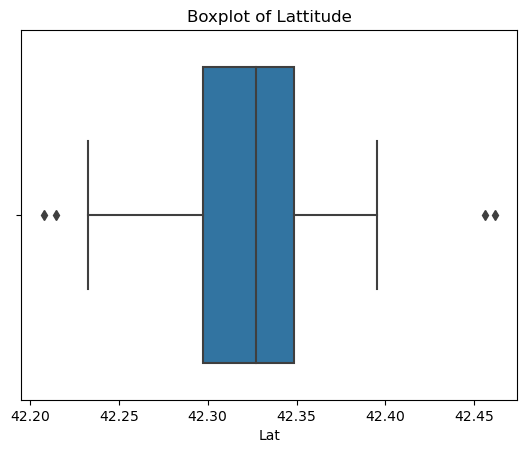

In [133]:
sns.boxplot(data=df, x='Lat')

plt.title('Boxplot of Lattitude')
plt.show()

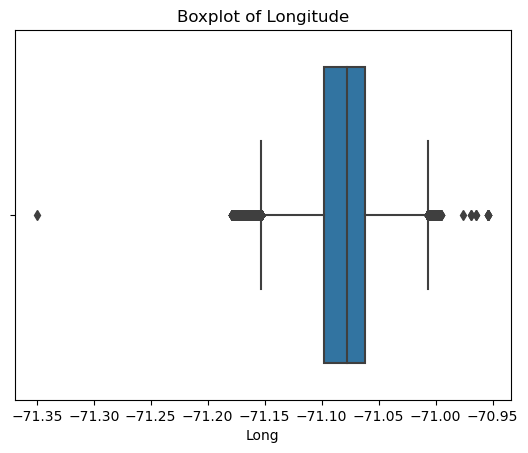

In [134]:
sns.boxplot(data=df, x='Long')

plt.title('Boxplot of Longitude')
plt.show()

After looking at the boxplot of Lat and Long columns, we can see that there are values that are far away from the rest. Since the mean can be greatly influenced by these unusual values, using the mean to fill in missing values might not be the best idea. Instead, we should use the middle value, or **median**, which isn't as affected by these extreme values. This will give us a more accurate estimate for the missing values in these columns.

In [135]:
# Replace missing values in Lat and Long with median
df_mean_mode['Lat'].fillna(df_mean_mode['Lat'].median(), inplace=True)
df_mean_mode['Long'].fillna(df_mean_mode['Long'].median(), inplace=True)

# Replace Location with the values from Lat and Long
df_mean_mode['Location'] = '(' + df_mean_mode['Lat'].astype(str) + ', ' + df_mean_mode['Long'].astype(str) + ')'

In [136]:
df_mean_mode[df_mean_mode[['Lat', 'Long', 'Location']].notna().all(axis=1)]

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182050863,2629,Harassment,HARASSMENT,A1,123,0,2017-01-01 00:00:00,2017,1,Sunday,0,Part Two,KNEELAND ST,42.350826,-71.062624,"(42.35082577, -71.06262352)"
22,I172033499,1108,Fraud,FRAUD - WELFARE,B3,452,0,2017-01-01 00:00:00,2017,1,Sunday,0,Part Two,KENBERMA RD,42.295740,-71.073226,"(42.29574022, -71.07322638)"
21,I172019406,1102,Fraud,FRAUD - FALSE PRETENSE / SCHEME,C11,403,0,2017-01-01 00:00:00,2017,1,Sunday,0,Part Two,WASHINGTON ST,42.280962,-71.070807,"(42.28096173, -71.07080703)"
20,I172044522,1106,Confidence Games,FRAUD - CREDIT CARD / ATM FRAUD,C11,381,0,2017-01-01 00:00:00,2017,1,Sunday,0,Part Two,GALLIVAN BLVD,42.284543,-71.045310,"(42.284543, -71.04531029)"
19,I172000529,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,E18,517,0,2017-01-01 00:00:00,2017,1,Sunday,0,Part Three,TYLER ST,42.246252,-71.124800,"(42.24625203, -71.12479983)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
503872,232000091,1402,Motor Vehicle Accident Response,VANDALISM,A1,66,0,2022-12-31 23:30:00,2022,12,Saturday,23,Part Three,CHARLES ST,42.359790,-71.070782,"(42.35979037458775, -71.07078234449541)"
503873,232000002,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,C11,355,0,2022-12-31 23:37:00,2022,12,Saturday,23,Part Three,COLUMBIA RD,42.319593,-71.062607,"(42.31959298334654, -71.06260699634272)"
503874,232000140,619,Motor Vehicle Accident Response,LARCENY ALL OTHERS,D14,778,0,2022-12-31 23:45:00,2022,12,Saturday,23,Part Three,WASHINGTON ST,42.349056,-71.150498,"(42.34905600030506, -71.15049849975023)"
503875,232000315,3201,Motor Vehicle Accident Response,PROPERTY - LOST/ MISSING,D4,167,0,2022-12-31 23:50:00,2022,12,Saturday,23,Part Three,HARRISON AVENUE,42.326966,-71.077665,"(42.32696647, -71.07766482)"


Given that Latitude and Longitude values are typically specified with a maximum precision of 8 decimal places, we will adjust the Lat and Long columns in a way that they show precisely 8 decimal places.

In [137]:
# Keep the first 8 decimal places
df_mean_mode['Lat'] = df_mean_mode['Lat'].apply(lambda x: "{:.8f}".format(x))
df_mean_mode['Long'] = df_mean_mode['Long'].apply(lambda x: "{:.8f}".format(x))

# Update Location values with the values from Lat and Long
df_mean_mode['Location'] = '(' + df_mean_mode['Lat'].astype(str) + ', ' + df_mean_mode['Long'].astype(str) + ')'

In [138]:
# Check if the values has been updated
df_mean_mode[df_mean_mode[['Lat', 'Long']].notna().all(axis=1)]

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182050863,2629,Harassment,HARASSMENT,A1,123,0,2017-01-01 00:00:00,2017,1,Sunday,0,Part Two,KNEELAND ST,42.35082577,-71.06262352,"(42.35082577, -71.06262352)"
22,I172033499,1108,Fraud,FRAUD - WELFARE,B3,452,0,2017-01-01 00:00:00,2017,1,Sunday,0,Part Two,KENBERMA RD,42.29574022,-71.07322638,"(42.29574022, -71.07322638)"
21,I172019406,1102,Fraud,FRAUD - FALSE PRETENSE / SCHEME,C11,403,0,2017-01-01 00:00:00,2017,1,Sunday,0,Part Two,WASHINGTON ST,42.28096173,-71.07080703,"(42.28096173, -71.07080703)"
20,I172044522,1106,Confidence Games,FRAUD - CREDIT CARD / ATM FRAUD,C11,381,0,2017-01-01 00:00:00,2017,1,Sunday,0,Part Two,GALLIVAN BLVD,42.28454300,-71.04531029,"(42.28454300, -71.04531029)"
19,I172000529,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,E18,517,0,2017-01-01 00:00:00,2017,1,Sunday,0,Part Three,TYLER ST,42.24625203,-71.12479983,"(42.24625203, -71.12479983)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
503872,232000091,1402,Motor Vehicle Accident Response,VANDALISM,A1,66,0,2022-12-31 23:30:00,2022,12,Saturday,23,Part Three,CHARLES ST,42.35979037,-71.07078234,"(42.35979037, -71.07078234)"
503873,232000002,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,C11,355,0,2022-12-31 23:37:00,2022,12,Saturday,23,Part Three,COLUMBIA RD,42.31959298,-71.06260700,"(42.31959298, -71.06260700)"
503874,232000140,619,Motor Vehicle Accident Response,LARCENY ALL OTHERS,D14,778,0,2022-12-31 23:45:00,2022,12,Saturday,23,Part Three,WASHINGTON ST,42.34905600,-71.15049850,"(42.34905600, -71.15049850)"
503875,232000315,3201,Motor Vehicle Accident Response,PROPERTY - LOST/ MISSING,D4,167,0,2022-12-31 23:50:00,2022,12,Saturday,23,Part Three,HARRISON AVENUE,42.32696647,-71.07766482,"(42.32696647, -71.07766482)"


In [139]:
# Final check if the value has been imputed
df_mean_mode.isna().sum()

INCIDENT_NUMBER        0
OFFENSE_CODE           0
OFFENSE_CODE_GROUP     0
OFFENSE_DESCRIPTION    0
DISTRICT               0
REPORTING_AREA         0
SHOOTING               0
OCCURRED_ON_DATE       0
YEAR                   0
MONTH                  0
DAY_OF_WEEK            0
HOUR                   0
UCR_PART               0
STREET                 0
Lat                    0
Long                   0
Location               0
dtype: int64

## Section 2.6.3: Using ffill/bfill

Except SHOOTING column, we will fill the column using forward filling

In [140]:
df_ffill_bfill = df.copy()

In [141]:
ffill_columns = ['OFFENSE_CODE_GROUP', 'DISTRICT', 'REPORTING_AREA', 'UCR_PART', 'STREET', 'Lat', 'Long', 'Location']
bfill_columns = ['SHOOTING']

# Forward-fill selected columns
df_ffill_bfill[ffill_columns] = df_ffill_bfill[ffill_columns].ffill()

# Backward-fill selected columns
df_ffill_bfill[bfill_columns] = df_ffill_bfill[bfill_columns].bfill()

In [142]:
df_ffill_bfill.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182050863,2629,Harassment,HARASSMENT,A1,123,Y,2017-01-01,2017,1,Sunday,0,Part Two,KNEELAND ST,42.350826,-71.062624,"(42.35082577, -71.06262352)"
22,I172033499,1108,Fraud,FRAUD - WELFARE,B3,452,Y,2017-01-01,2017,1,Sunday,0,Part Two,KENBERMA RD,42.295740,-71.073226,"(42.29574022, -71.07322638)"
21,I172019406,1102,Fraud,FRAUD - FALSE PRETENSE / SCHEME,C11,403,Y,2017-01-01,2017,1,Sunday,0,Part Two,WASHINGTON ST,42.280962,-71.070807,"(42.28096173, -71.07080703)"
20,I172044522,1106,Confidence Games,FRAUD - CREDIT CARD / ATM FRAUD,C11,381,Y,2017-01-01,2017,1,Sunday,0,Part Two,GALLIVAN BLVD,42.284543,-71.045310,"(42.28454300, -71.04531029)"
19,I172000529,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,E18,517,Y,2017-01-01,2017,1,Sunday,0,Part Three,TYLER ST,42.246252,-71.124800,"(42.24625203, -71.12479983)"


In [143]:
# final check
df_ffill_bfill.isna().sum()

INCIDENT_NUMBER        0
OFFENSE_CODE           0
OFFENSE_CODE_GROUP     0
OFFENSE_DESCRIPTION    0
DISTRICT               0
REPORTING_AREA         0
SHOOTING               0
OCCURRED_ON_DATE       0
YEAR                   0
MONTH                  0
DAY_OF_WEEK            0
HOUR                   0
UCR_PART               0
STREET                 0
Lat                    0
Long                   0
Location               0
dtype: int64

## Section 2.7 
### Visualize number of remaining column for the 3 dataframe.

In [144]:
length_hot_cold = len(df_cold_hot)
length_mean_mode = len(df_mean_mode)
length_ffill_bfill = len(df_ffill_bfill)

print(f'1. df_cold_hot number of records: {length_hot_cold}')
print(f'2. df_mean_mode number of records: {length_mean_mode}')
print(f'3. df_ffill_bfill number of records: {length_ffill_bfill}')

1. df_cold_hot number of records: 471400
2. df_mean_mode number of records: 503575
3. df_ffill_bfill number of records: 503575


In [145]:
dataframe_length = pd.DataFrame({'DataFrame_name':['df_cold_hot', 'df_mean_mode', 'df_ffill_bfill'], 'length':[length_hot_cold, length_mean_mode, length_ffill_bfill]})
dataframe_length = dataframe_length.sort_values('length')

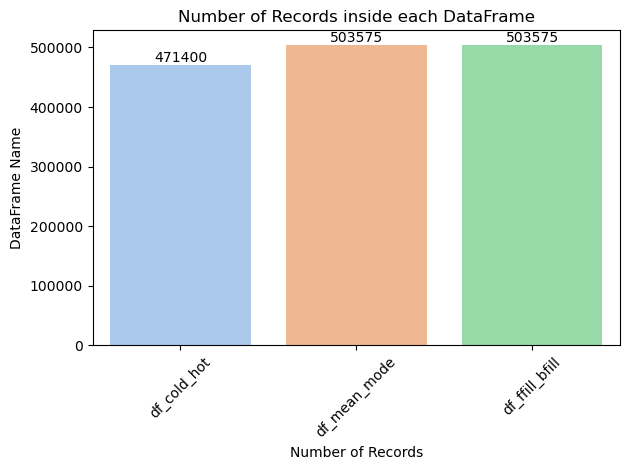

In [146]:
# Create the bar plot
colors = sns.color_palette("pastel")
ax = sns.barplot(data=dataframe_length, x='DataFrame_name', y='length', palette=colors)

# Annotate each bar with its value
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'),
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=10, color='black',
                xytext=(0, 5), textcoords='offset points')

plt.title('Number of Records inside each DataFrame')
plt.xticks(rotation=45)  # Rotating x-axis labels for better readability
plt.tight_layout()       # Adjust layout to prevent clipping of labels
plt.xlabel('Number of Records')
plt.ylabel('DataFrame Name')
plt.show()

## 2.8 Features Engineering 

### Create 'Day_Of_Week_Number' column

In [147]:
# Create 'Day_Of_Week_Number' column
df_cold_hot['Day_Of_Week_Number'] = df_cold_hot['OCCURRED_ON_DATE'].dt.dayofweek + 1

df_mean_mode['Day_Of_Week_Number'] = df_mean_mode['OCCURRED_ON_DATE'].dt.dayofweek + 1

df_ffill_bfill['Day_Of_Week_Number'] = df_ffill_bfill['OCCURRED_ON_DATE'].dt.dayofweek + 1

# Export the cleaned dataset
df_cold_hot.to_csv('Boston_Crime_Cleaned.csv', index=False)

# 3: Exploratory Data Analysis

## 3.1: Mapping the Unseen: Understanding Crime Patterns and Trends in Boston

### 3.1.1:  Yearly Crime Frequency

In [148]:
def plot_graph_section_1_subsection_1(df, df2, df3):
    # df_cold_hot------------------------------------------------------------------------------------
    year_crime = df.groupby(['YEAR'])['OFFENSE_CODE'].count().reset_index()
    year_crime = year_crime.rename(columns={'OFFENSE_CODE': 'Crime_Frequency'})
    year_crime['YEAR'] = year_crime['YEAR'].astype('str')

    colors = sns.color_palette("pastel")
    ax = sns.barplot(data=year_crime, x='YEAR', y='Crime_Frequency', palette=colors)

    for p in ax.patches:
        ax.annotate(format(p.get_height(), '.2f'), 
                    (p.get_x() + p.get_width() / 2., p.get_height()), 
                    ha='center', va='bottom', fontsize=10)
    plt.title('Yearly Crime Trend in Boston (df_cold_hot)')
    plt.show()
    
    # df_mean_mode------------------------------------------------------------------------------------
    year_crime = df2.groupby(['YEAR'])['OFFENSE_CODE'].count().reset_index()
    year_crime = year_crime.rename(columns={'OFFENSE_CODE': 'Crime_Frequency'})
    year_crime['YEAR'] = year_crime['YEAR'].astype('str')

    colors = sns.color_palette("pastel")
    ax = sns.barplot(data=year_crime, x='YEAR', y='Crime_Frequency', palette=colors)

    for p in ax.patches:
        ax.annotate(format(p.get_height(), '.2f'), 
                    (p.get_x() + p.get_width() / 2., p.get_height()), 
                    ha='center', va='bottom', fontsize=10)
    plt.title('Yearly Crime Trend in Boston (df_mean_mode)')
    plt.show()
    
    
    # df_ffill_bfill------------------------------------------------------------------------------------
    
    year_crime = df3.groupby(['YEAR'])['OFFENSE_CODE'].count().reset_index()
    year_crime = year_crime.rename(columns={'OFFENSE_CODE': 'Crime_Frequency'})
    year_crime['YEAR'] = year_crime['YEAR'].astype('str')

    colors = sns.color_palette("pastel")
    ax = sns.barplot(data=year_crime, x='YEAR', y='Crime_Frequency', palette=colors)

    for p in ax.patches:
        ax.annotate(format(p.get_height(), '.2f'), 
                    (p.get_x() + p.get_width() / 2., p.get_height()), 
                    ha='center', va='bottom', fontsize=10)
    plt.title('Yearly Crime Trend in Boston (df_ffill_bfill)')
    plt.show()
    
    

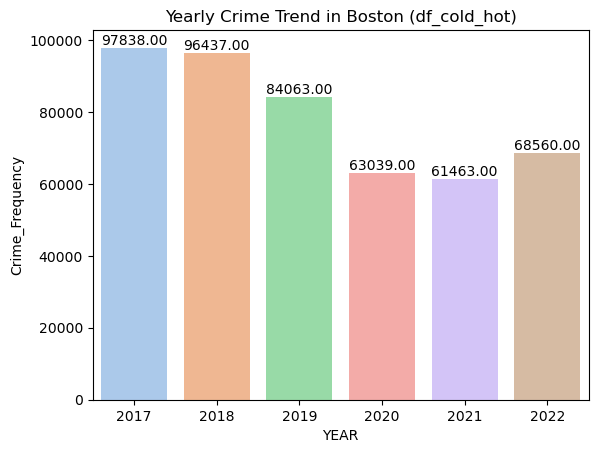

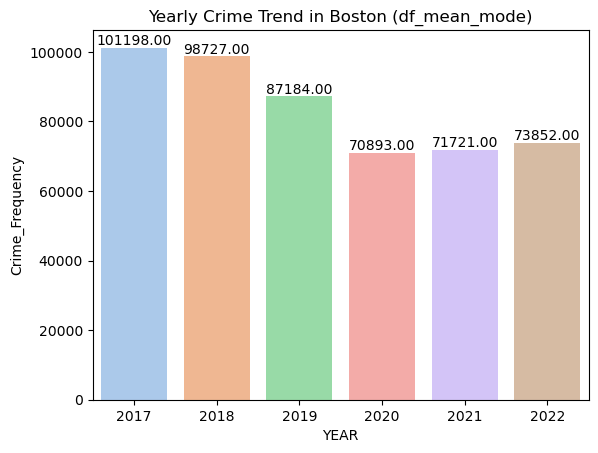

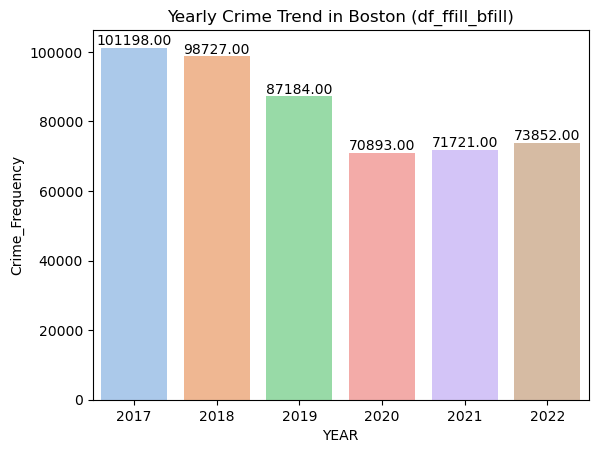

In [149]:
plot_graph_section_1_subsection_1(df_cold_hot, df_mean_mode, df_ffill_bfill)

#### Insights 

#### For df_cold_hot:
- Total Crimes has decrease after year 2019

- Possible Justification: According to Boyle, the Boston Police also expected that violent crimes such as assault, battery, murder and rape would decrease, as well as organized crime, including gang violence and illegal drug distribution, due to the stay-at-home advisory that Massachusetts was under for the first few months of the pandemic.

- References: https://thesuffolkjournal.com/36697/news/the-covid-19-pandemic-and-its-effect-on-bostons-crime-rate/

- Advantages: Visualizing the fluctuations in overall crime frequency enables law enforcement agencies to assess the effectiveness of their crime-fighting measures.


#### For df_mean_mode:
- Same with df_cold_hot

#### For df_ffill_bfill:
- Same result as df_cold_hot

### 3.1.2: Monthy, Daily and Hourly Crimes Trend

In [150]:
df_cold_hot.columns

Index(['INCIDENT_NUMBER', 'OFFENSE_CODE', 'OFFENSE_CODE_GROUP',
       'OFFENSE_DESCRIPTION', 'DISTRICT', 'REPORTING_AREA', 'SHOOTING',
       'OCCURRED_ON_DATE', 'YEAR', 'MONTH', 'DAY_OF_WEEK', 'HOUR', 'UCR_PART',
       'STREET', 'Lat', 'Long', 'Location', 'Day_Of_Week_Number'],
      dtype='object')

In [151]:
def plot_graph_section_1_subsection_2(df, df2, df3):
    # Monthly Crime ------------------------------------------------------------------------------------------------------
    df_list = [df, df2, df3]
    
    count = 1
    for df in df_list:
        title = 'Monthly Crime Trend in Boston from Year 2017 to 2022 (df_cold_hot)'
        if count == 2:
            title = 'Monthly Crime Trend in Boston from Year 2017 to 2022 (df_mean_mode)'
        elif count == 3:
            title = 'Monthly Crime Trend in Boston from Year 2017 to 2022 (df_ffill_bfill)'
        
        month_crime = df.groupby(['MONTH'])['OFFENSE_CODE'].count().reset_index()
        month_crime = month_crime.rename(columns={'OFFENSE_CODE': 'Crime_Frequency'})
        month_crime['MONTH'] = month_crime['MONTH'].astype('str')

        plt.figure(figsize=(10,6))
        colors = sns.color_palette(["purple"])  # Use light blue color

        ax = sns.pointplot(data=month_crime, x='MONTH', y='Crime_Frequency', color=colors[0])

        for i, row in month_crime.iterrows():
            ax.text(i, row.Crime_Frequency, str(row.Crime_Frequency), color='black', ha="center")

        plt.title(title)
        plt.grid(True)
        plt.show()
        count += 1
    # Daily Crime-----------------------------------------------------------------------------------------------------------
    count = 1
    for df in df_list:
        title = 'Daily Crime Trend in Boston from Year 2017 to 2022 (df_cold_hot)'
        if count == 2:
            title = 'Daily Crime Trend in Boston from Year 2017 to 2022 (df_mean_mode)'
        elif count == 3:
            title = 'Daily Crime Trend in Boston from Year 2017 to 2022 (df_ffill_bfill)'

        daily_crime = df.groupby(['DAY_OF_WEEK'])['OFFENSE_CODE'].count().reset_index()
        daily_crime = daily_crime.rename(columns={'OFFENSE_CODE': 'Crime_Frequency'})
        daily_crime['DAY_OF_WEEK'] = daily_crime['DAY_OF_WEEK'].astype('str')
        days_of_week = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

        colors = sns.color_palette(["purple"])
        plt.figure(figsize=(12,6))

        ax = sns.pointplot(data=daily_crime, x='DAY_OF_WEEK', y='Crime_Frequency', color=colors[0], order=days_of_week)


        plt.title(title)
        plt.grid(True)
        plt.show()
        count += 1
    
    
    # Hourly Crime ------------------------------------------------------------------------------------------------
    count = 1
    for df in df_list:
        title = 'Hourly Crime Trend in Boston from Year 2017 to 2022 (df_cold_hot)'
        if count == 2:
            title = 'Hourly Crime Trend in Boston from Year 2017 to 2022 (df_mean_mode)'
        elif count == 3:
            title = 'Hourly Crime Trend in Boston from Year 2017 to 2022 (df_ffill_bfill)'


        hour_crime = df.groupby(['HOUR'])['OFFENSE_CODE'].count().reset_index()
        hour_crime = hour_crime.rename(columns={'OFFENSE_CODE': 'Crime_Frequency'})
        order_list = [5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,0,1,2,3,4]
        plt.figure(figsize=(10,6))
        colors = sns.color_palette("pastel")
        ax = sns.pointplot(data=hour_crime, x='HOUR', y='Crime_Frequency', color='Purple', order=order_list)    

        plt.title(title)
        plt.grid(True) 
        plt.show()
        count += 1
    

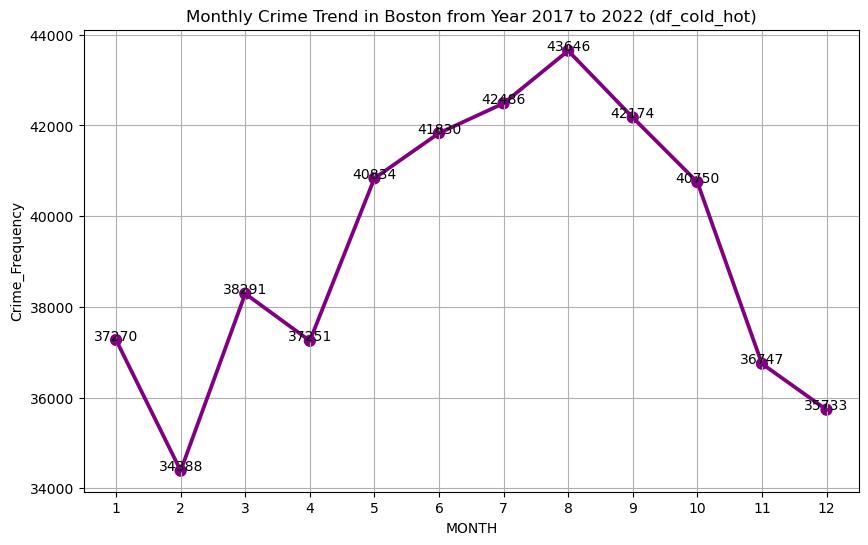

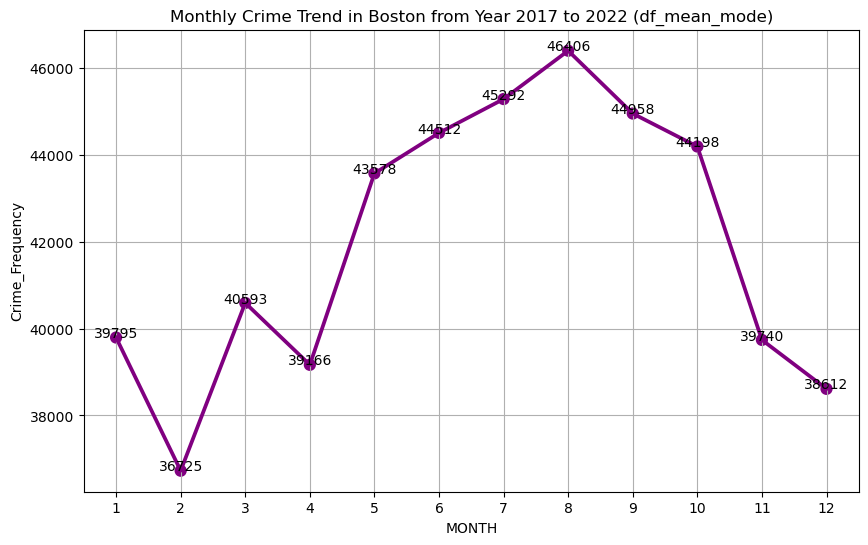

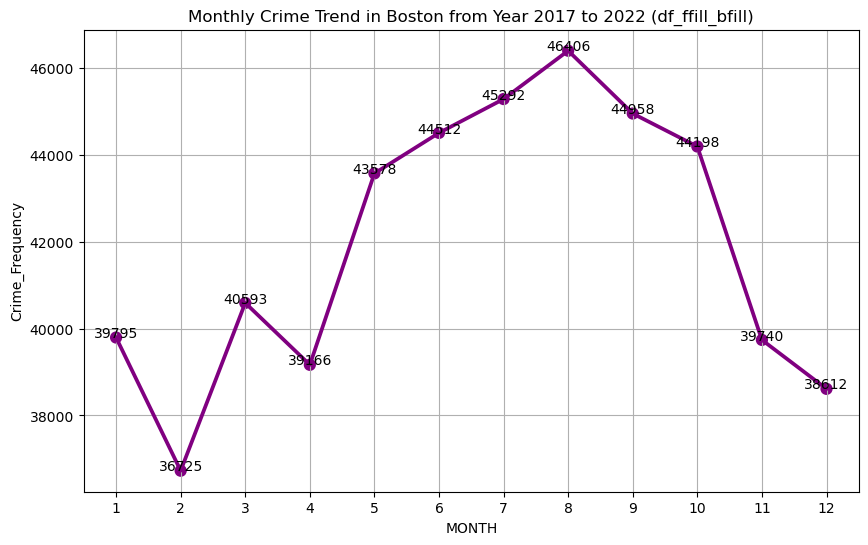

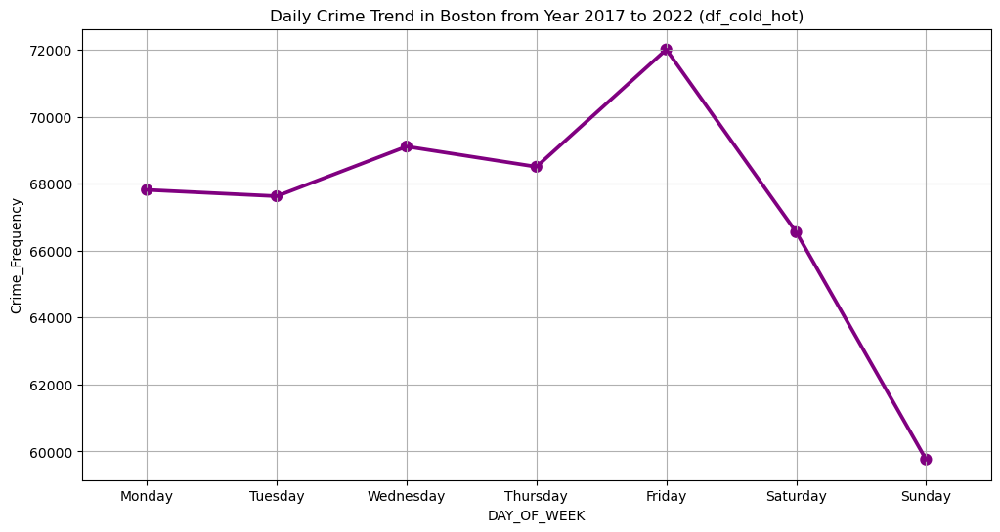

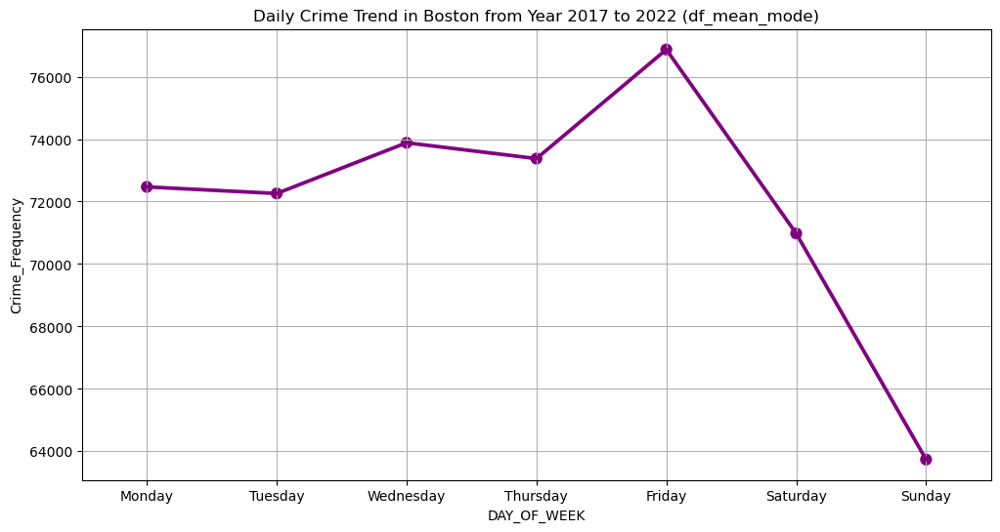

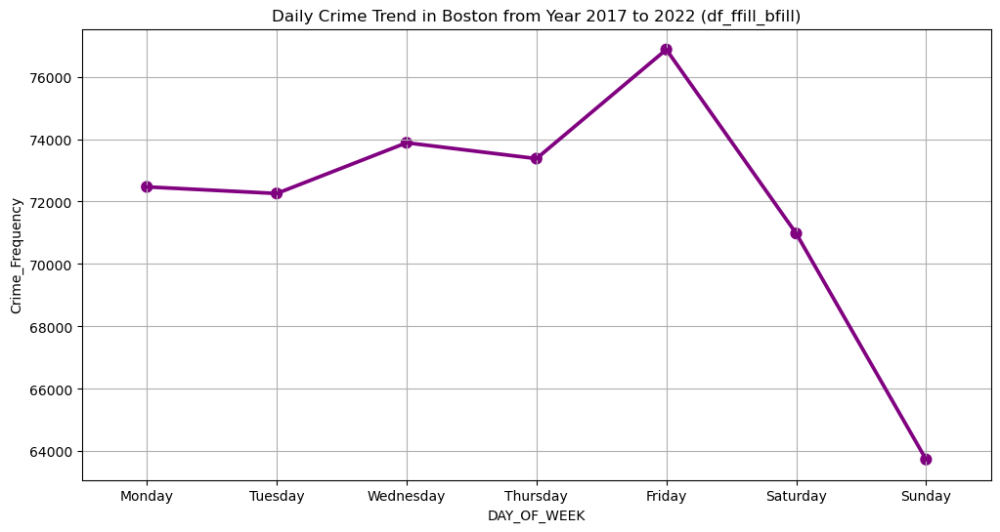

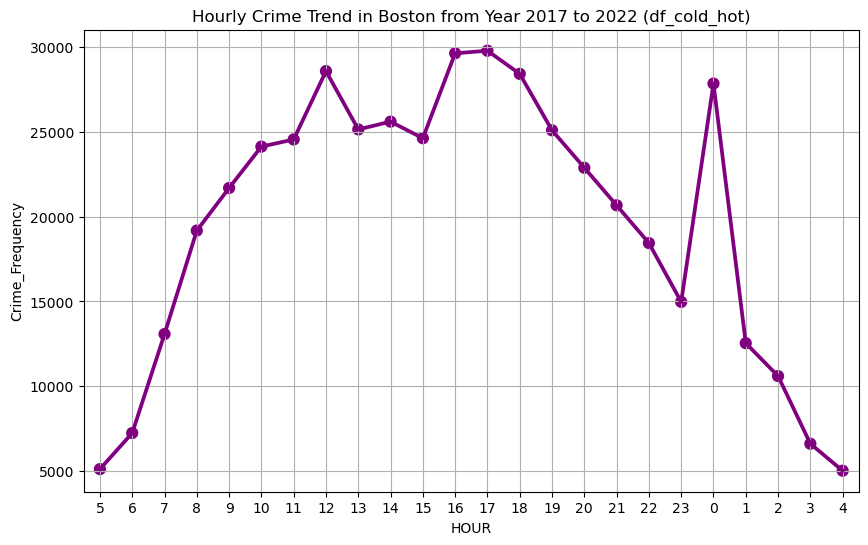

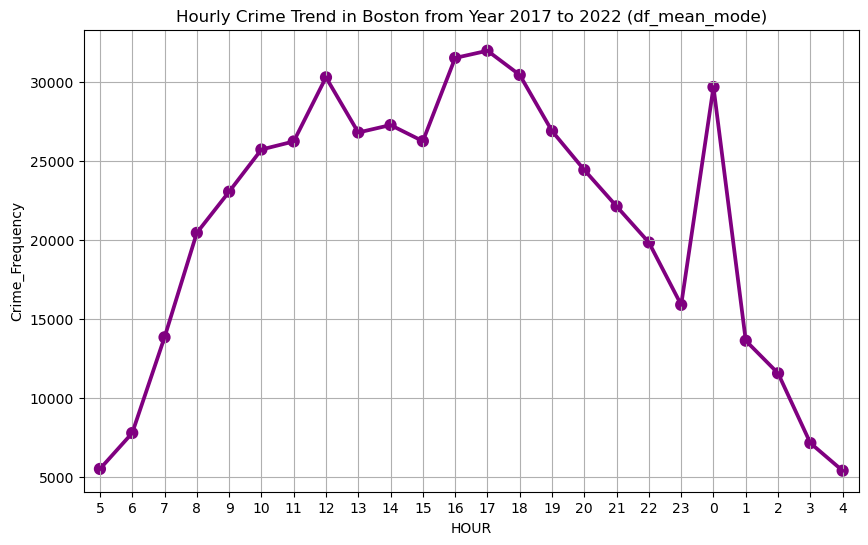

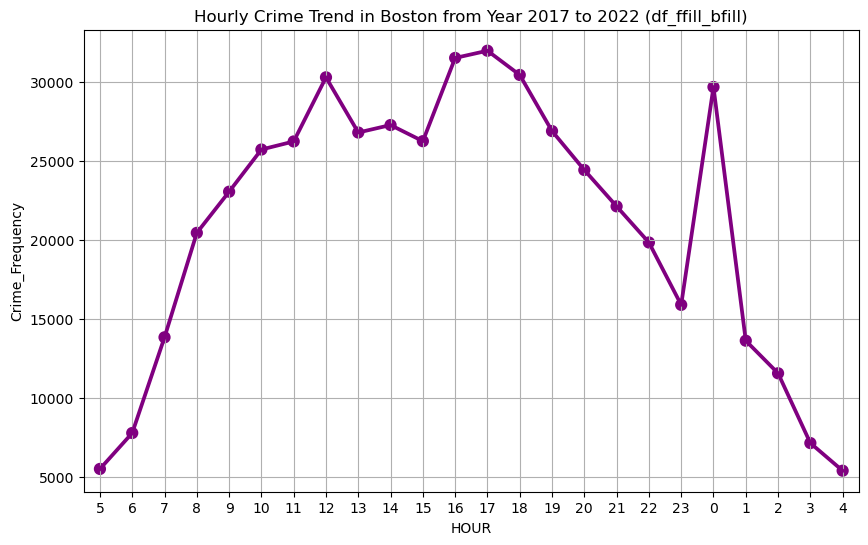

In [152]:
plot_graph_section_1_subsection_2(df_cold_hot, df_mean_mode, df_ffill_bfill)

#### Insights:

#### For df_cold_hot:

From Montly Perspective:
- Total Crimes has increase after April, indicating increase in criminal activity after April.
- Total Crimes has decrease after August, indicating decrease in criminal activity after August.

From Daily Perspective:
- Total Crimes has increase after Thursday, indicating increase in criminal activity after Thursday.
- Total Crimes has decrease after Friday, indicating decrease in criminal activity Friday. 

From Hourly Perspective:
- Total Crimes has increase after 5:00 am, indicating increase in criminal activity after 5:00 am.
- Total Crimes has decrease after 00:00 am, indicating decrease in criminal activity 00:00 am. 


#### Advantages: 
-By analyzing the visualized trends in monthly, daily, hourly fluctuations of overall crime frequency, law enforcement agencies can identify which month, day or hour has the highest criminal activities.

-They can make informed decisions about efficiently allocating their resources to address criminal behaviour.

#### For df_mean_mode:
From Montly Perspective:

- Same

From Daily Perspective:
- Same

From Hourly Perspective:
- Same


#### For df_ffill_bfill:
From Montly Perspective:

- Same

From Daily Perspective:
- Same

From Hourly Perspective:
- Same

###  3.1.3: Yearly Shooting Frequency

In [153]:
def plot_graph_section_1_subsection_3(df, title="Shooting Frequency"):
    
    # df_cold_hot------------------------------------------------------
    
    year_shooting_count = df[df['SHOOTING'] == 'Yes'].groupby(['YEAR'])['OFFENSE_CODE'].count().reset_index()
    year_shooting_count = year_shooting_count.rename(columns={'OFFENSE_CODE': 'Shooting_Frequency'})
    
    colors = sns.color_palette("pastel")
    ax = sns.barplot(data=year_shooting_count, x='YEAR', y='Shooting_Frequency', palette=colors)
    
    # Annotate each bar with its value
    for p in ax.patches:
        ax.annotate(format(p.get_height(), '.0f'),
                    (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='center', fontsize=10, color='black',
                    xytext=(0, 5), textcoords='offset points')

    plt.title(title)
    plt.ylabel('Shooting Frequency')
    plt.xlabel('Year')
    plt.show()
    
    # df_mean_mode------------------------------------------------------
    

In [154]:
df_mean_mode['SHOOTING'] = df_mean_mode['SHOOTING'].map({'0':'No', 'Y':'Yes', '1':'Yes'})
df_ffill_bfill['SHOOTING'] = df_ffill_bfill['SHOOTING'].map({'0':'No', 'Y':'Yes', '1':'Yes'})

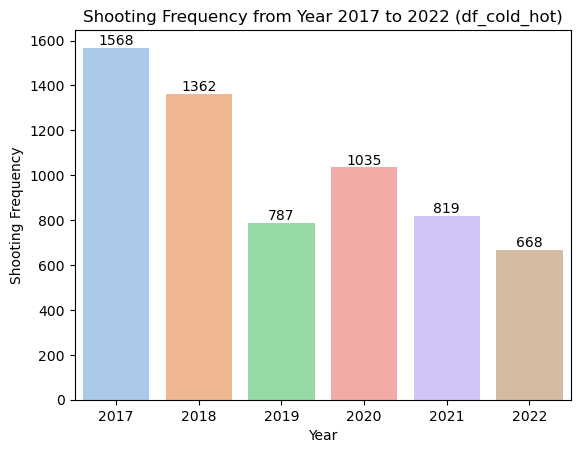

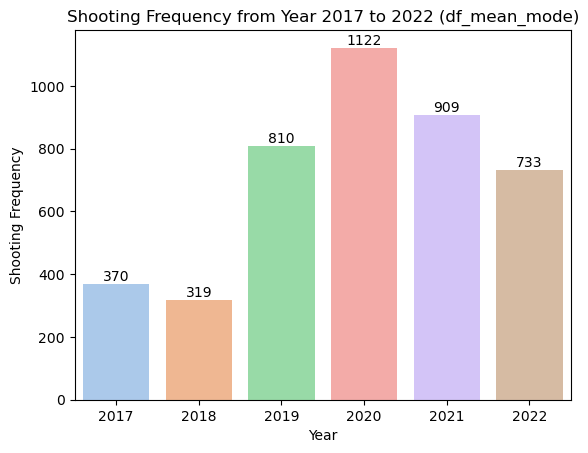

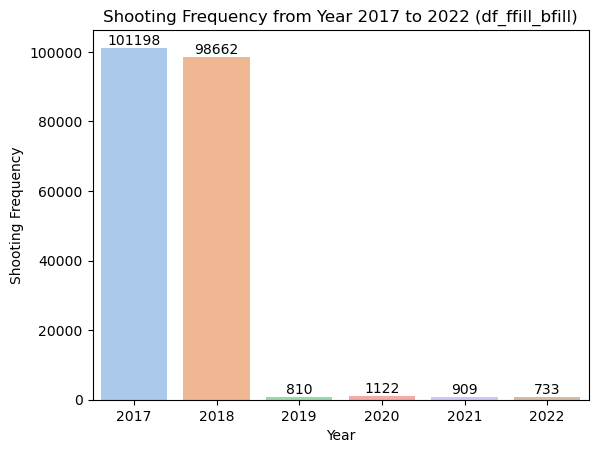

In [155]:
plot_graph_section_1_subsection_3(df=df_cold_hot, title='Shooting Frequency from Year 2017 to 2022 (df_cold_hot)')
plot_graph_section_1_subsection_3(df=df_mean_mode, title='Shooting Frequency from Year 2017 to 2022 (df_mean_mode)')
plot_graph_section_1_subsection_3(df=df_ffill_bfill, title='Shooting Frequency from Year 2017 to 2022 (df_ffill_bfill)')

#### Insights for df_cold_hot:
- Total shooting frequency has decrease after year 2017 and suddenly increase after year 2020

- Possible Justification: This is because of the economic stress during the pandemic.

- References:https://www.bostonherald.com/2020/08/18/pandemic-gun-violence-shootings-in-boston-jump-29-in-2020/

- Advantages: Observing patterns and fluctuations aids in assessing previous shooting policy effectiveness, identifying successful approaches, and uncovering areas that require improvement. 

#### Insights for df_mean_mode:
- Findings are not the same as df_cold_hot.


- This is because the mode imputation just randomly use the mode value of a column to impute without any analysis or considerations.


- This might create a false distribution of a column. 

#### Insights for df_ffill_bfill:
- Findings are not the same as df_cold_hot.


- This is because the forward fill or backward fill imputation just randomly use the front and back value of a column to impute without any analysis or considerations.


- This might create a false distribution of a column.

### 3.1.4: Monthly, Daily, Hourly Shooting Trend

In [156]:
def plot_graph_section_1_subsection_4(df1, df2, df3):
    df_list = [df1, df2, df3]
    
    # Monthly shooting trend ---------------------------------------------------------
    count = 1
    title = "Monthly Shooting Trend (df_cold_hot)"
    for df in df_list:
        if count == 2:
            title = "Monthly Shooting Trend (df_mean_mode)"
        elif count == 3:
            title = "Monthly Shooting Trend (df_ffill_bfill)"
        
        month_shooting_count = df[df['SHOOTING'] == 'Yes'].groupby(['MONTH'])['OFFENSE_CODE'].count().reset_index()
        month_shooting_count =  month_shooting_count.rename(columns={'OFFENSE_CODE': 'Shooting_Frequency'})
        plt.figure(figsize=(10, 6))
        colors = sns.color_palette(["purple"])
        sns.pointplot(data=month_shooting_count, x='MONTH', y='Shooting_Frequency', color=colors[0])
        plt.title(title)
        plt.ylabel('Shooting Frequency')
        plt.show()
        count += 1
    
    # Daily shooting trend ---------------------------------------------------------
    count = 1
    title = "Daily Shooting Trend (df_cold_hot)"
    for df in df_list:
        if count == 2:
            title = "Daily Shooting Trend (df_mean_mode)"
        elif count == 3:
            title = "Daily Shooting Trend (df_ffill_bfill)"

        day_shooting_count = df[df['SHOOTING'] == 'Yes'].groupby(['DAY_OF_WEEK'])['OFFENSE_CODE'].count().reset_index()
        day_shooting_count = day_shooting_count.rename(columns={'OFFENSE_CODE': 'Shooting_Frequency'})
        days_of_week = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
        colors = sns.color_palette(["purple"])
        plt.figure(figsize=(10, 6))
        ax2 = sns.pointplot(data=day_shooting_count, x='DAY_OF_WEEK', y='Shooting_Frequency', order=days_of_week, color=colors[0])
        plt.title(title)
        plt.ylabel('Shooting Frequency')   
        plt.show()
        count += 1
    
    #Hourly Shooting Trend ----------------------------------------------------------------
    count = 1
    title = "'Hourly Shooting Trend' (df_cold_hot)"
    for df in df_list:
        if count == 2:
            title = "'Hourly Shooting Trend' (df_mean_mode)"
        elif count == 3:
            title = "'Hourly Shooting Trend' (df_ffill_bfill)"
            
        shooting_count = df[(df['SHOOTING'] == 'Yes')].groupby(['HOUR'])['OFFENSE_CODE'].count().reset_index()
        shooting_count = shooting_count.rename(columns={'OFFENSE_CODE': 'Shooting_Frequency'})
        order_list = [5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,0,1,2,3,4]
        colors = sns.color_palette(["purple"])
        plt.figure(figsize=(10, 6))
        ax1 = sns.pointplot(data=shooting_count, x='HOUR', y='Shooting_Frequency', order=order_list, color=colors[0])
        plt.title(title)
        plt.ylabel('Total Shooting Frequency')
        plt.show()
        count += 1

    
    

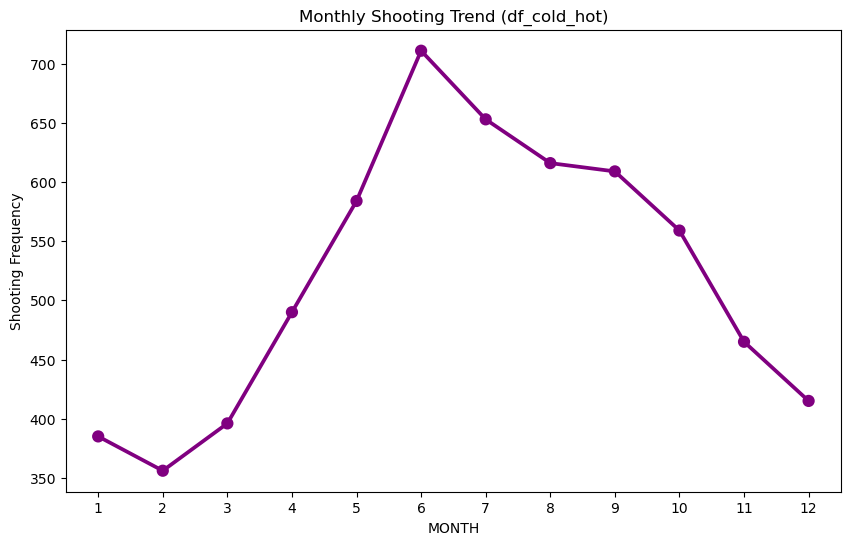

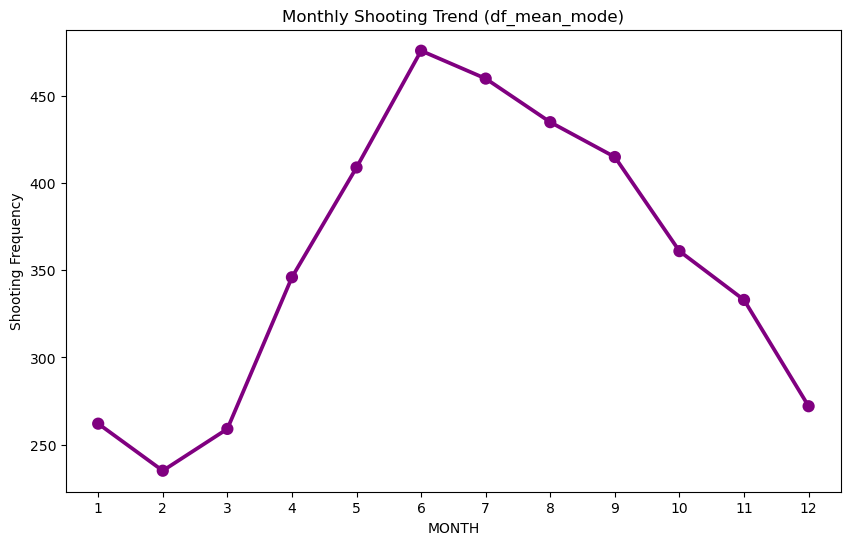

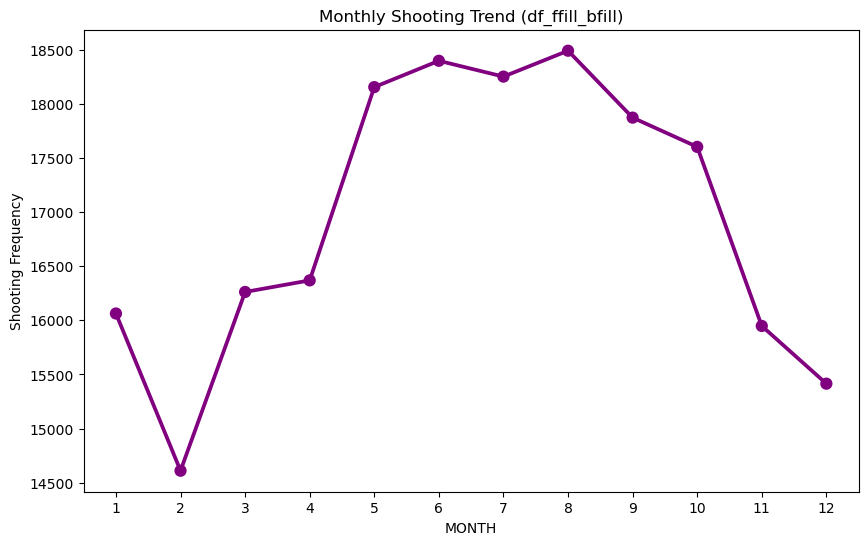

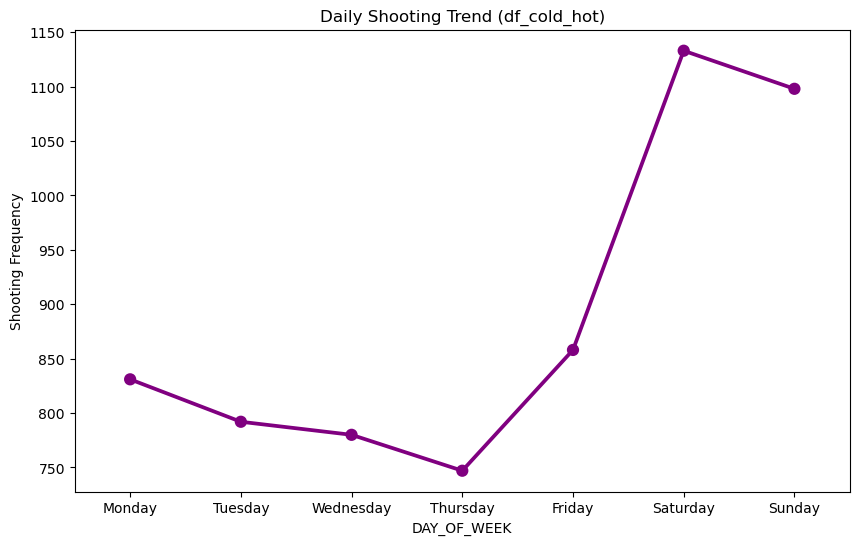

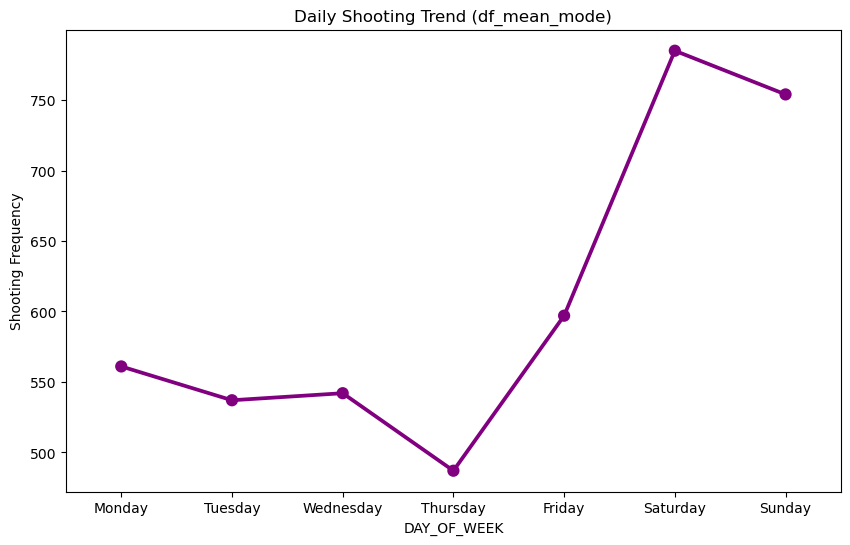

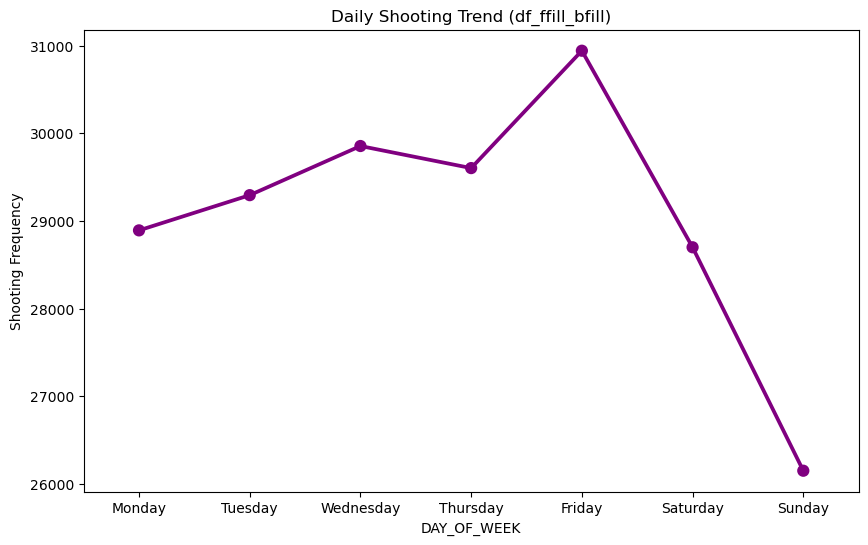

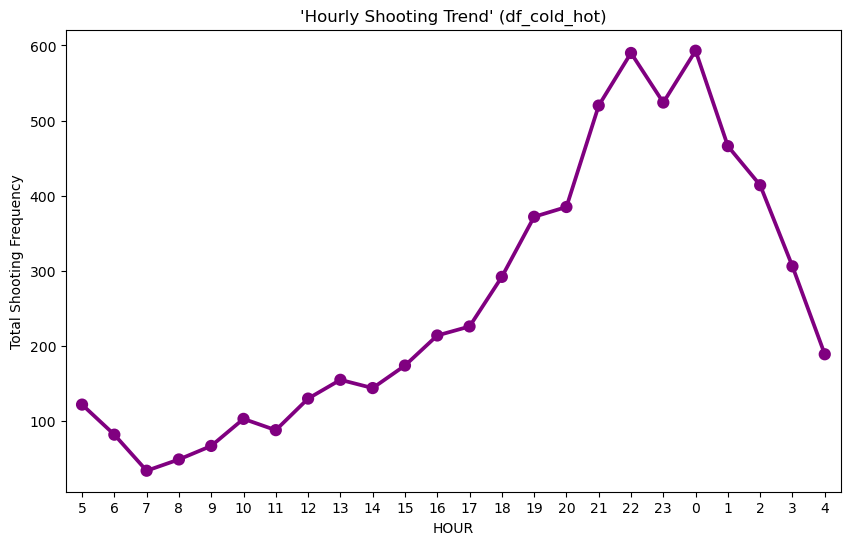

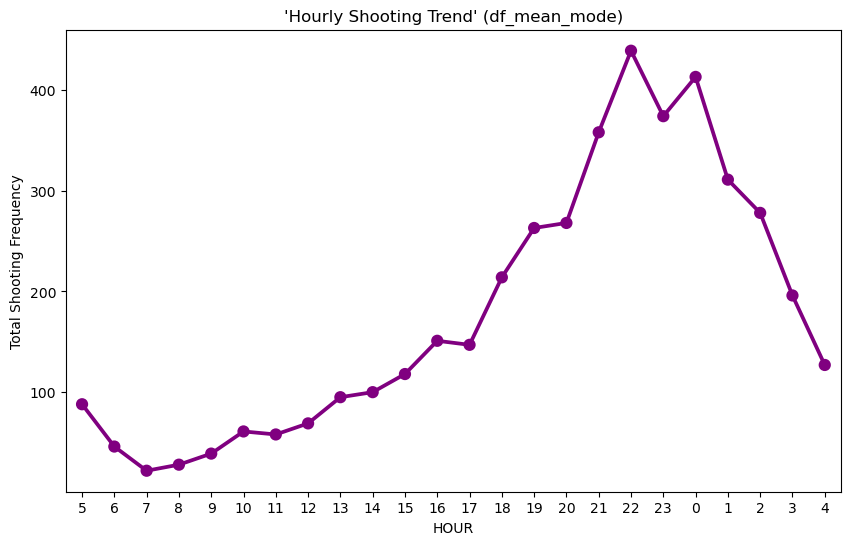

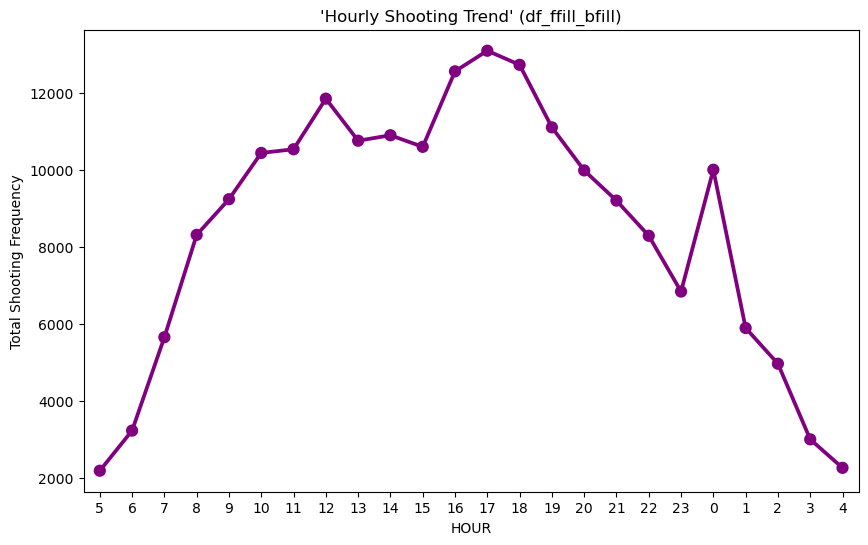

In [157]:
plot_graph_section_1_subsection_4(df_cold_hot, df_mean_mode, df_ffill_bfill)

#### Insights for df_cold_hot:
From Monthly Perspective:
- Total Shooting Frequency has increase after February, indicating increase in shooting activity after February.
- Total Shooting Frequency has decrease after June, indicating decrease in shooting activity after June.

From Daily Perspective:
- Total Shooting start to decrease slowly from Monday to Thursday, indicating a slowly decrease in shooting activities after     Monday.
- Total Shooting Frequency start to increase drastically from Thursday to Saturday, indicating a significant increase in shooting activities after Thursday.

From Hourly Perspective:
- Total Shooting Frequency start to increase at a constant rate from 07:00 Hours(morning) to 00:00 Hours(midnight), indicating a constant increase in shooting activity after 7:00 Hours
- Total Shooting Frequency start to decrease drastically from 00:00 Hours(midnight) to 04:00 Hours(midnight)

#### Advantages: 
- By examining the visual patterns in monthly, daily, and hourly shifts of overall crime frequency, law enforcement agencies can pinpoint months with heightened shooting events.

- This analytical approach empowers them to make well-informed choices regarding the optimal distribution of resources to effectively tackle and handle these periods of elevated shooting behavior.


#### Insights for df_mean_mode:
From Monthly Perspective:
- Insights is same with df_cold_hot

From Daily Perspective:
- Insights is same with df_cold_hot

From Hourly Perspective:
- Insights is same with df_cold_hot

#### Insights for df_ffill_bfill:
From Monthly Perspective:
- Not same with df_cold_hot

From Daily Perspective:
- Insights is same with df_cold_hot
- Friday is the has the most shooting frequency

From Hourly Perspective:
- Not same with df_cold_hot
- Shooting frequency start to increase from 5 a.m.


### 3.1.5:  Crime Frequency Across 13 District

In [158]:
def graph_section_1_subsection_5(df, title='Crime Frequency Across 13 District'):
    
    district_shooting = df.groupby(['DISTRICT'])['SHOOTING'].count()
    district_shooting = pd.DataFrame(district_shooting).reset_index()
    district_shooting = district_shooting.rename(columns={"SHOOTING":"Shooting_Frequency"})
    district_shooting = district_shooting.sort_values('Shooting_Frequency', ascending=False)
    district_shooting = district_shooting
    
    colors = sns.color_palette("pastel")
    plt.figure(figsize=(8, 5))
    ax = sns.barplot(data=district_shooting, y="DISTRICT", x="Shooting_Frequency", palette=colors)

    # Display numbers on top of the bars
    for p in ax.patches:
        ax.annotate(f'{p.get_width():.0f}', (p.get_width() + 0.5, p.get_y() + p.get_height() / 2),
                    ha='left', va='center', fontsize=11, color='black')

    # Add title and labels
    plt.title(title, fontsize=20)
    plt.ylabel('District', fontsize=10)
    plt.xlabel('Crime Frequency', fontsize=10)

    # Show the plot
    plt.tight_layout()
    plt.show()


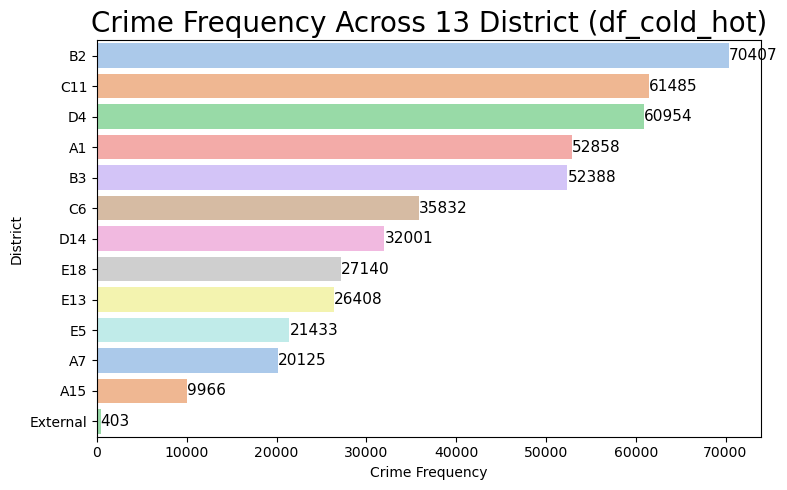

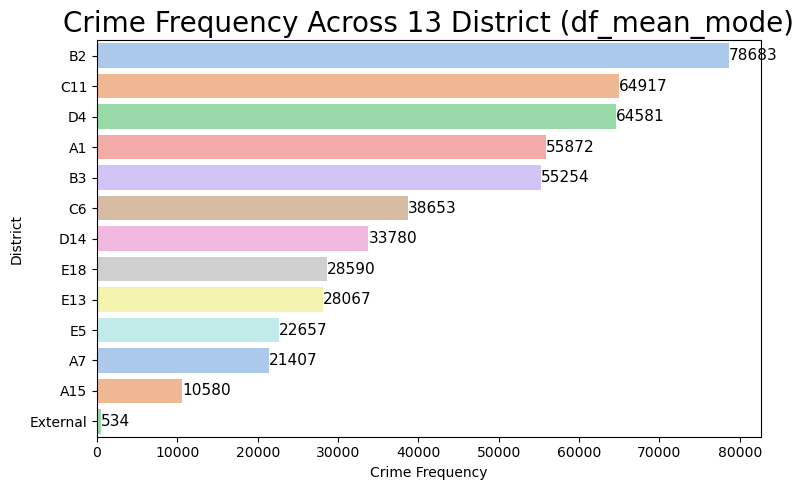

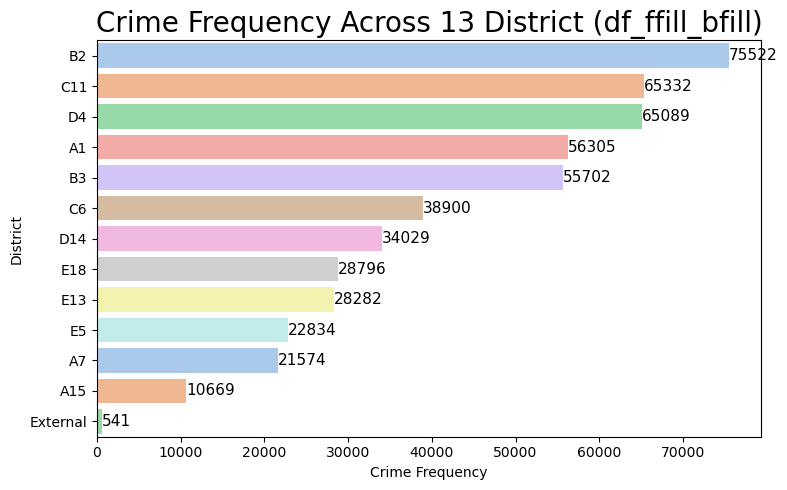

In [159]:
graph_section_1_subsection_5(df_cold_hot , title='Crime Frequency Across 13 District (df_cold_hot)')  
graph_section_1_subsection_5(df_mean_mode, title='Crime Frequency Across 13 District (df_mean_mode)')  
graph_section_1_subsection_5(df_ffill_bfill, title='Crime Frequency Across 13 District (df_ffill_bfill)')  

#### Insights for df_cold_hot:
- Criminal Activities are centered around District B2, C11, B4.

#### Advantages: 
- Recognizing criminal activities in each District enables law enforcement agencies to strategically allocate their resources to specific areas that require more countermeasures.


#### Insights for df_cold_hot:
- Insights are same with df_cold_hot

#### Insights for df_cold_hot:
- Insights are same with df_cold_hot

### 3.1.6: Top 10 Crime in Boston

In [160]:
def graph_section_1_subsection_6(df, title='Top 10 Crimes in Boston'):
    top_crime = df.groupby('OFFENSE_CODE_GROUP')['OFFENSE_CODE'].count().reset_index()
    top_crime = top_crime.rename(columns={'OFFENSE_CODE': 'Crime_Frequency'})
    top_crime = top_crime.sort_values('Crime_Frequency', ascending=False)
    top_crime = top_crime.head(10)
   
    colors = sns.color_palette("pastel")
    plt.figure(figsize=(10, 5))
    ax = sns.barplot(data=top_crime, y="OFFENSE_CODE_GROUP", x="Crime_Frequency", palette=colors)

    # Display numbers on top of the bars
    for p in ax.patches:
        ax.annotate(f'{p.get_width():.0f}', (p.get_width() + 0.5, p.get_y() + p.get_height() / 2),
                    ha='left', va='center', fontsize=11, color='black')

    # Add title and labels
    plt.title(title, fontsize=16)
    plt.ylabel('Offense Code Group', fontsize=15)
    plt.xlabel('Offense Frequency', fontsize=15)
    plt.yticks(fontsize=9)

    # Show the plot
    plt.tight_layout()
    plt.show()

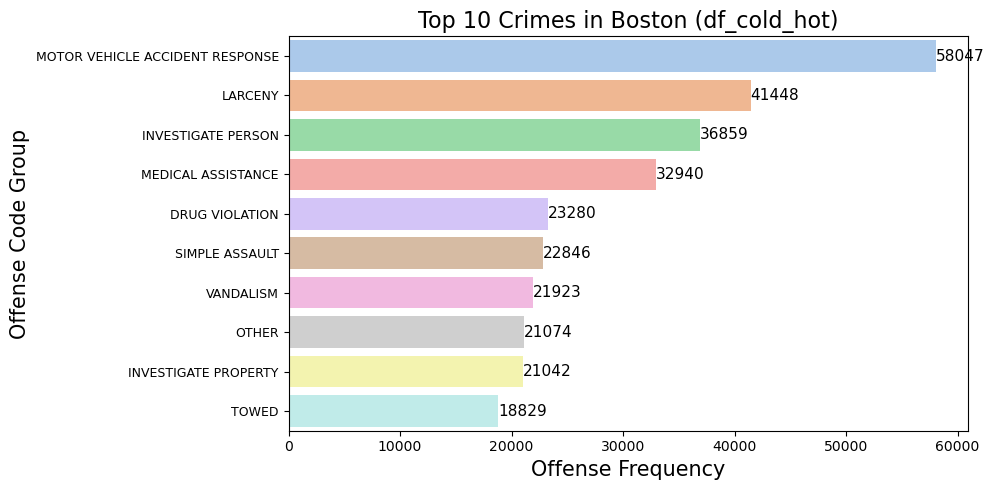

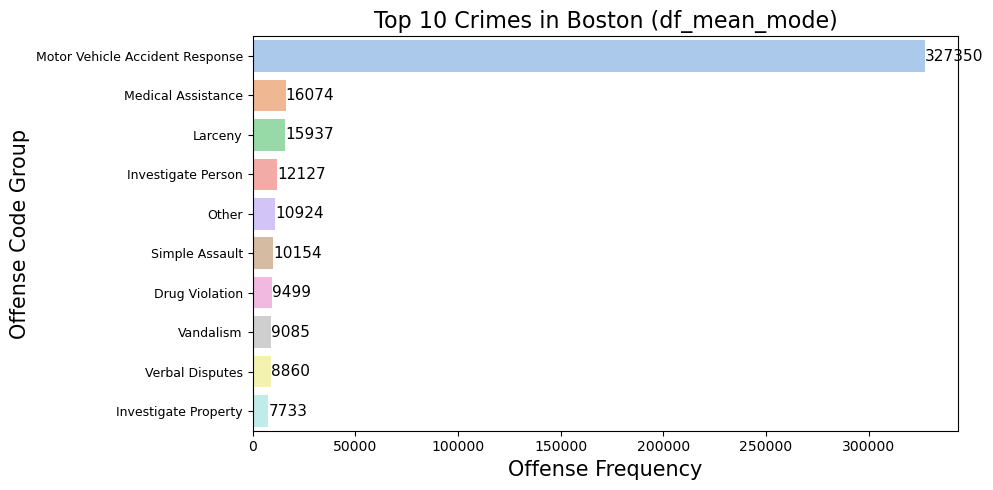

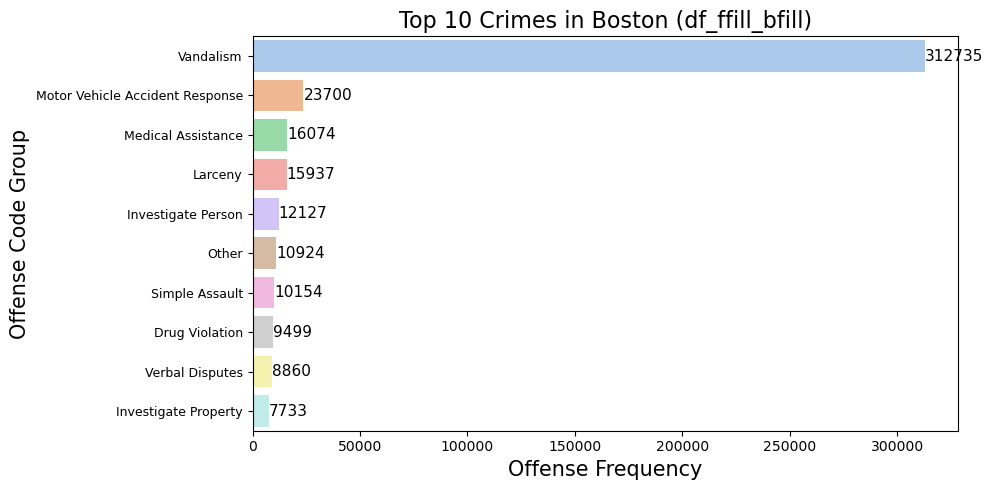

In [161]:
graph_section_1_subsection_6(df_cold_hot, title='Top 10 Crimes in Boston (df_cold_hot)')
graph_section_1_subsection_6(df_mean_mode, title='Top 10 Crimes in Boston (df_mean_mode)')
graph_section_1_subsection_6(df_ffill_bfill, title='Top 10 Crimes in Boston (df_ffill_bfill)')

#### Insights for df_cold_hot :
- Most crime in Boston are related with Motor Vehicle Accident Response, Vandalism and Larceny.

#### Advantages: 
- Identify the most frequent crimes in Boston, this information can be utilized to provide guidance and recommendations to the city's residents

#### Insights for df_mean_mode :
- Not same with df_cold_hot.
- Most crime in Boston are related with Motor Vehicle Accident Response.

#### Insights for df_ffill_bfill :
- Not same with df_cold_hot.
- Most crime in Boston are related with Motor Vehicle Accident Response.


## 3.1.7: Top 10 Shooting Crime in Boston

In [162]:
def graph_section_1_subsection_7(df, title='Top 10 Shooting Crime in Boston'):
    top_crime = df[df['SHOOTING'] == 'Yes'].groupby('OFFENSE_CODE_GROUP')['OFFENSE_CODE'].count().reset_index()
    top_crime = top_crime.rename(columns={'OFFENSE_CODE': 'Shooting_Frequency'})
    top_crime = top_crime.sort_values('Shooting_Frequency', ascending=False)
    top_crime = top_crime.head(10)
   
    colors = sns.color_palette("pastel")
    plt.figure(figsize=(10, 5))
    ax = sns.barplot(data=top_crime, y="OFFENSE_CODE_GROUP", x="Shooting_Frequency", palette=colors)

    # Display numbers on top of the bars
    for p in ax.patches:
        ax.annotate(f'{p.get_width():.0f}', (p.get_width() + 0.5, p.get_y() + p.get_height() / 2),
                    ha='left', va='center', fontsize=11, color='black')

    # Add title and labels
    plt.title(title, fontsize=15)
    plt.ylabel('Offense Code Group', fontsize=15)
    plt.xlabel('Shooting Frequency', fontsize=15)
    plt.yticks(fontsize=9)

    # Show the plot
    plt.tight_layout()
    plt.show()

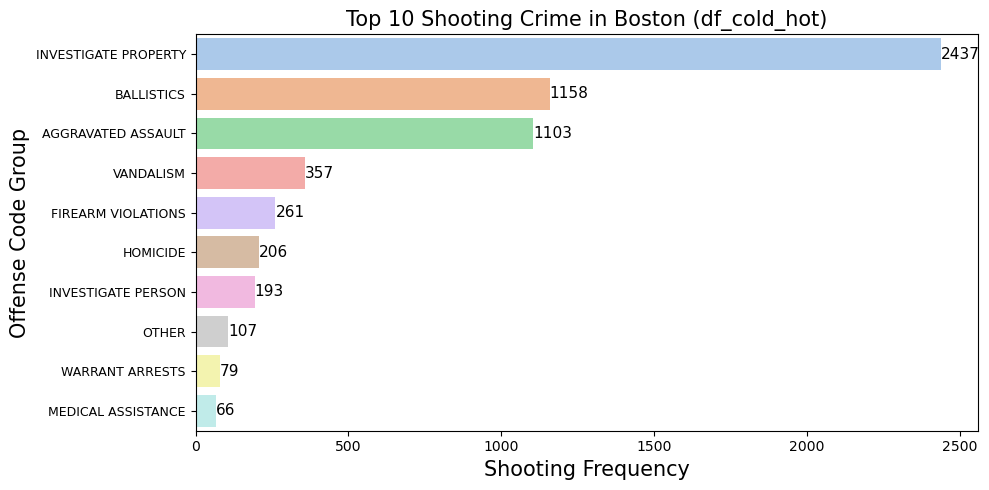

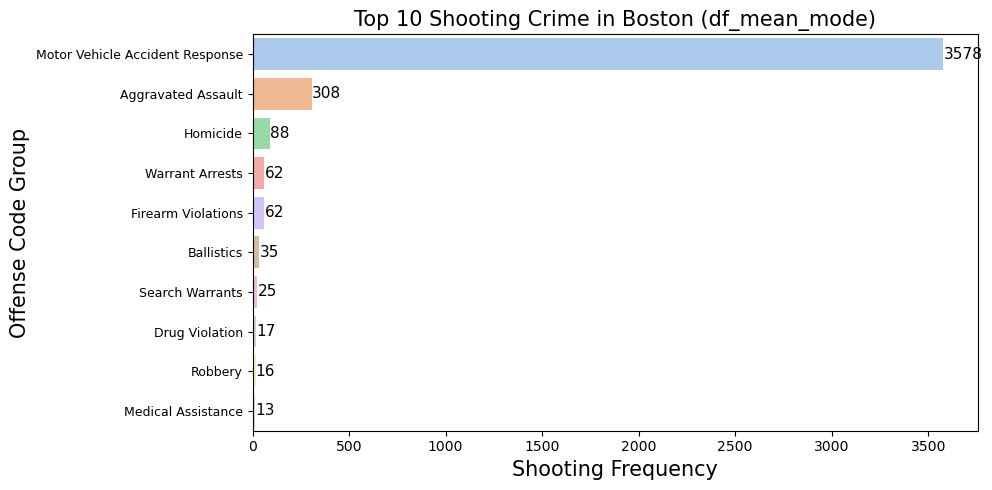

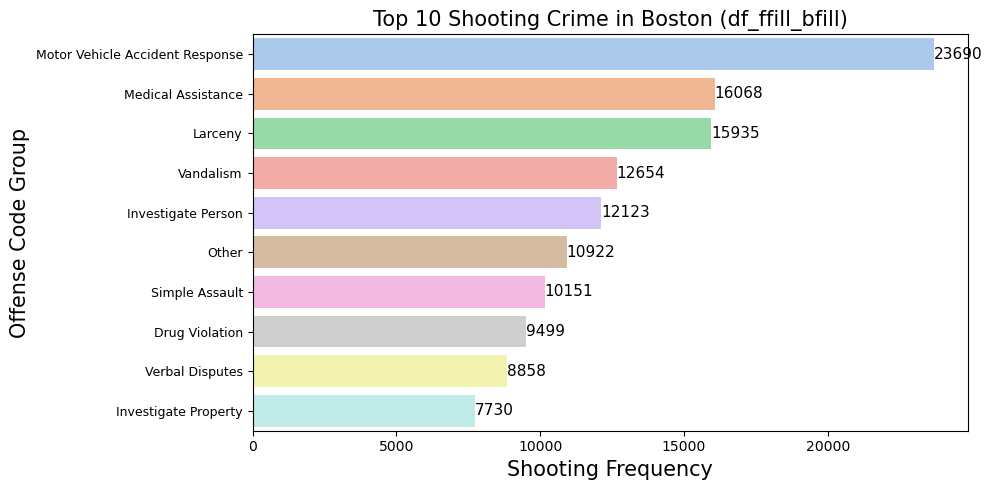

In [163]:
graph_section_1_subsection_7(df_cold_hot, title='Top 10 Shooting Crime in Boston (df_cold_hot)')
graph_section_1_subsection_7(df_mean_mode, title='Top 10 Shooting Crime in Boston (df_mean_mode)')
graph_section_1_subsection_7(df_ffill_bfill, title='Top 10 Shooting Crime in Boston (df_ffill_bfill)')

#### Insights for df_cold_hot:
- Shooting Crime in Boston are related with Investigate Property, Ballistics and Aggravated Assualt.

#### Advantages:
- Identify the most frequent incidents of shootings among crimes in Boston, as this information can be utilized to provide guidance and recommendations to the city's residents

#### References:
- According to an Axios article[1], aggravated assaults in Boston increased slightly from 2021 to 2022, while homicides decreased significantly. The article suggests that this may be due to improved medical care that saves more lives from gunshot wounds, as well as increased community engagement and violence prevention efforts by the police.


- According to a website that tracks crime rates [2], property crime in Boston is lower than the national average, but still higher than 81% of the cities in the United States. The website also shows that most property crimes in Boston are larceny-theft, which may involve stealing firearms or other valuables.

1. https://www.axios.com/local/boston/2022/09/15/boston-violent-crime-rate

2. https://www.macrotrends.net/cities/us/ma/boston/assault-rate-statistics

#### Insights for df_mean_mode:
- Not same with df_cold_hot.
- Shooting Crime in Boston are related Motor Vechicle Accident Response.

#### Insights for df_ffill_bfill:
- Not same with df_cold_hot.
- Shooting Crime in Boston are related Motor Vechicle Accident Response, Medical Assistance and Larceny.

# **Note: After this section, df_mean_mode, df_bfill_ffill will not be used anymore for further analysis and modelling.

#### Reasons:
1. Anomally is detected in some of the analysis.


2. Mean/Mode/Median imputation and forward_fill/backward_fill imputation is highly bias. Because they are univariate analysis that only analyse and make inference based one column only.

## 3.2: Drill Down Analysis: Uncovering the Factors Shaping the Pattern

### 3.2.1: Changes in Top 10 Crimes in different years

In [164]:
def graph_section_2_subsection_1(df):
    yearly_crime = df.groupby(['YEAR', 'OFFENSE_CODE_GROUP'])['OFFENSE_CODE'].count().reset_index()
    yearly_crime = yearly_crime.rename(columns={'OFFENSE_CODE':'Crime_Frequency'})
    yearly_crime = yearly_crime.sort_values(['YEAR','Crime_Frequency'], ascending=False)
    # Get top 10 crime for each year
    yearly_crime = yearly_crime.groupby('YEAR').head(10)
    
    colors = [
    '#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f',
    '#bcbd22', '#17becf', '#aec7e8', '#ffbb78', '#98df8a', '#ff9896', '#c5b0d5', '#c49c94',
    '#f7b6d2', '#c7c7c7', '#dbdb8d', '#9edae5', '#c7e9c0', '#fddaec', '#393b79', '#7b4173',
    '#6b6ecf', '#e7ba52', '#db843d', '#843c39', '#b5cf6b', '#d6616b', '#ce6dbd', '#9c9ede',
    '#d9d9d9', '#d3d3d3', '#737373', '#969696', '#525252', '#252525', '#c51b7d', '#8e0152',
    '#f768a1', '#7a0177', '#4d004b'
]
    plt.figure(figsize=(10, 8))
    ax = sns.pointplot(data=yearly_crime, y="Crime_Frequency", x="YEAR", hue='OFFENSE_CODE_GROUP', palette=colors, capsize=10, markers='o')
    


    # Add title and labels
    plt.title(f'Changes in Top 10 Crimes from Year 2017 to 2022', fontsize=20)
    plt.ylabel('Crime Frequuncy', fontsize=15)
    plt.xlabel('Year', fontsize=15)
    plt.yticks(fontsize=9)

    # Show the plot
    plt.tight_layout()
    plt.grid(True)
    plt.show()


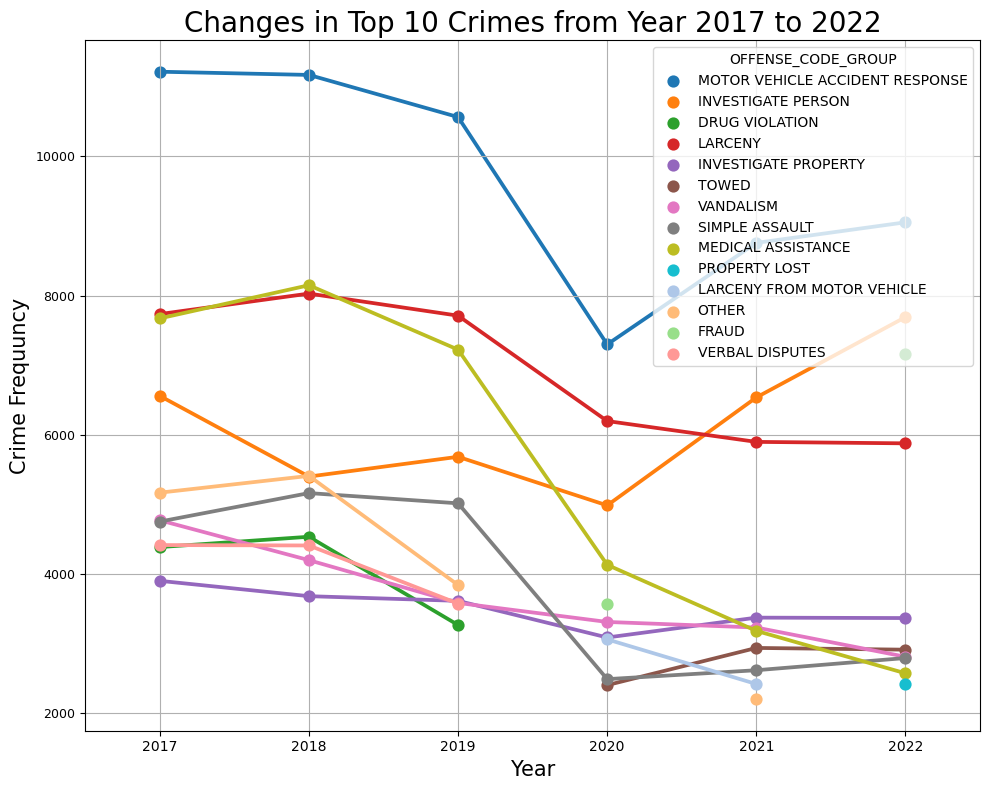

In [165]:
graph_section_2_subsection_1(df_cold_hot)

#### Insights:
- The list of the top 10 crimes changes from year to year. Some crimes like MOTOR VEHICLE ACCIDENT RESPONSE(Car accident), INVESTIGATE PERSON(investigating people) AND LARCENY(theft) are always in the top 10. 


- But there are other crimes that only show up in the top 10 for certain years.


- For example, DRUG VIOLATION(drugs) has been inside the top 10 crime list from 2017 to 2019, but it disappear from 2020 to 2021, and finally appear again in year 2022.


- TOWED(illegal parking) crime only appear in top 10 crime list from year 2020 to 2022

#### Advantages:
- Fosters better communication between law enforcement and the community. 

- Authorities can share insights and address concerns related to the changing crime landscape.

### 3.2.2: Crimes That Only Occurs During Specific Years

In [166]:
def graph_section_2_subsection_2(df):
    yearly_crime = df.groupby(['YEAR', 'OFFENSE_CODE_GROUP'])['OFFENSE_CODE'].count().reset_index()
    yearly_crime = yearly_crime.rename(columns={'OFFENSE_CODE':'Crime_Frequency'})
  
    # Select crimes that appear less than 20 times from top 10 crimes 
    special_crimes_list = yearly_crime['OFFENSE_CODE_GROUP'].value_counts()[yearly_crime['OFFENSE_CODE_GROUP'].value_counts() < 6].index.to_list()
    yearly_crime = yearly_crime[yearly_crime['OFFENSE_CODE_GROUP'].isin(special_crimes_list)]
    
    colors = [
    '#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f',
    '#bcbd22', '#17becf', '#aec7e8', '#ffbb78', '#98df8a', '#ff9896', '#c5b0d5', '#c49c94',
    '#f7b6d2', '#c7c7c7', '#dbdb8d', '#9edae5', '#c7e9c0', '#fddaec', '#393b79', '#7b4173',
    '#6b6ecf', '#e7ba52', '#db843d', '#843c39', '#b5cf6b', '#d6616b', '#ce6dbd', '#9c9ede',
    '#d9d9d9', '#d3d3d3', '#737373', '#969696', '#525252', '#252525', '#c51b7d', '#8e0152',
    '#f768a1', '#7a0177', '#4d004b'
]
    plt.figure(figsize=(10, 5))
    ax = sns.pointplot(data=yearly_crime, y="Crime_Frequency", x="YEAR", hue='OFFENSE_CODE_GROUP', palette=colors, capsize=10, markers='o')
    


    # Add title and labels
    plt.title(f'Crimes That Only Occurs During Specific Years', fontsize=20)
    plt.ylabel('Crime Frequuncy', fontsize=15)
    plt.xlabel('Year', fontsize=15)
    plt.yticks(fontsize=9)

    # Show the plot
    plt.tight_layout()
    plt.grid(True)
    plt.show()

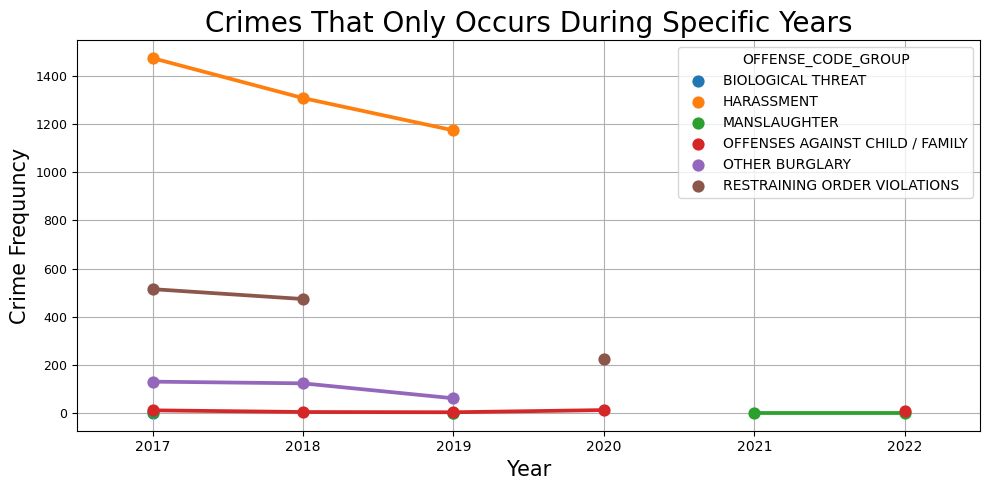

In [167]:
graph_section_2_subsection_2(df_cold_hot)

#### Insights:
- Crimes like HARASSMENT AND OTHER BURGLARY only occured during 2017 to 2019.


- Crimes like RESTRAINING ORDER VIOLATIONS only occured during 2017 to 2018 and 2020.

#### Advantages:
- Fosters better communication between law enforcement and the community.


- Authorities can share insights and address concerns related to the changing crime landscape.

### 3.2.3: Changes in Top 10 Crimes in Different Months

In [168]:
def graph_section_2_subsection_3(df):
    MONTHly_crime = df.groupby(['MONTH', 'OFFENSE_CODE_GROUP'])['OFFENSE_CODE'].count().reset_index()
    MONTHly_crime = MONTHly_crime.rename(columns={'OFFENSE_CODE':'Crime_Frequency'})
    MONTHly_crime = MONTHly_crime.sort_values(['MONTH','Crime_Frequency'], ascending=False)
    # Get top 10 crime for each MONTH
    MONTHly_crime = MONTHly_crime.groupby('MONTH').head(10)
    
    colors = [
    '#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f',
    '#bcbd22', '#17becf', '#aec7e8', '#ffbb78', '#98df8a', '#ff9896', '#c5b0d5', '#c49c94',
    '#f7b6d2', '#c7c7c7', '#dbdb8d', '#9edae5', '#c7e9c0', '#fddaec', '#393b79', '#7b4173',
    '#6b6ecf', '#e7ba52', '#db843d', '#843c39', '#b5cf6b', '#d6616b', '#ce6dbd', '#9c9ede',
    '#d9d9d9', '#d3d3d3', '#737373', '#969696', '#525252', '#252525', '#c51b7d', '#8e0152',
    '#f768a1', '#7a0177', '#4d004b'
]
    plt.figure(figsize=(10, 8))
    ax = sns.pointplot(data=MONTHly_crime, y="Crime_Frequency", x="MONTH", hue='OFFENSE_CODE_GROUP', palette=colors, capsize=10, markers='o')
    


    # Add title and labels
    plt.title(f'Changes in Top 10 Crimes from Month 1 to 12', fontsize=20)
    plt.ylabel('Crime Frequuncy', fontsize=15)
    plt.xlabel('Month', fontsize=15)
    plt.yticks(fontsize=9)

    # Show the plot
    plt.tight_layout()
    plt.grid(True)
    plt.show()

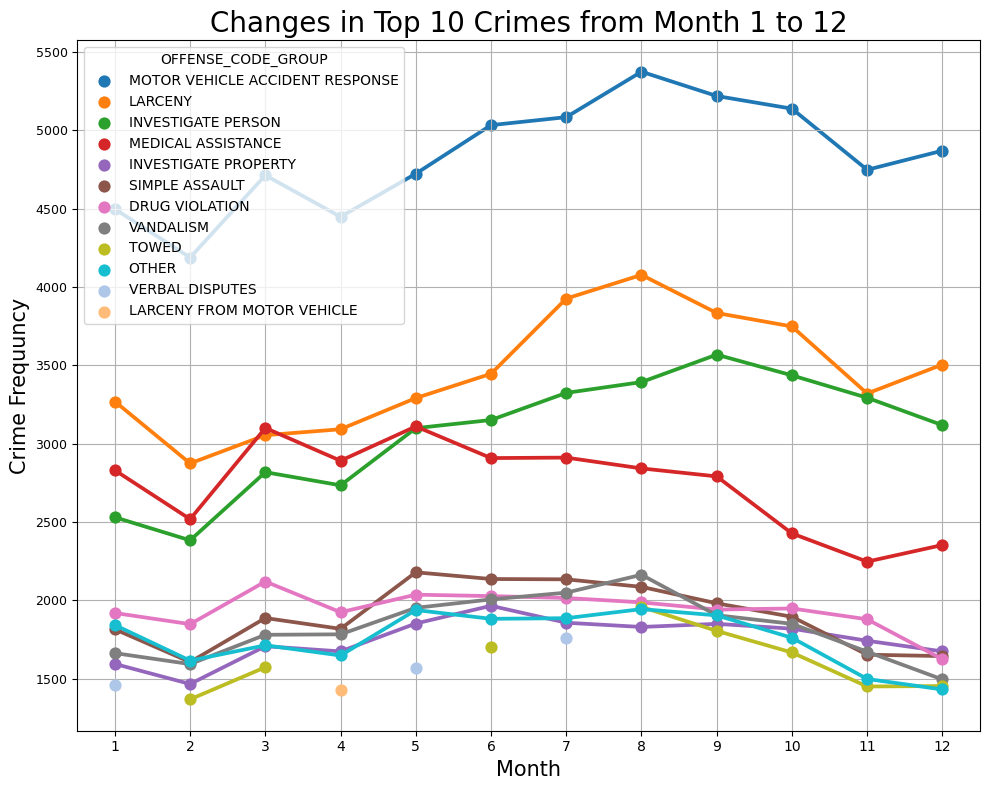

In [169]:
graph_section_2_subsection_3(df_cold_hot)

#### Insights:
- The list of the top 10 crimes changes from month to month. Some crimes like MOTOR VEHICLE ACCIDENT RESPONSE(Car accident), INVESTIGATE PERSON(investigating people) AND LARCENY(theft) are always in the top 10. 


- But there are other crimes that only show up in the top 10 for certain months.


- For example, VERBAL DISPUTE only appear in top 10 crimes list for the month January, April and July.


- LARCENY FROM MOTOR VEHICLE CRIME only appear in top 10 crime list for the month April.

#### Advantages:
- Fosters better communication between law enforcement and the community. 

- Authorities can share insights and address concerns related to the changing crime landscape.

### 3.2.4: Crimes That Only Occurs During Specific Months

In [170]:
def graph_section_2_subsection_4(df):
    MONTHly_crime = df.groupby(['MONTH', 'OFFENSE_CODE_GROUP'])['OFFENSE_CODE'].count().reset_index()
    MONTHly_crime = MONTHly_crime.rename(columns={'OFFENSE_CODE':'Crime_Frequency'})
  
    # Select crimes that appear less than 20 times from top 10 crimes 
    special_crimes_list = MONTHly_crime['OFFENSE_CODE_GROUP'].value_counts()[MONTHly_crime['OFFENSE_CODE_GROUP'].value_counts() < 12].index.to_list()
    MONTHly_crime = MONTHly_crime[MONTHly_crime['OFFENSE_CODE_GROUP'].isin(special_crimes_list)]
    
    colors = [
    '#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f',
    '#bcbd22', '#17becf', '#aec7e8', '#ffbb78', '#98df8a', '#ff9896', '#c5b0d5', '#c49c94',
    '#f7b6d2', '#c7c7c7', '#dbdb8d', '#9edae5', '#c7e9c0', '#fddaec', '#393b79', '#7b4173',
    '#6b6ecf', '#e7ba52', '#db843d', '#843c39', '#b5cf6b', '#d6616b', '#ce6dbd', '#9c9ede',
    '#d9d9d9', '#d3d3d3', '#737373', '#969696', '#525252', '#252525', '#c51b7d', '#8e0152',
    '#f768a1', '#7a0177', '#4d004b'
]
    plt.figure(figsize=(10, 5))
    ax = sns.pointplot(data=MONTHly_crime, y="Crime_Frequency", x="MONTH", hue='OFFENSE_CODE_GROUP', palette=colors, capsize=10, markers='o')
    


    # Add title and labels
    plt.title(f'Crimes That Only Occurs During Specific Months', fontsize=20)
    plt.ylabel('Crime Frequuncy', fontsize=15)
    plt.xlabel('Month', fontsize=15)
    plt.yticks(fontsize=9)

    # Show the plot
    plt.tight_layout()
    plt.grid(True)
    plt.show()

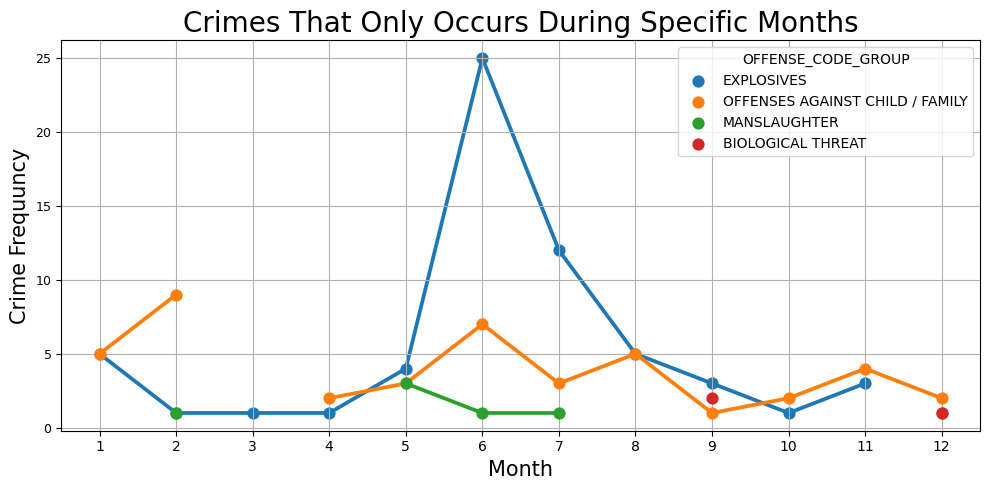

In [171]:
graph_section_2_subsection_4(df_cold_hot)

#### Insights:
- Crimes like MANLAUGHTER only occured during the month February, May, September and July only


- Crimes like BIOLOGICAL THREAT only occured during the month September and December.

#### Advantages:
- Fosters better communication between law enforcement and the community.


- Authorities can share insights and address concerns related to the changing crime landscape.

### 3.2.5: Changes in Top 10 Crimes in Different Day of Weeks

In [172]:
df_cold_hot.columns

Index(['INCIDENT_NUMBER', 'OFFENSE_CODE', 'OFFENSE_CODE_GROUP',
       'OFFENSE_DESCRIPTION', 'DISTRICT', 'REPORTING_AREA', 'SHOOTING',
       'OCCURRED_ON_DATE', 'YEAR', 'MONTH', 'DAY_OF_WEEK', 'HOUR', 'UCR_PART',
       'STREET', 'Lat', 'Long', 'Location', 'Day_Of_Week_Number'],
      dtype='object')

In [173]:
def graph_section_2_subsection_5(df):
    Day_Of_Week_Numberly_crime = df.groupby(['Day_Of_Week_Number', 'OFFENSE_CODE_GROUP'])['OFFENSE_CODE'].count().reset_index()
    Day_Of_Week_Numberly_crime = Day_Of_Week_Numberly_crime.rename(columns={'OFFENSE_CODE':'Crime_Frequency'})
    Day_Of_Week_Numberly_crime = Day_Of_Week_Numberly_crime.sort_values(['Day_Of_Week_Number','Crime_Frequency'], ascending=False)
    # Get top 10 crime for each Day_Of_Week_Number
    Day_Of_Week_Numberly_crime = Day_Of_Week_Numberly_crime.groupby('Day_Of_Week_Number').head(10)
    
    

    colors = [
    '#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f',
    '#bcbd22', '#17becf', '#aec7e8', '#ffbb78', '#98df8a', '#ff9896', '#c5b0d5', '#c49c94',
    '#f7b6d2', '#c7c7c7', '#dbdb8d', '#9edae5', '#c7e9c0', '#fddaec', '#393b79', '#7b4173',
    '#6b6ecf', '#e7ba52', '#db843d', '#843c39', '#b5cf6b', '#d6616b', '#ce6dbd', '#9c9ede',
    '#d9d9d9', '#d3d3d3', '#737373', '#969696', '#525252', '#252525', '#c51b7d', '#8e0152',
    '#f768a1', '#7a0177', '#4d004b']
    plt.figure(figsize=(10, 8))
    ax = sns.pointplot(data=Day_Of_Week_Numberly_crime, y="Crime_Frequency", x="Day_Of_Week_Number", hue='OFFENSE_CODE_GROUP', palette=colors, capsize=10, markers='o')
    


    # Add title and labels
    plt.title(f'Changes in Top 10 Crimes from Monday to Sunday', fontsize=20)
    plt.ylabel('Crime Frequuncy', fontsize=15)
    plt.xlabel('Day_Of_Week_Number', fontsize=15)
    days_of_week = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
    plt.xticks(range(7), days_of_week)
    plt.yticks(fontsize=9)

    # Show the plot
    plt.tight_layout()
    plt.grid(True)
    plt.show()

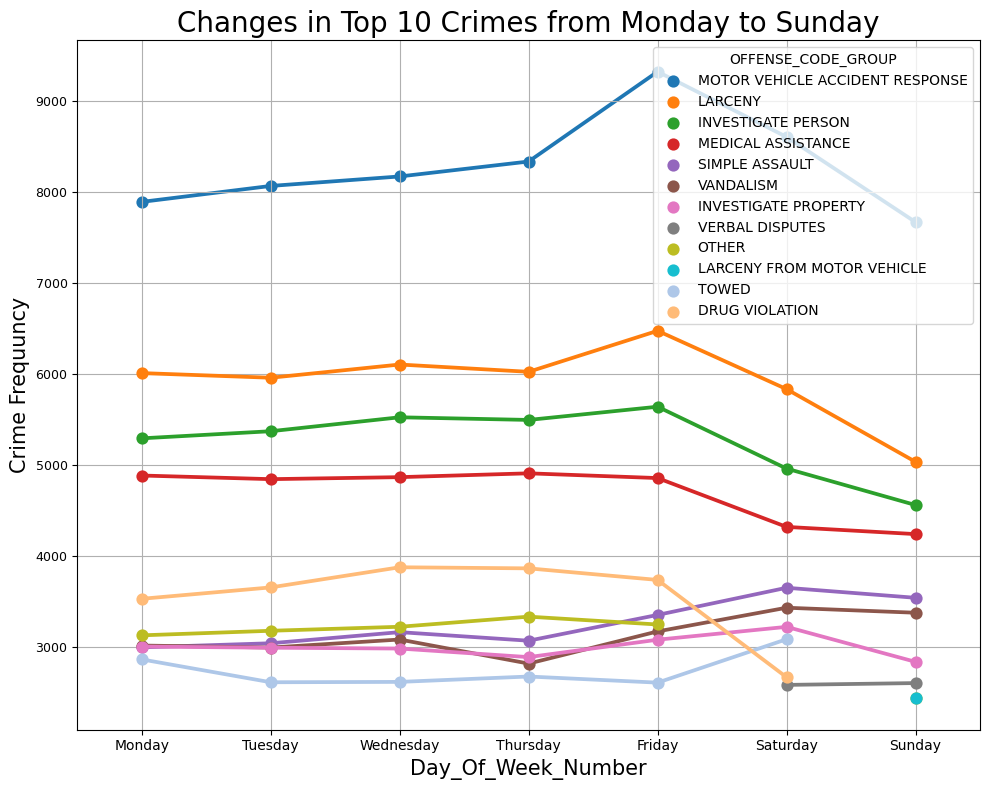

In [174]:
graph_section_2_subsection_5(df_cold_hot)

#### Insights:
- The list of the top 10 crimes changes from day to day. Some crimes like MOTOR VEHICLE ACCIDENT RESPONSE(Car accident), INVESTIGATE PERSON(investigating people) AND LARCENY(theft) are always in the top 10. 


- But there are other crimes that only show up in the top 10 list for certain days.


- For example, DRUG VIOLATION only appear in top 10 crime list from Monday to Saturday only.


- VERBAL DISPUTE only appear in top 10 crime list in Saturday and Sunday only.

#### Advantages:
- Fosters better communication between law enforcement and the community. 

- Authorities can share insights and address concerns related to the changing crime landscape.

### 3.2.6  : Crimes That Only Occurs During Specific Day of Weeks

In [175]:
def graph_section_2_subsection_6(df):
    Day_Of_Week_Numberly_crime = df.groupby(['Day_Of_Week_Number', 'OFFENSE_CODE_GROUP'])['OFFENSE_CODE'].count().reset_index()
    Day_Of_Week_Numberly_crime = Day_Of_Week_Numberly_crime.rename(columns={'OFFENSE_CODE':'Crime_Frequency'})
  
    # Select crimes that appear less than 20 times from top 10 crimes 
    special_crimes_list = Day_Of_Week_Numberly_crime['OFFENSE_CODE_GROUP'].value_counts()[Day_Of_Week_Numberly_crime['OFFENSE_CODE_GROUP'].value_counts() < 7].index.to_list()
    Day_Of_Week_Numberly_crime = Day_Of_Week_Numberly_crime[Day_Of_Week_Numberly_crime['OFFENSE_CODE_GROUP'].isin(special_crimes_list)]
    
    colors = [
    '#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f',
    '#bcbd22', '#17becf', '#aec7e8', '#ffbb78', '#98df8a', '#ff9896', '#c5b0d5', '#c49c94',
    '#f7b6d2', '#c7c7c7', '#dbdb8d', '#9edae5', '#c7e9c0', '#fddaec', '#393b79', '#7b4173',
    '#6b6ecf', '#e7ba52', '#db843d', '#843c39', '#b5cf6b', '#d6616b', '#ce6dbd', '#9c9ede',
    '#d9d9d9', '#d3d3d3', '#737373', '#969696', '#525252', '#252525', '#c51b7d', '#8e0152',
    '#f768a1', '#7a0177', '#4d004b'
]
    plt.figure(figsize=(10, 5))
    ax = sns.pointplot(data=Day_Of_Week_Numberly_crime, y="Crime_Frequency", x="Day_Of_Week_Number", hue='OFFENSE_CODE_GROUP', palette=colors, capsize=10, markers='o')
    


    # Add title and labels
    plt.title(f'Crimes That Only Occurs During Specific Day of Week', fontsize=20)
    plt.ylabel('Crime Frequuncy', fontsize=15)
    plt.xlabel('Day_Of_Week_Number', fontsize=15)
    plt.yticks(fontsize=9)
    days_of_week = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
    plt.xticks(range(7), days_of_week)

    # Show the plot
    plt.tight_layout()
    plt.grid(True)
    plt.show()

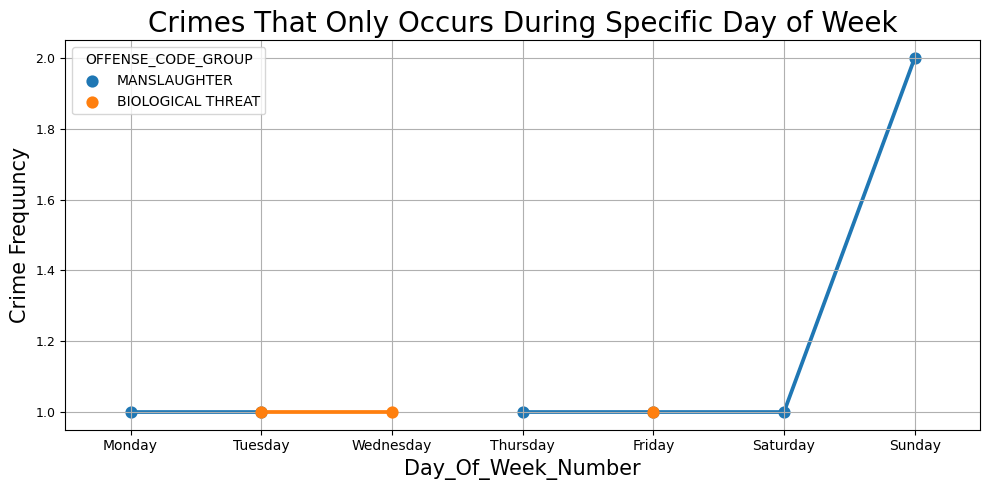

In [176]:
graph_section_2_subsection_6(df_cold_hot)

#### Insights:
- Crimes like MANLAUGHTER occured every day except Wednesday.


- Crimes like BIOLOGICAL THREAT only occured in Tuesday, Wednesday and Friday.

#### Advantages:
- Fosters better communication between law enforcement and the community.


- Authorities can share insights and address concerns related to the changing crime landscape.

### 3.2.7: Changes in Top 5 Crime Trends across Different Hours

In [177]:
def graph_section_2_subsection_7(df):
    hourly_crime = df.groupby(['HOUR', 'OFFENSE_CODE_GROUP'])['OFFENSE_CODE'].count().reset_index()
    hourly_crime = hourly_crime.rename(columns={'OFFENSE_CODE':'Crime_Frequency'})
    hourly_crime = hourly_crime.sort_values(['HOUR','Crime_Frequency'], ascending=False)
    hourly_crime = hourly_crime.groupby('HOUR').head(5)
    

    colors = [
    '#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f',
    '#bcbd22', '#17becf', '#aec7e8', '#ffbb78', '#98df8a', '#ff9896', '#c5b0d5', '#c49c94',
    '#f7b6d2', '#c7c7c7', '#dbdb8d', '#9edae5', '#c7e9c0', '#fddaec', '#393b79', '#7b4173',
    '#6b6ecf', '#e7ba52', '#db843d', '#843c39', '#b5cf6b', '#d6616b', '#ce6dbd', '#9c9ede',
    '#d9d9d9', '#d3d3d3', '#737373', '#969696', '#525252', '#252525', '#c51b7d', '#8e0152',
    '#f768a1', '#7a0177', '#4d004b'
]
    plt.figure(figsize=(10, 6))
    sns.pointplot(data=hourly_crime, y="Crime_Frequency", x="HOUR", hue='OFFENSE_CODE_GROUP', palette=colors)


    # Add title and labels
    plt.title(f'Changes in Top 5 Crime Trends in Different Hours', fontsize=20)
    plt.ylabel('Crime Frequency', fontsize=15)
    plt.xlabel('HOUR', fontsize=15)
    plt.yticks(fontsize=9)

    # Show the plot
    plt.tight_layout()
    plt.grid(True)
    plt.show()
    

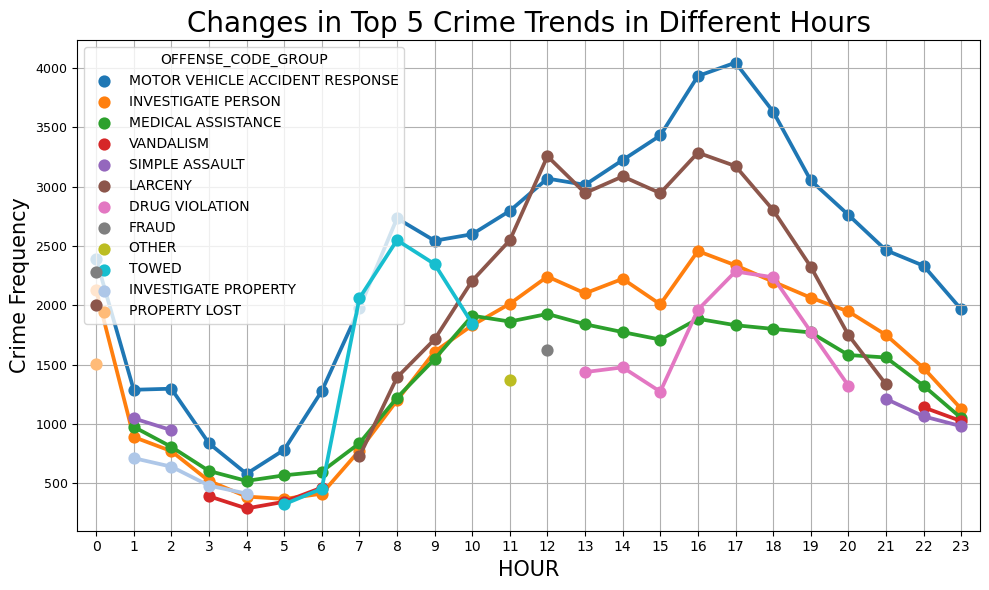

In [178]:
graph_section_2_subsection_7(df_cold_hot)

#### Insights:
- The list of the top 5 crimes changes from hour to hour. Some crimes like MOTOR VEHICLE ACCIDENT RESPONSE(Car accident), INVESTIGATE PERSON(investigating people) AND LARCENY(theft) are always in the top 5 list.


- Some Crimes like INVESTIGATE PROPERTY and DRUG VOLATION only exist in the top 5 list for a specific range of hours only.


- INVESTIGATE PROPERTY exist in top 5 list from 01:00 HOUR to 04:00 HOUR only.


- DRUG VOLATION exist in top 5 list from 13:00 HOUR to 20:00 HOUR only.

#### Advantages:
- Fosters better communication between law enforcement and the community.


- Authorities can share insights and address concerns related to the changing crime landscape.

### 3.2.8: Crimes That Only Occurs During Specific Hours

In [179]:
def graph_section_2_subsection_8(df):

    
    hourly_crime = df.groupby(['HOUR', 'OFFENSE_CODE_GROUP'])['OFFENSE_CODE'].count().reset_index()
    hourly_crime = hourly_crime.rename(columns={'OFFENSE_CODE':'Crime_Frequency'})
    hourly_crime = hourly_crime.sort_values(['HOUR','Crime_Frequency'], ascending=False)
    colors = [
    '#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f',
    '#bcbd22', '#17becf', '#aec7e8', '#ffbb78', '#98df8a', '#ff9896', '#c5b0d5', '#c49c94',
    '#f7b6d2', '#c7c7c7', '#dbdb8d', '#9edae5', '#c7e9c0', '#fddaec', '#393b79', '#7b4173',
    '#6b6ecf', '#e7ba52', '#db843d', '#843c39', '#b5cf6b', '#d6616b', '#ce6dbd', '#9c9ede',
    '#d9d9d9', '#d3d3d3', '#737373', '#969696', '#525252', '#252525', '#c51b7d', '#8e0152',
    '#f768a1', '#7a0177', '#4d004b'
]

    # Select crimes that appear less than 24 times from top 10 crimes 
    special_crimes_list = hourly_crime['OFFENSE_CODE_GROUP'].value_counts()[hourly_crime['OFFENSE_CODE_GROUP'].value_counts() < 21].index.to_list()
    hourly_crime = hourly_crime[hourly_crime['OFFENSE_CODE_GROUP'].isin(special_crimes_list)]
    
    plt.figure(figsize=(10, 5))
    sns.pointplot(data=hourly_crime, y="Crime_Frequency", x="HOUR", hue='OFFENSE_CODE_GROUP', palette=colors)


    # Add title and labels
    plt.title(f'Crimes that only Occurs during Specific Hours', fontsize=20)
    plt.ylabel('Crime Frequency', fontsize=15)
    plt.xlabel('HOUR', fontsize=15)
    plt.yticks(fontsize=9)
    # Show the plot
    plt.tight_layout()
    plt.grid(True)
    plt.show()
    
   
    

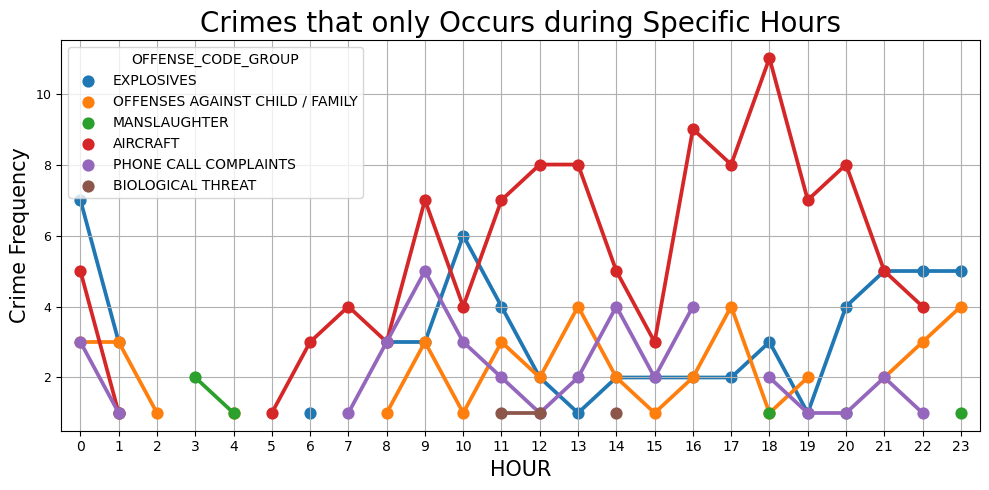

In [180]:
graph_section_2_subsection_8(df_cold_hot)

#### Insights:
- Crimes like MANLAUGHTER occured only during 03:00 HOUR, 04:00 HOUR, 18:00 HOUR, and 23:00 HOUR.


- Crimes like BIOLOGICAL THREAT only occured in 11:00 HOUR, 12:00 HOUR and 14:00 HOUR.

#### Advantages:
- Fosters better communication between law enforcement and the community.


- Authorities can share insights and address concerns related to the changing crime landscape.

### 3.2.9: Changes in Top 5 Crime Trends Across Different Hours (For Each District)

In [181]:
def graph_section_2_subsection_9(df):
    
    district_list = list(df['DISTRICT'].unique())
    
    for district_name in district_list:
        
        hourly_crime = df[df['DISTRICT'] == district_name].groupby(['HOUR', 'OFFENSE_CODE_GROUP'])['OFFENSE_CODE'].count().reset_index()
        hourly_crime = hourly_crime.rename(columns={'OFFENSE_CODE':'Crime_Frequency'})
        hourly_crime = hourly_crime.sort_values(['HOUR','Crime_Frequency'], ascending=False)
        hourly_crime = hourly_crime.groupby('HOUR').head(5)


        colors = [
        '#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f',
        '#bcbd22', '#17becf', '#aec7e8', '#ffbb78', '#98df8a', '#ff9896', '#c5b0d5', '#c49c94',
        '#f7b6d2', '#c7c7c7', '#dbdb8d', '#9edae5', '#c7e9c0', '#fddaec', '#393b79', '#7b4173',
        '#6b6ecf', '#e7ba52', '#db843d', '#843c39', '#b5cf6b', '#d6616b', '#ce6dbd', '#9c9ede',
        '#d9d9d9', '#d3d3d3', '#737373', '#969696', '#525252', '#252525', '#c51b7d', '#8e0152',
        '#f768a1', '#7a0177', '#4d004b'
    ]
        plt.figure(figsize=(10, 5))
        sns.pointplot(data=hourly_crime, y="Crime_Frequency", x="HOUR", hue='OFFENSE_CODE_GROUP', palette=colors)


        # Add title and labels
        plt.title(f'(District Name: {district_name})Changes in Top 5 Crime Trends in Different Hours', fontsize=20)
        plt.ylabel('Crime Frequency', fontsize=15)
        plt.xlabel('HOUR', fontsize=15)
        plt.yticks(fontsize=9)

        # Show the plot
        plt.tight_layout()
        plt.grid(True)
        plt.show()
    

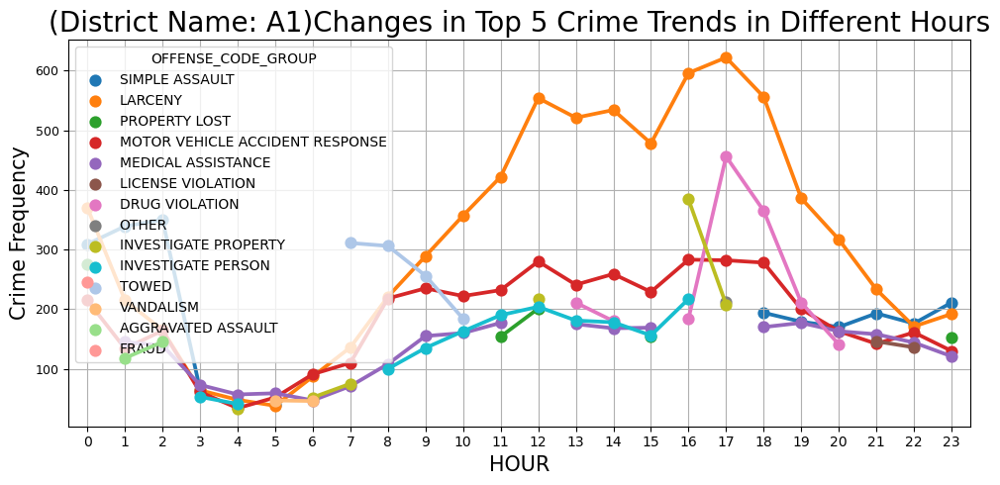

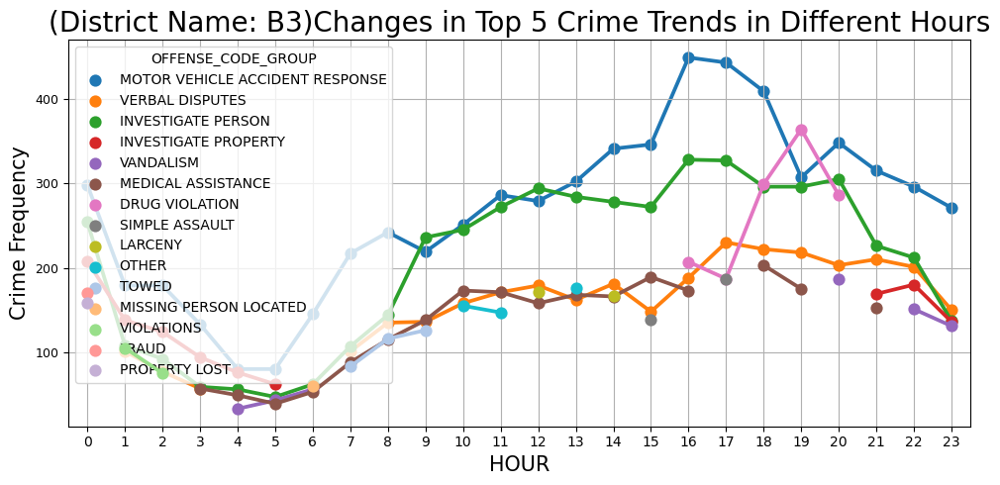

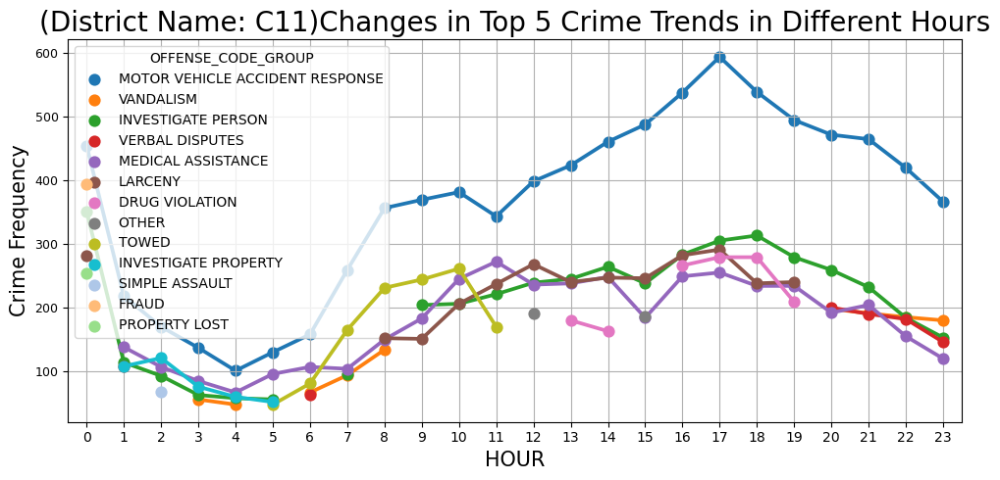

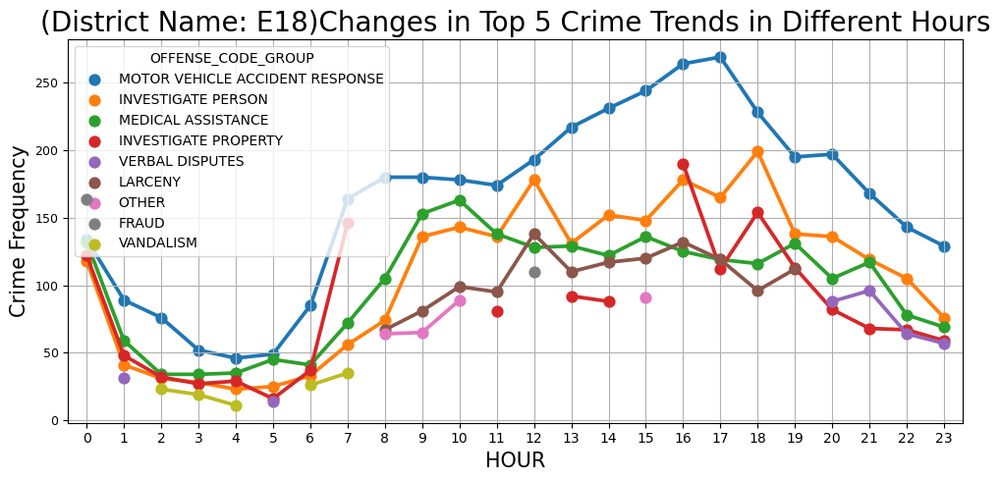

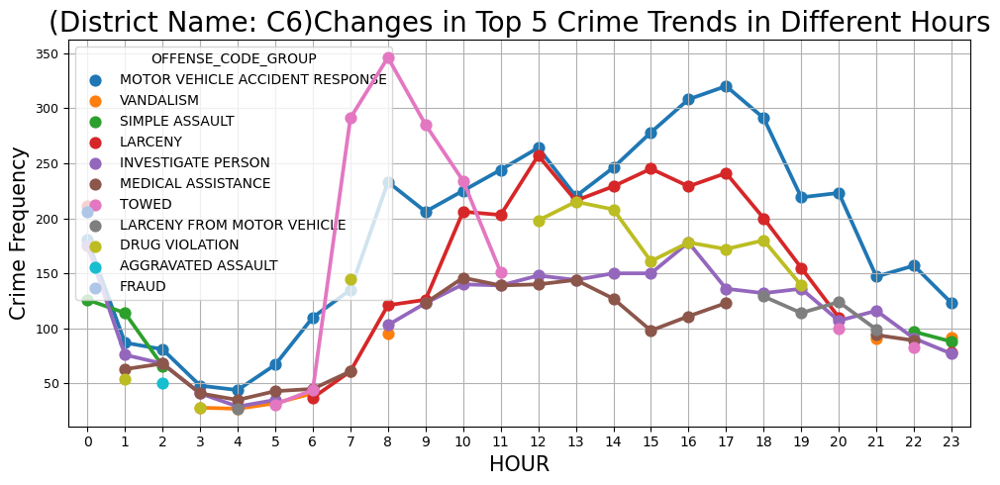

...

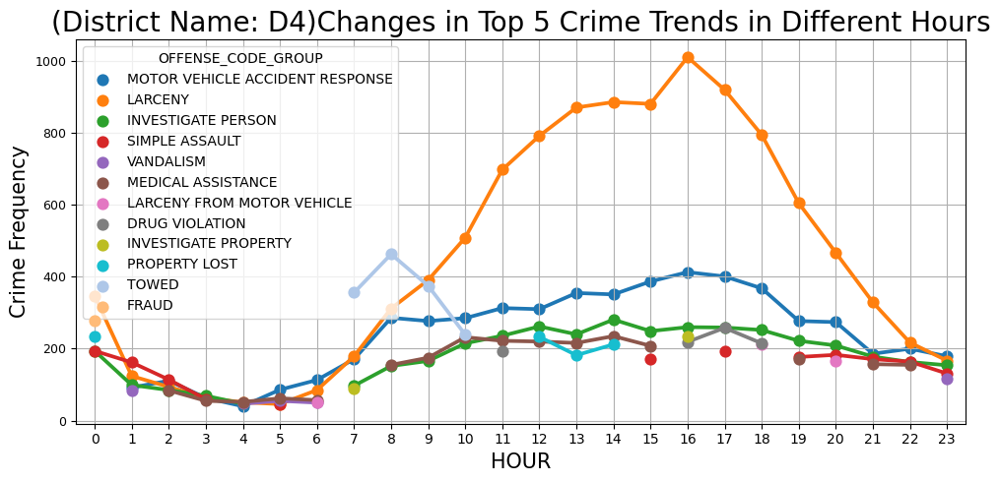

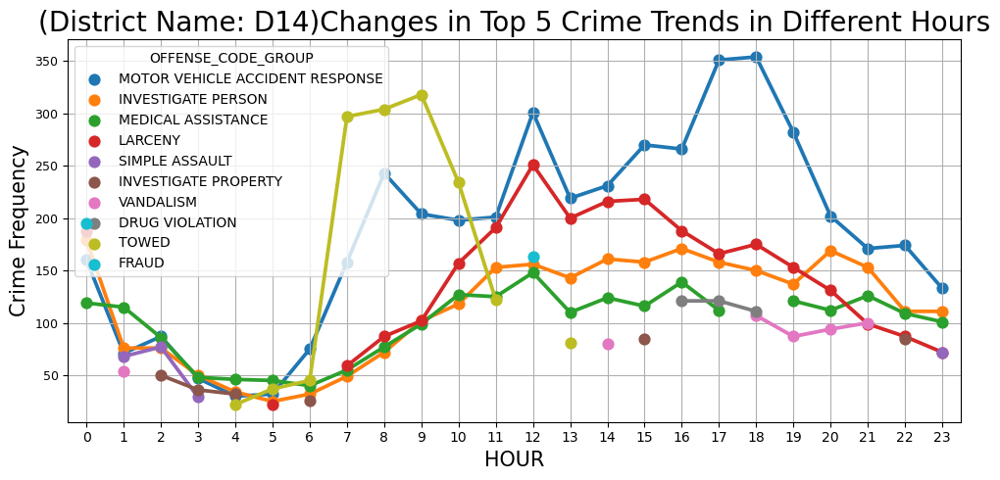

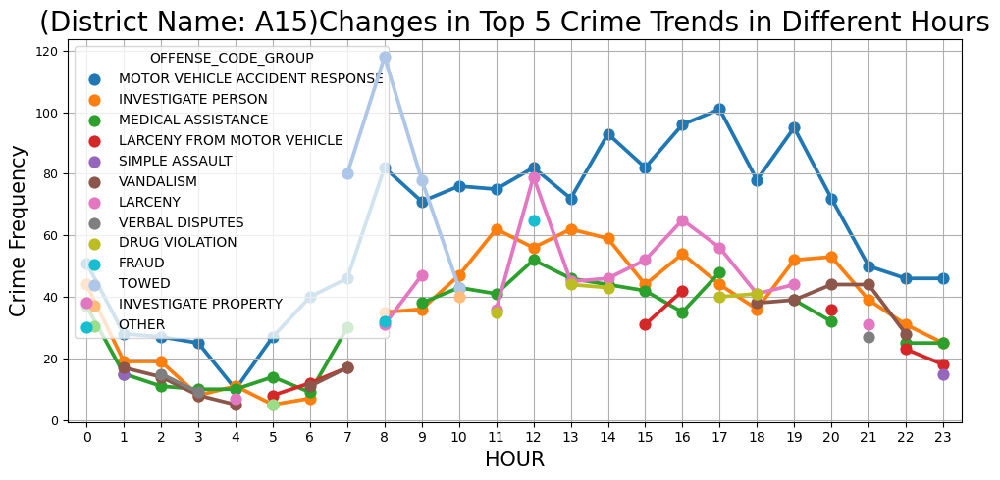

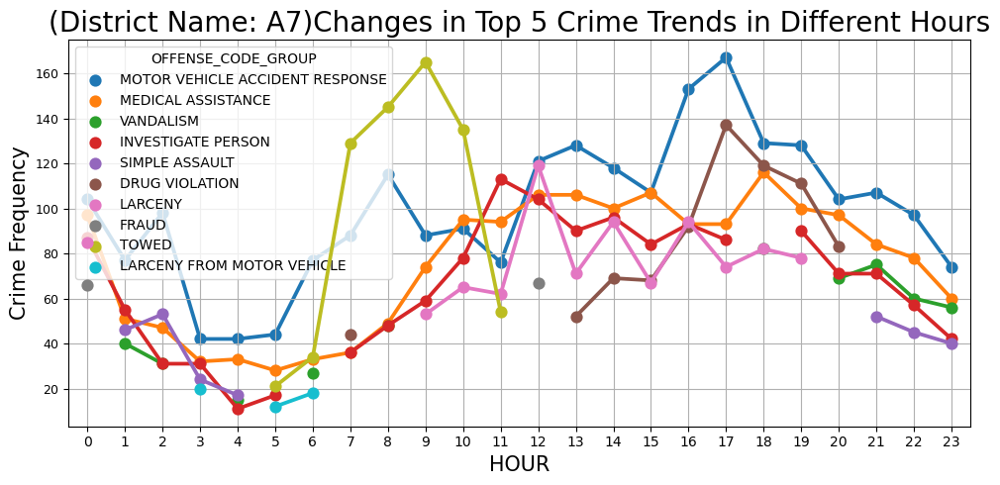

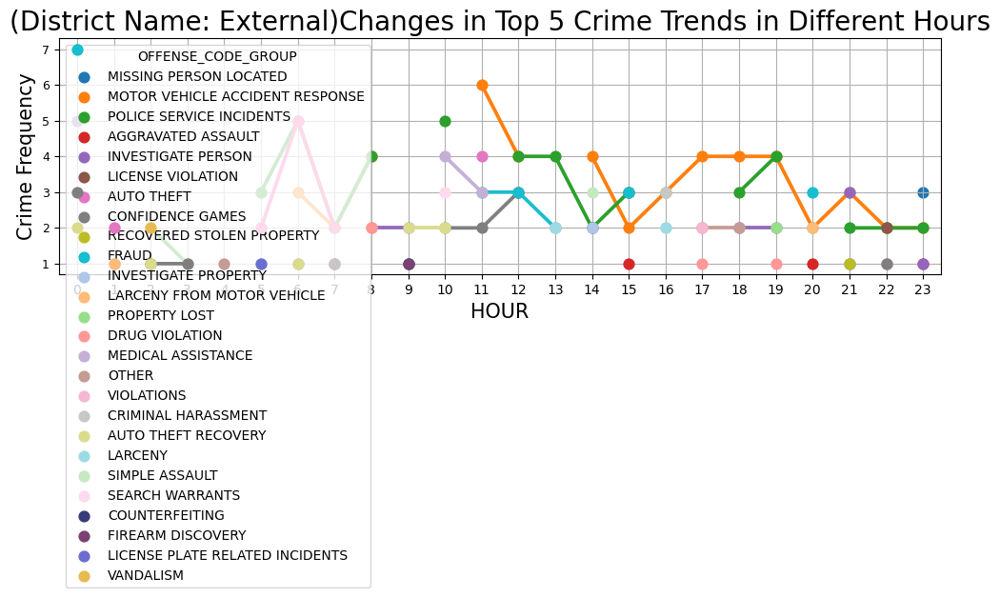

In [182]:
graph_section_2_subsection_9(df_cold_hot)

#### Insights:
- Each District has different top 5 crime list at different hours.

#### Advantages:
- Fosters better communication between law enforcement and the community.


- Authorities can share insights and address concerns related to the changing crime landscape.

# 4. Feature Selection

## 4.1: Select latitude and longtitude column

In [183]:
training_df = df_cold_hot[['Lat', 'Long']]

# 5. Modelling

## 5.1: K-Medoids

In [186]:
#Create a stratify sampling function
def stratify_sampling(df, sample_size=5000):
    sample_df = pd.DataFrame()
    districts = df['DISTRICT'].unique()
    for district in districts:
        # Check district length
        data_length = len(df[df['DISTRICT'] == district])
        # Perform sampling only if district length is longer than sample size
        if data_length > sample_size:
            data = df[df['DISTRICT'] == district].sample(sample_size)
            sample_df = pd.concat([sample_df, data], ignore_index=True)
        else:
            data = df[df['DISTRICT'] == district]
            sample_df = pd.concat([sample_df, data], ignore_index=True)
    return sample_df  

In [187]:
# Perform stratify sampling
sample_df_cold_hot = stratify_sampling(df_cold_hot)

In [188]:
sample_df_cold_hot.shape

(60403, 18)

### Using own implementation

In [189]:
import numpy as np
from scipy.spatial.distance import cdist

class KMedoids:
    def __init__(self, k=5, max_iters=100):
        self.k = k
        self.max_iters = max_iters
    
    def fit(self, X):
        n_samples, n_features = X.shape

        # Initialize medoids randomly
        medoid_indices = np.random.choice(n_samples, self.k, replace=False)
        self.medoids = X[medoid_indices]

        for _ in range(self.max_iters):
            # Compute pairwise distances between samples and medoids
            distances = cdist(X, self.medoids, metric='euclidean')

            # Assign each sample to the nearest medoid
            self.labels = np.argmin(distances, axis=1)

            # Update medoids
            new_medoids = np.copy(self.medoids)
            for i in range(self.k):
                cluster_samples = X[self.labels == i]
                if len(cluster_samples) > 0:  # Check if the cluster is not empty
                    cluster_distances = cdist(cluster_samples, cluster_samples, metric='euclidean').sum(axis=1)
                    best_medoid_index = np.argmin(cluster_distances)
                    new_medoids[i] = cluster_samples[best_medoid_index]

            if np.all(new_medoids == self.medoids):
                break

            self.medoids = new_medoids

    
    def predict(self, X_new):
        distances = cdist(X_new, self.medoids, metric='euclidean')
        return np.argmin(distances, axis=1)



In [190]:
X = sample_df_cold_hot[['Lat', 'Long']].values
kmedoids_df = df_cold_hot.copy()

In [191]:
def predict_cluster(Lat, Long, model):
    X = [[Lat, Long]]
    return model.predict(X)

In [192]:
def find_optimal_k_in_terms_of_davies_bouldin_index(sample_sample_df_cold_hot):  
    import time
    from sklearn.metrics import davies_bouldin_score
    
    k_list = []
    score_list = []

    for k in range(5, 21):
        print(f"Cluster number: {k}\n")
        kmedoids = KMedoids(k)

        print("\tFitting the Model" + '.'*10 + '\n')
        start_time = time.time()
        kmedoids.fit(X)
        end_time = time.time()

        execution_time_minutes = (end_time - start_time) / 60
        print(f"\t\t-Execution time: {execution_time_minutes:.2f} minutes\n")

        print("\tAssigning Clusters on sample_df_cold_hot" + '.'*10 + '\n')
        kmedoids_df['Cluster'] = np.vectorize(predict_cluster)(kmedoids_df['Lat'], kmedoids_df['Long'], kmedoids)

        print("\tCalculating Davies Bouldin Index" + '.'*10 + '\n')

        # Calculate davies_bouldin_score for clustered data
        start_time = time.time()
        davies_bouldin_index = davies_bouldin_score(kmedoids_df[['Lat', 'Long']], kmedoids_df['Cluster'])
        end_time = time.time()
        execution_time_minutes = (end_time - start_time) / 60
        print(f"\t\t-Execution time: {execution_time_minutes:.2f} minutes\n")
        print("\tDavies Bouldin Index: " + str(davies_bouldin_index) + '\n')
        print('-' * 100 + '\n')
        
        
        # Add k and its respective score
        k_list.append(k)
        score_list.append(davies_bouldin_index)
        
    return k_list, score_list
        
k_list, score_list = find_optimal_k_in_terms_of_davies_bouldin_index(sample_df_cold_hot)

Cluster number: 5

	Fitting the Model..........

		-Execution time: 1.86 minutes

	Assigning Clusters on sample_df_cold_hot..........

	Calculating Davies Bouldin Index..........

		-Execution time: 0.00 minutes

	Davies Bouldin Index: 0.803332109528113

----------------------------------------------------------------------------------------------------

Cluster number: 6

	Fitting the Model..........

		-Execution time: 1.08 minutes

	Assigning Clusters on sample_df_cold_hot..........

	Calculating Davies Bouldin Index..........

		-Execution time: 0.00 minutes

	Davies Bouldin Index: 0.7489497514061276

----------------------------------------------------------------------------------------------------

Cluster number: 7

	Fitting the Model..........

		-Execution time: 1.03 minutes

	Assigning Clusters on sample_df_cold_hot..........

	Calculating Davies Bouldin Index..........

		-Execution time: 0.00 minutes

	Davies Bouldin Index: 0.7314616768996084

-----------------------------

C:\Users\jthxc\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


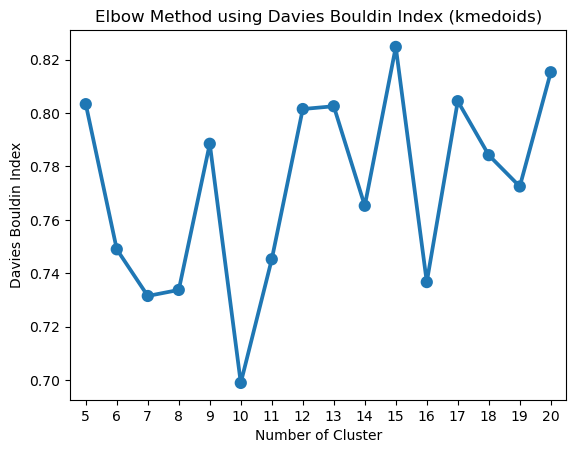

In [197]:
sns.pointplot(k_list, score_list)
plt.title('Elbow Method using Davies Bouldin Index (kmedoids)')
plt.xlabel('Number of Cluster')
plt.ylabel('Davies Bouldin Index')
plt.show()

Number of cluster=10 yields the optimal Davies Bouldin Index

In [255]:
# Choose K = 10
k = 10
X = sample_df_cold_hot[['Lat', 'Long']].values
kmedoids = KMedoids(k)
kmedoids.fit(X)
kmedoids_df['Cluster'] = np.vectorize(predict_cluster)(kmedoids_df['Lat'], kmedoids_df['Long'], kmedoids)

In [256]:
# Get the centroids from kmediods
medoids = kmedoids.medoids
medoids = pd.DataFrame(medoids)
medoids.columns = ['Lat', 'Long']
medoids.head()

,Lat,Long
0,42.357203,-71.060718
1,42.376210,-71.050436
2,42.349886,-71.145230
3,42.338256,-71.079209
4,42.316338,-71.068800


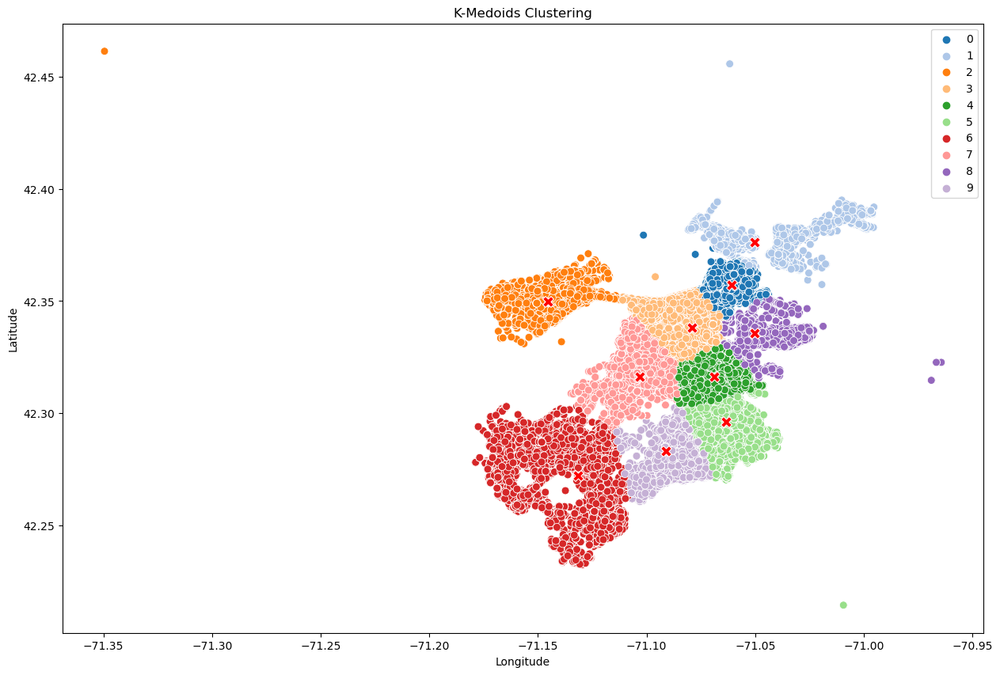

In [268]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'sample_df' is your DataFrame with data points and 'medoids' is a DataFrame with medoids
n_clusters = kmedoids_df['Cluster'].nunique()

# Create a dynamic color palette
colors = sns.color_palette('tab20', n_clusters)
plt.figure(figsize=(15, 10))
sns.scatterplot(data=kmedoids_df, y='Lat', x='Long', hue='Cluster', palette=colors, s=50)
sns.scatterplot(data=medoids, y='Lat', x='Long', marker='X', color='red', s=100)

plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('K-Medoids Clustering')
plt.show()

### Evaluating the clusters quality using Davies Bouldin Index

In [259]:
## Import packages
from sklearn.metrics import davies_bouldin_score

In [ ]:
# declare empty dictionary
davies_bouldin_index_dict = {}

In [260]:
davies_bouldin_index_kmedoids = davies_bouldin_score(X=kmedoids_df[['Lat', 'Long']].values, labels=kmedoids_df['Cluster'])
davies_bouldin_index_dict['kmediods'] = davies_bouldin_index_kmedoids

print('Evaluating quality of clusters using K-mediods: \n')
print(f"Davies Bouldin Index: {davies_bouldin_index_kmedoids}")

Evaluating quality of clusters using K-mediods: 

Davies Bouldin Index: 0.7517290238214731


In [202]:
# Preprocess the dataset
kmedoids_df = kmedoids_df.reset_index().reset_index()
kmedoids_df.drop(['index', 'INCIDENT_NUMBER'], axis=1, inplace=True)
kmedoids_df = kmedoids_df.rename(columns={'level_0': 'Crime_Number'})

In [267]:
# Export the dataset and the model
import joblib
joblib.dump(value=kmedoids_df, filename='Cleaned_Dataset/kmedoids_df.pkl')
joblib.dump(value=kmedoids, filename='Cleaned_Dataset/kmedoids.pkl')

['Cleaned_Dataset/kmedoids.pkl']

## 5.2: Fuzzy C-Means

In [206]:
cluster_df_cold_hot = sample_df_cold_hot[['Lat', 'Long']] 
fuzzy_df_cold_hot = df_cold_hot.copy()

To identify the optimal number of clusters, the Davies-Bouldin Index will be employed.

Cluster number: 2

	Fitting the Model..........

		-Execution time: 0.00 minutes

	Assigning Clusters on fuzzy_df_cold_hot..........

	Calculating Davies Bouldin Index..........

		-Execution time: 0.00 minutes

	Davies Bouldin Index: 1.0370387441643785

----------------------------------------------------------------------------------------------------

Cluster number: 3

	Fitting the Model..........

		-Execution time: 0.01 minutes

	Assigning Clusters on fuzzy_df_cold_hot..........

	Calculating Davies Bouldin Index..........

		-Execution time: 0.00 minutes

	Davies Bouldin Index: 0.9756899342818244

----------------------------------------------------------------------------------------------------

Cluster number: 4

	Fitting the Model..........

		-Execution time: 0.01 minutes

	Assigning Clusters on fuzzy_df_cold_hot..........

	Calculating Davies Bouldin Index..........

		-Execution time: 0.00 minutes

	Davies Bouldin Index: 0.7286387288827993

-------------------------------

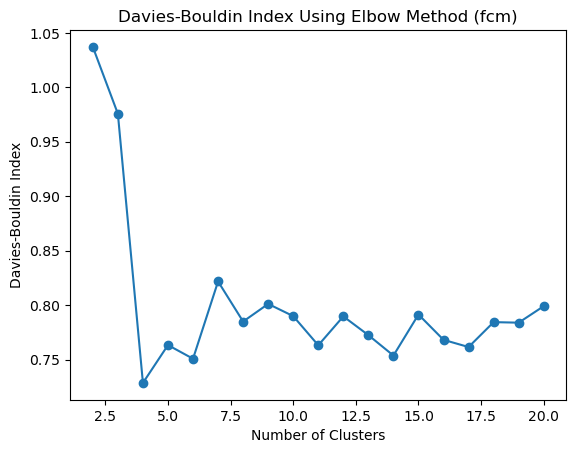

In [208]:
from sklearn.metrics import davies_bouldin_score
from fcmeans import FCM

# Define the range of cluster numbers
n_clusters_range = range(2, 21)

dbi = []

# Assuming 'cluster_df_cold_hot' is your data
data = cluster_df_cold_hot[['Lat', 'Long']].values 

for n_clusters in n_clusters_range:
    import time
    print(f"Cluster number: {n_clusters}\n")
    
    print("\tFitting the Model" + '.'*10 + '\n')
    start_time = time.time()
    # Perform Fuzzy C-Means clustering
    fcm = FCM(n_clusters=n_clusters, m=2, error=0.005, max_iter=1000)
    fcm.fit(data)
    end_time = time.time()
    execution_time_minutes = (end_time - start_time) / 60
    print(f"\t\t-Execution time: {execution_time_minutes:.2f} minutes\n")
    
    print("\tAssigning Clusters on fuzzy_df_cold_hot" + '.'*10 + '\n')
    # Predict cluster assignments for the data
    cluster_assignments = fcm.predict(fuzzy_df_cold_hot[['Lat', 'Long']].values)
    
    start_time = time.time()
    print("\tCalculating Davies Bouldin Index" + '.'*10 + '\n')
    # Calculate the Davies-Bouldin Index
    dbi_score = davies_bouldin_score(fuzzy_df_cold_hot[['Lat', 'Long']], cluster_assignments)
    dbi.append(dbi_score)
    end_time = time.time()
    execution_time_minutes = (end_time - start_time) / 60
    print(f"\t\t-Execution time: {execution_time_minutes:.2f} minutes\n")
    print("\tDavies Bouldin Index: " + str(dbi_score) + '\n')
    print('-' * 100 + '\n')




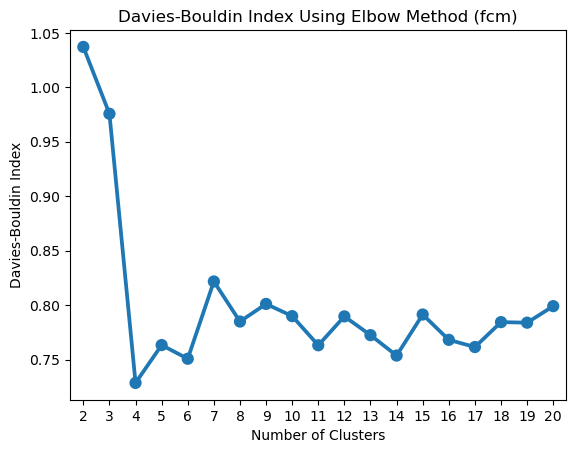

In [213]:
sns.pointplot(x=list(n_clusters_range), y=dbi)
plt.xlabel('Number of Clusters')
plt.ylabel('Davies-Bouldin Index')
plt.title('Davies-Bouldin Index Using Elbow Method (fcm)')
plt.show()

Although number of cluster = 4 yields the best davies-bouldin index, having only 4 clusters does not fulfill the objective to perform in-depth crime analysis.

Will choose Davies-Bouldin Index is at **11 clusters** instead.

In [214]:
fcm_cold_hot = cluster_df_cold_hot[['Lat', 'Long']]

# Perform Fuzzy C-Means clustering
fcm = FCM(n_clusters=11, m=2, error=0.005, max_iter=1000)
fcm.fit(fcm_cold_hot.values)
    
# Predict cluster assignments for the data
cluster_assignments = fcm.predict(fuzzy_df_cold_hot[['Lat', 'Long']].values)  

In [215]:
fuzzy_df_cold_hot['Cluster'] = cluster_assignments

In [216]:
cluster_centers = fcm.centers

cluster_centers = pd.DataFrame({
    'Lat': cluster_centers[:,0],
    'Long': cluster_centers[:,1]
})

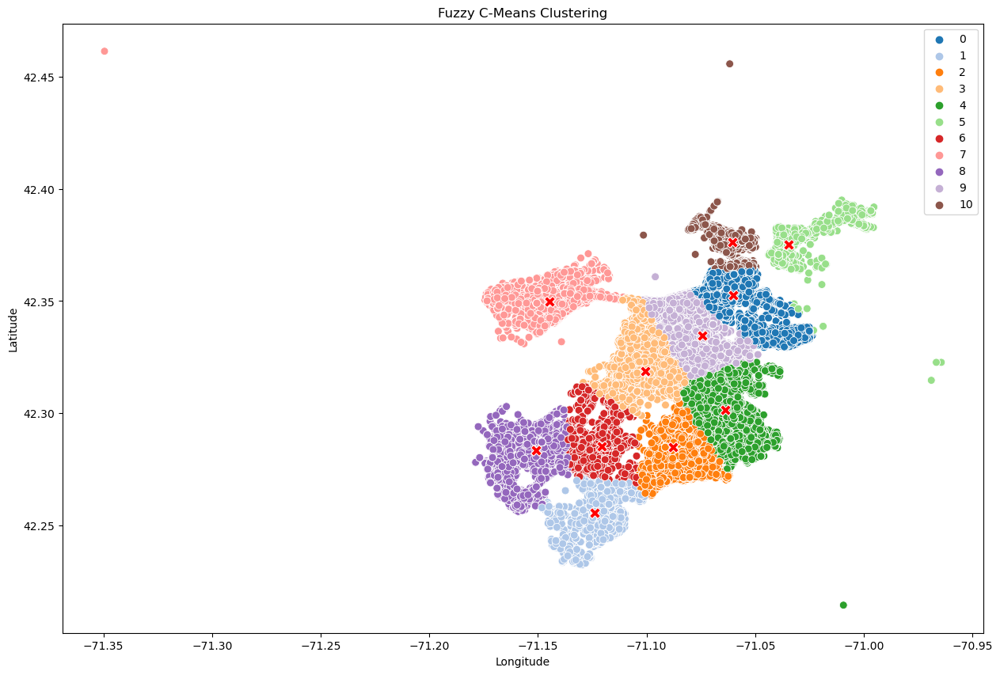

In [221]:
# Assuming 'fcm_cold_hot' is your DataFrame with data points and 'cluster_centers' is a DataFrame with cluster centers
n_clusters = fuzzy_df_cold_hot['Cluster'].nunique()

# Create a dynamic color palette
colors = sns.color_palette('tab20', n_clusters)

plt.figure(figsize=(15, 10))
# Create the scatter plot
sns.scatterplot(data=fuzzy_df_cold_hot, x='Long', y='Lat', hue='Cluster', palette=colors, s=50)
sns.scatterplot(data=cluster_centers, x='Long', y='Lat', marker='X', color='red', s=100)

# Get unique cluster labels from cluster_membership
unique_clusters = list(set(cluster_assignments))

# Add a title
plt.title('Fuzzy C-Means Clustering')

# Set labels for x and y axes
plt.xlabel('Longitude')
plt.ylabel('Latitude')

plt.show()


In [222]:
# Calculate the Davies-Bouldin Index
dbi_score_fuzzy_c_means = davies_bouldin_score(fuzzy_df_cold_hot[['Lat', 'Long']], fuzzy_df_cold_hot['Cluster'])
davies_bouldin_index_dict['fuzzy_c_means'] = dbi_score_fuzzy_c_means

print(f"Davies-Bouldin Index: {dbi_score:.4f}")

Davies-Bouldin Index: 0.7631


A a Davies-Bouldin Index of **0.7631** suggests that your clustering algorithm has created well-separated clusters in the data, and it's a good indicator of the quality of the clustering solution.

In [224]:
# Preprocess the dataset
fuzzy_df_cold_hot = fuzzy_df_cold_hot.reset_index().reset_index()
fuzzy_df_cold_hot.drop(['index', 'INCIDENT_NUMBER'], axis=1, inplace=True)
fuzzy_df_cold_hot = fuzzy_df_cold_hot.rename(columns={'level_0': 'Crime_Number'})

In [226]:
# Export the dataset and the model as pickle file
import joblib
joblib.dump(value=fuzzy_df_cold_hot, filename='Cleaned_Dataset/fuzzy_df.pkl')
joblib.dump(value=fcm, filename='Cleaned_Dataset/fuzzy_c_means.pkl')

['Cleaned_Dataset/fuzzy_c_means.pkl']

## 5.3: Mean-Shift

In [229]:
sample_mean_shift_df = sample_df_cold_hot[['Lat', 'Long']] 
mean_shift_df = df_cold_hot.copy()

Identify the best parameter by adjusting the quantile value in the estimate bandwidth

In [230]:
from sklearn.cluster import MeanShift, estimate_bandwidth
from sklearn.metrics import davies_bouldin_score
import warnings
warnings.filterwarnings('ignore')

In [231]:
import time
# Define the custom quantile values
quantile_values = [0.01,0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.10]

mean_shift_davies_bouldin_list = []

# Find the best quantile for estimate_bandwidth attribute for fitting the Mean-Shift model
for quantile in quantile_values:
    print(f'Quantile Value: {quantile}')
    X = sample_mean_shift_df[['Lat', 'Long']]
    bandwidth = estimate_bandwidth(X, quantile=quantile, n_samples=len(mean_shift_df))
    
    print("\tFitting the Model" + '.'*10 + '\n')
    start_time = time.time()
    mean_shift = MeanShift(bandwidth=bandwidth, n_jobs=-1)
    mean_shift.fit(X)
    end_time = time.time()
    execution_time_minutes = (end_time - start_time) / 60
    print(f"\t\t-Execution time: {execution_time_minutes:.2f} minutes\n")
    
    print("\tAssigning Clusters on sample_df_cold_hot" + '.'*10 + '\n')
    mean_shift_cluster_labels = mean_shift.predict(mean_shift_df[['Lat', 'Long']])  
    
    print("\tCalculating Davies Bouldin Index" + '.'*10 + '\n')
    start_time = time.time()
    db_index = davies_bouldin_score(mean_shift_df[['Lat', 'Long']], mean_shift_cluster_labels)
    end_time = time.time()
    execution_time_minutes = (end_time - start_time) / 60
    print(f"\t\t-Execution time: {execution_time_minutes:.2f} minutes\n")
    print("\tDavies Bouldin Index: " + str(db_index) + '\n')
    print('-' * 100 + '\n')
    
    mean_shift_davies_bouldin_list.append(db_index)


Quantile Value: 0.01
	Fitting the Model..........

		-Execution time: 1.19 minutes

	Assigning Clusters on sample_df_cold_hot..........

	Calculating Davies Bouldin Index..........

		-Execution time: 0.01 minutes

	Davies Bouldin Index: 0.8348158342333395

----------------------------------------------------------------------------------------------------

Quantile Value: 0.02
	Fitting the Model..........

		-Execution time: 1.62 minutes

	Assigning Clusters on sample_df_cold_hot..........

	Calculating Davies Bouldin Index..........

		-Execution time: 0.00 minutes

	Davies Bouldin Index: 0.8811167369553775

----------------------------------------------------------------------------------------------------

Quantile Value: 0.03
	Fitting the Model..........

		-Execution time: 1.61 minutes

	Assigning Clusters on sample_df_cold_hot..........

	Calculating Davies Bouldin Index..........

		-Execution time: 0.00 minutes

	Davies Bouldin Index: 0.8101041388226178

----------------------

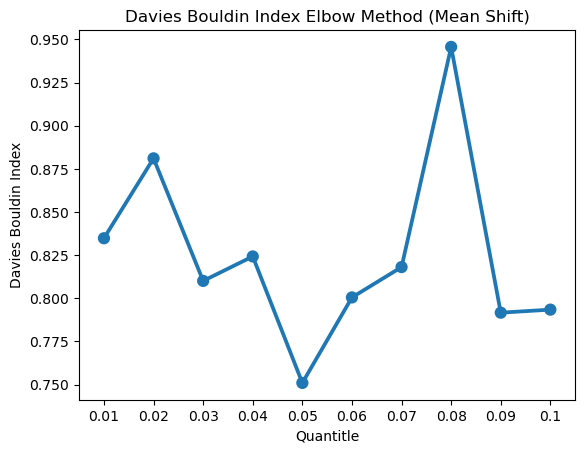

In [232]:
sns.pointplot(x=quantile_values ,y=mean_shift_davies_bouldin_list)
plt.title('Davies Bouldin Index Elbow Method (Mean Shift)')
plt.xlabel('Quantitle')
plt.ylabel('Davies Bouldin Index')
plt.show()

In [234]:
# Best bandwidth
bandwidth = estimate_bandwidth(sample_mean_shift_df[['Lat', 'Long']], quantile=0.05, n_samples=len(sample_mean_shift_df))

In [235]:
# Fit into parameters into the model
ms = MeanShift(bandwidth=bandwidth, n_jobs=-1)
ms.fit(sample_mean_shift_df[['Lat', 'Long']])

MeanShift(bandwidth=0.014160917880306753, n_jobs=-1)

In [238]:
# Assign clusters to mean_shift_df
mean_shift_df['Cluster'] = np.vectorize(predict_cluster)(mean_shift_df['Lat'], mean_shift_df['Long'], ms)

In [247]:
# Calculate the Davies-Bouldin index
db_index_ms = davies_bouldin_score(mean_shift_df[['Lat', 'Long']], mean_shift_df['Cluster'])
davies_bouldin_index_dict['mean_shift'] = db_index_ms
print(f"Davies-Bouldin Index: {db_index_ms}")

Davies-Bouldin Index: 0.7509877142280474


In [243]:
# Get the cluster centers
cluster_centers_ms = ms.cluster_centers_

# Display the center of each clusters
cluster_centers_ms = pd.DataFrame(cluster_centers_ms)
cluster_centers_ms.columns = ['Lat', 'Long']
cluster_centers_ms.head()

,Lat,Long
0,42.363671,-71.059871
1,42.344796,-71.067461
2,42.322454,-71.094880
3,42.300165,-71.066023
4,42.374342,-71.036747


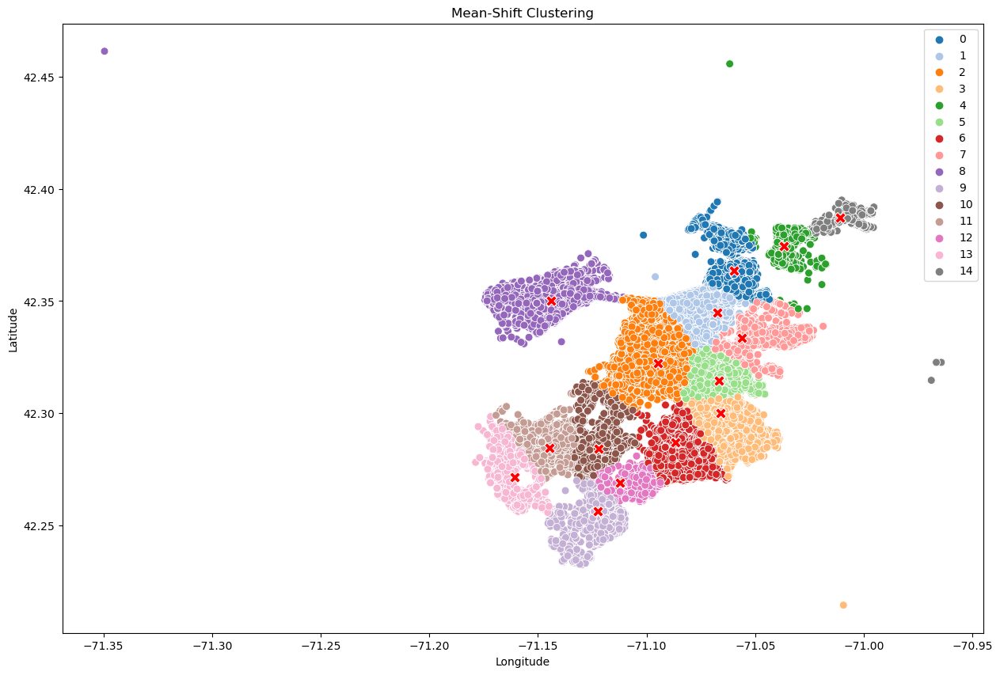

In [269]:
# Assuming 'sample_df' is your DataFrame with data points and 'medoids' is a DataFrame with medoids
n_clusters = mean_shift_df['Cluster'].nunique()

# Create a dynamic color palette
colors = sns.color_palette('tab20', n_clusters)

plt.figure(figsize=(15,10))

sns.scatterplot(data=mean_shift_df, y='Lat', x='Long', hue='Cluster', palette=colors, s=50)
sns.scatterplot(data=cluster_centers_ms, y='Lat', x='Long', marker='X', color='red', s=100)

plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.title('Mean-Shift Clustering')
plt.show()

Mean-Shift using estimated_bandwidth with 5% quantile has figured out 14 clusters. 

The Davies-Bouldin Index (DB-index = 0.7509877142280474) tells that the quality of clustering is relatively low. It suggests that the clusters may not well-separated and may have a significant overlap.

In [495]:
# Preprocess the dataset
mean_shift_df = mean_shift_df.reset_index().reset_index()
mean_shift_df.drop(['index', 'INCIDENT_NUMBER'], axis=1, inplace=True)
mean_shift_df = mean_shift_df.rename(columns={'level_0': 'Crime_Number'})

In [496]:
# Export the dataset and the model as pickle file
import joblib
joblib.dump(value=mean_shift_df, filename='Cleaned_Dataset/mean_shift_df.pkl')
joblib.dump(value=ms, filename='Cleaned_Dataset/ms.pkl')

['Cleaned_Dataset/ms.pkl']

# 6. Performance Evaluation

In [261]:
davies_bouldin_index_dict

{'kmediods': 0.7517290238214731,
 'fuzzy_c_means': 0.763111171335894,
 'mean_shift': 0.7509877142280474}

## 6.1 Visualize Davies Bouldin Index

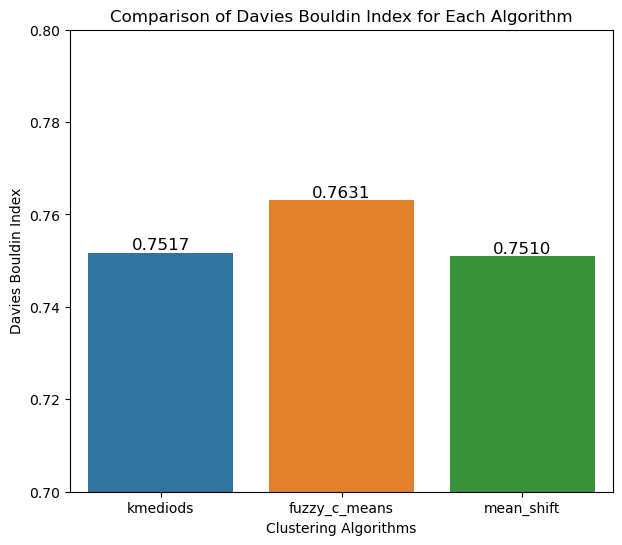

In [274]:
plt.figure(figsize=(7, 6))  
ax = sns.barplot(x=list(davies_bouldin_index_dict.keys()), y=list(davies_bouldin_index_dict.values()))

# Annotate the bars with their values
for p in ax.patches:
    ax.annotate(f'{p.get_height():.4f}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='bottom', fontsize=12)

plt.ylim((0.7, 0.8))
plt.title('Comparison of Davies Bouldin Index for Each Algorithm')
plt.xlabel('Clustering Algorithms')
plt.ylabel('Davies Bouldin Index')

plt.show()


The Davies Bouldin Index for these three algorithms exhibits remarkably close values. When considering the rankings based on their Davies Bouldin Index scores, Mean-Shift (0.7510) claims the top position, followed closely by k-medoids (0.7517). In the last position, we find fuzzy-c-means (0.7517).

However, numbers alone cannot provide a complete assessment. To truly evaluate the effectiveness of these algorithms, we must visualize the cluster outputs. This visualization will enable us to determine whether the resulting clusters are conducive to conducting in-depth crime analysis or not.

## 6.2 Visualize the Clusters

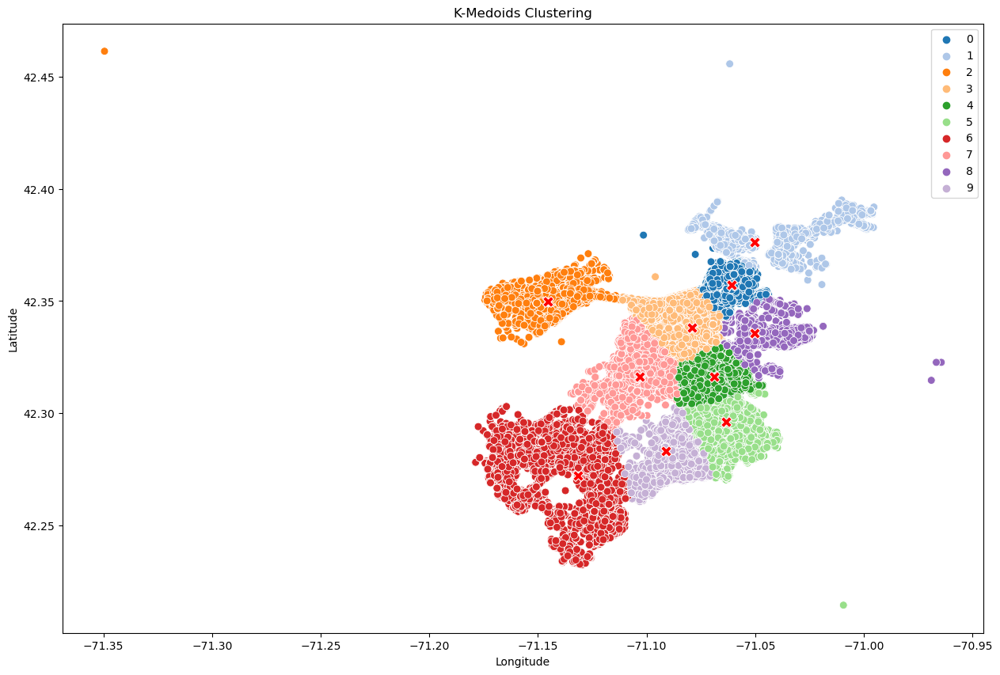

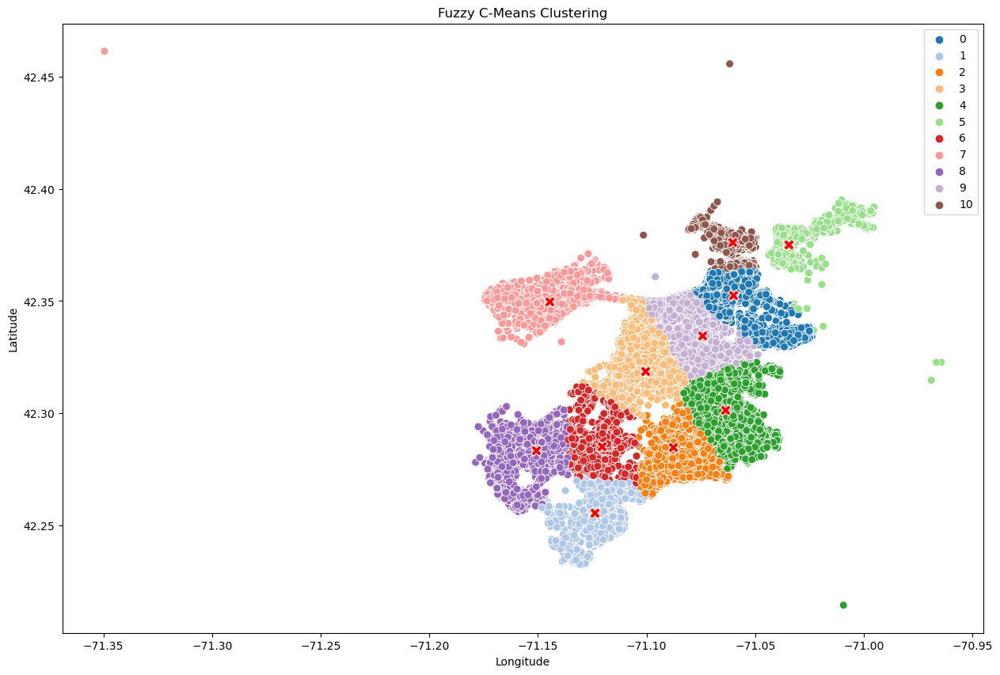

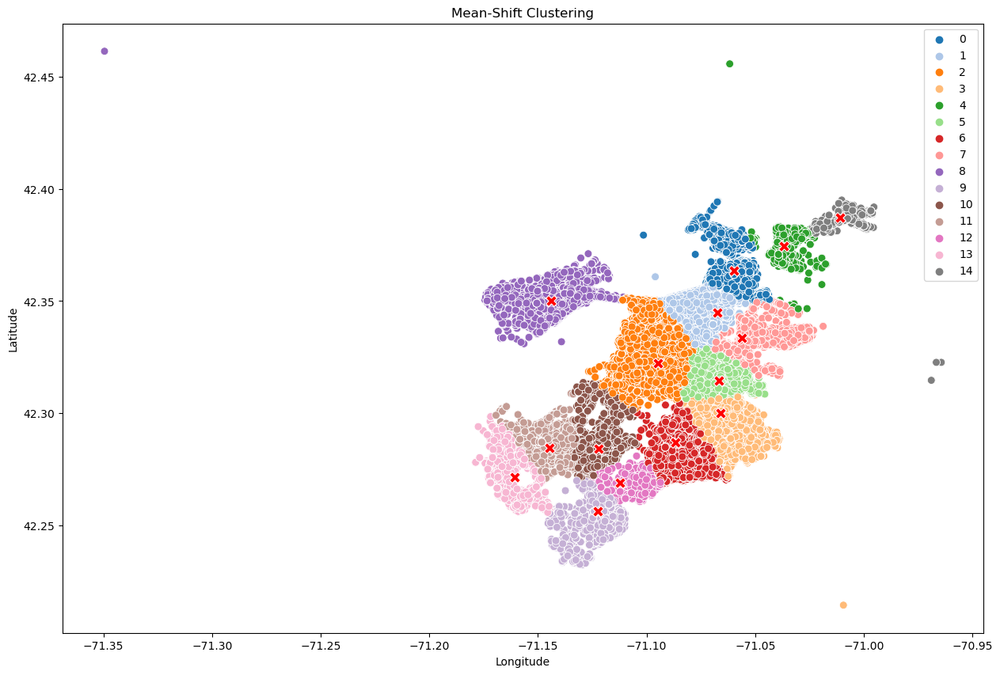

#### Evaluating the Areas of K-Medoids Clusters:
- The areas of most clusters exhibit significant similarity, with the exception of clusters 6 and 7.

#### Evaluating the Areas of K-Medoids Clusters:
- Most clusters show similar areas, except for clusters 10 and 5.

#### Evaluating the Areas of K-Medoids Clusters:
- When the number of clusters is set to 14, it results in varying cluster areas.

# 7. Cluster Analysis

In [2]:
import joblib

In [3]:
final_df = joblib.load('Cleaned_Dataset/fuzzy_df.pkl')

In [4]:
final_df.head()

,Crime_Number,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,Day_Of_Week_Number,Cluster
0,0,2629,HARASSMENT,HARASSMENT,A1,123,No,2017-01-01,2017,1,Sunday,0,Part Two,KNEELAND ST,42.350826,-71.062624,"(42.35082577, -71.06262352)",7,0
1,1,1108,FRAUD,FRAUD - WELFARE,B3,452,No,2017-01-01,2017,1,Sunday,0,Part Two,KENBERMA RD,42.295740,-71.073226,"(42.29574022, -71.07322638)",7,4
2,2,1102,FRAUD,FRAUD - FALSE PRETENSE / SCHEME,C11,403,No,2017-01-01,2017,1,Sunday,0,Part Two,WASHINGTON ST,42.280962,-71.070807,"(42.28096173, -71.07080703)",7,2
3,3,1106,CONFIDENCE GAMES,FRAUD - CREDIT CARD / ATM FRAUD,C11,381,No,2017-01-01,2017,1,Sunday,0,Part Two,GALLIVAN BLVD,42.284543,-71.045310,"(42.28454300, -71.04531029)",7,4
4,4,3831,MOTOR VEHICLE ACCIDENT RESPONSE,M/V - LEAVING SCENE - PROPERTY DAMAGE,E18,517,No,2017-01-01,2017,1,Sunday,0,Part Three,TYLER ST,42.246252,-71.124800,"(42.24625203, -71.12479983)",7,1


## 7.1 Rename Clusters

In [5]:
def rename_cluster(cluster_name):
    cluster_name += 1
    return f'Hotspot_{cluster_name}'

final_df['Cluster'] = final_df['Cluster'].apply(rename_cluster)
final_df = final_df.rename(columns={'Cluster':'Crime_Hotspot'})

In [20]:
final_df.head()

,Crime_Number,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,Day_Of_Week_Number,Crime_Hotspot
0,0,2629,HARASSMENT,HARASSMENT,A1,123,No,2017-01-01,2017,1,Sunday,0,Part Two,KNEELAND ST,42.350826,-71.062624,"(42.35082577, -71.06262352)",7,Hotspot_1
1,1,1108,FRAUD,FRAUD - WELFARE,B3,452,No,2017-01-01,2017,1,Sunday,0,Part Two,KENBERMA RD,42.295740,-71.073226,"(42.29574022, -71.07322638)",7,Hotspot_5
2,2,1102,FRAUD,FRAUD - FALSE PRETENSE / SCHEME,C11,403,No,2017-01-01,2017,1,Sunday,0,Part Two,WASHINGTON ST,42.280962,-71.070807,"(42.28096173, -71.07080703)",7,Hotspot_3
3,3,1106,CONFIDENCE GAMES,FRAUD - CREDIT CARD / ATM FRAUD,C11,381,No,2017-01-01,2017,1,Sunday,0,Part Two,GALLIVAN BLVD,42.284543,-71.045310,"(42.28454300, -71.04531029)",7,Hotspot_5
4,4,3831,MOTOR VEHICLE ACCIDENT RESPONSE,M/V - LEAVING SCENE - PROPERTY DAMAGE,E18,517,No,2017-01-01,2017,1,Sunday,0,Part Three,TYLER ST,42.246252,-71.124800,"(42.24625203, -71.12479983)",7,Hotspot_2


## 7.2 Crime Frequency in Each Crime Hotspot

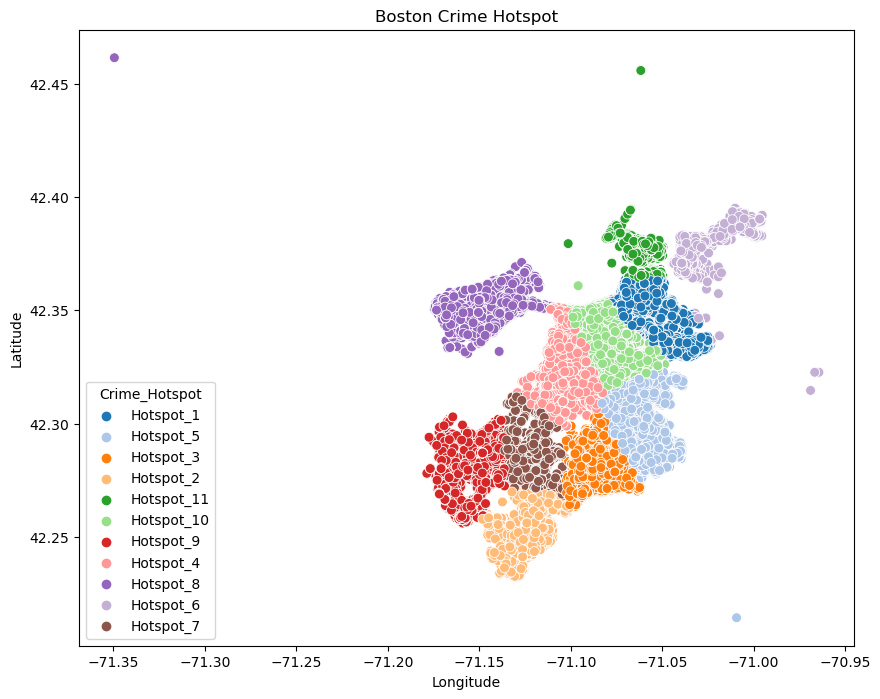

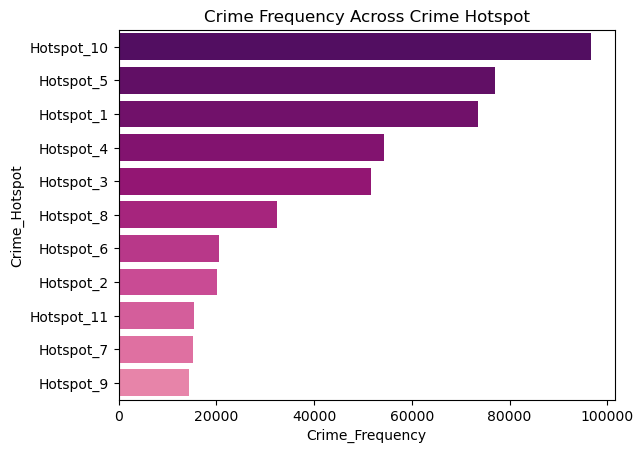

In [39]:
def plot_graph_7_1(df, title1='Boston Crime Hotspot', title2='Crime Frequency Across Crime Hotspot'):
    
    # Assuming 'sample_df' is your DataFrame with data points and 'medoids' is a DataFrame with medoids
    n_clusters = df['Crime_Hotspot'].nunique()

    # Create a dynamic color palette
    colors = sns.color_palette('tab20', n_clusters)

    plt.figure(figsize=(10,8))

    sns.scatterplot(data=df, y='Lat', x='Long', hue='Crime_Hotspot', palette=colors, s=50)

    plt.ylabel('Latitude')
    plt.xlabel('Longitude')
    plt.title(title1)
    plt.show()
    
    crime_df = df.groupby('Crime_Hotspot')['OFFENSE_CODE'].count().reset_index()
    crime_df = crime_df.rename(columns={'OFFENSE_CODE':'Crime_Frequency'})
    crime_df.sort_values('Crime_Frequency', inplace=True, ascending=False)
    palette = sorted(sns.color_palette("RdPu", 20), key=lambda x: x[0]) 
    # Create the barplot and store the Axes object
    sns.barplot(data=crime_df, x='Crime_Frequency', y='Crime_Hotspot', palette=palette)

    plt.title(title2)
    plt.show()
    
plot_graph_7_1(final_df)

## 7.3  Longtitude and Latitude of All Crime Inside a Crime Hotspot

In [34]:
hotspot_list = list(final_df['Crime_Hotspot'].unique())
print("These are the list of Hotspot: \n")
print(hotspot_list)
crime_hotspot = input('\nEnter the Hotspot Name: ')
print(f"You choose: {crime_hotspot}")

These are the list of Hotspot: 

['Hotspot_1', 'Hotspot_5', 'Hotspot_3', 'Hotspot_2', 'Hotspot_11', 'Hotspot_10', 'Hotspot_9', 'Hotspot_4', 'Hotspot_8', 'Hotspot_6', 'Hotspot_7']

Enter the Hotspot Name: Hotspot_10
You choose: Hotspot_10


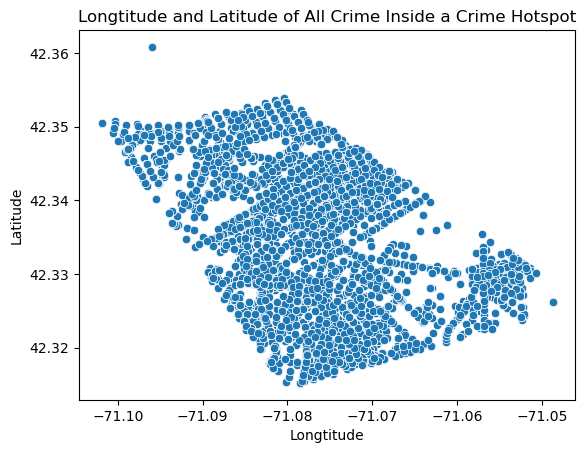

In [46]:
crime_hotspot = 'Hotspot_10'
def display_hotspot(df, crime_hotspot, title):
    crime_df = df[df['Crime_Hotspot'] == crime_hotspot]
    sns.scatterplot(data=crime_df, y='Lat', x='Long')
    plt.title(title)
    plt.xlabel('Longtitude')
    plt.ylabel('Latitude')
    plt.show()

display_hotspot(df=final_df, crime_hotspot=crime_hotspot, title='Longtitude and Latitude of All Crime Inside a Crime Hotspot')   

## 7.4 Top 10 Crime in a Specific Hotspot

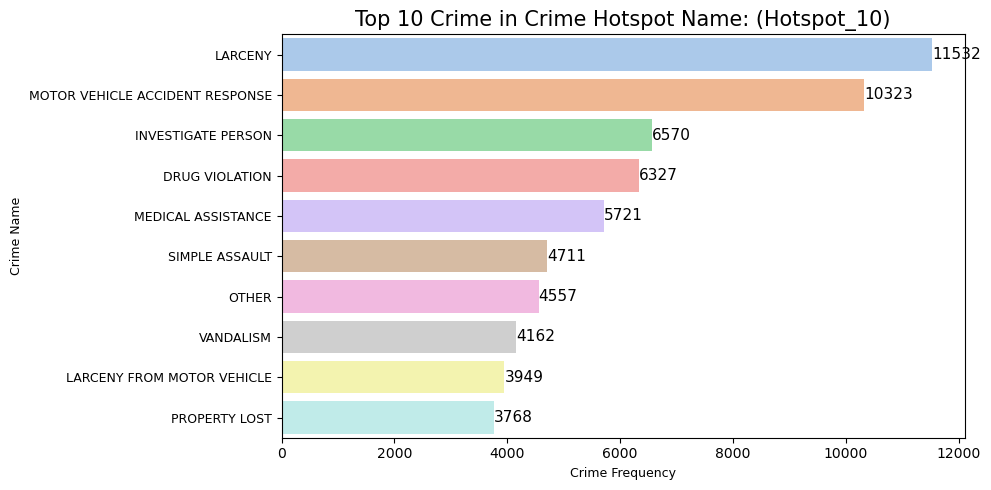

In [37]:
def graph_top_10_crime_in_a_hotspot(df, title):
    top_crime = df[df['Crime_Hotspot'] == crime_hotspot].groupby('OFFENSE_CODE_GROUP')['OFFENSE_CODE'].count().reset_index()
    top_crime = top_crime.rename(columns={'OFFENSE_CODE': 'Crime_Frequency'})
    top_crime = top_crime.sort_values('Crime_Frequency', ascending=False)
    top_crime = top_crime.head(10)
   
    colors = sns.color_palette("pastel")
    plt.figure(figsize=(10, 5))
    ax = sns.barplot(data=top_crime, y="OFFENSE_CODE_GROUP", x="Crime_Frequency", palette=colors)

    # Display numbers on top of the bars
    for p in ax.patches:
        ax.annotate(f'{p.get_width():.0f}', (p.get_width() + 0.5, p.get_y() + p.get_height() / 2),
                    ha='left', va='center', fontsize=11, color='black')

    # Add title and labels
    plt.title(title, fontsize=15)
    plt.ylabel('Crime Name', fontsize=9)
    plt.xlabel('Crime Frequency', fontsize=9)
    plt.yticks(fontsize=9)

    # Show the plot
    plt.tight_layout()
    plt.show()
    
graph_top_10_crime_in_a_hotspot(final_df, title=f'Top 10 Crime in Crime Hotspot Name: ({crime_hotspot})')

## 7.5 Monthly, Daily and Hourly Crime Trend Inside a Hotspot

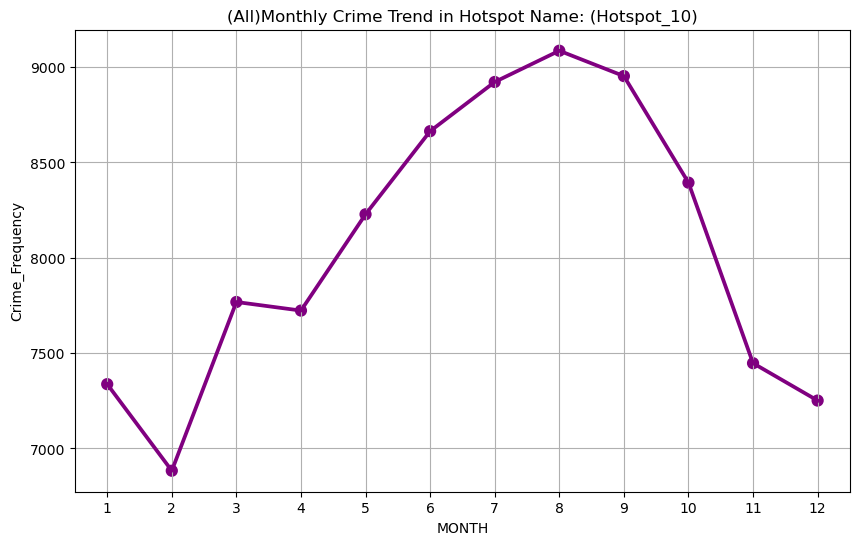

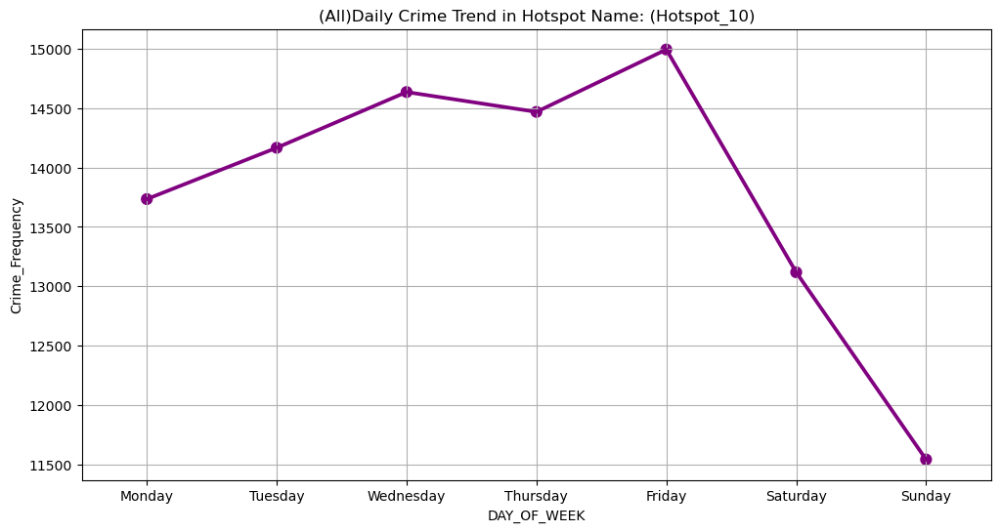

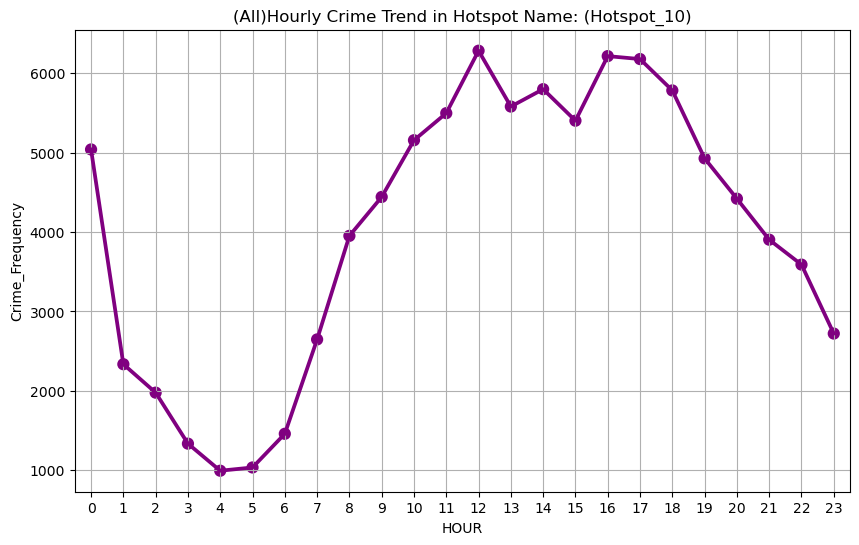

In [64]:
def monthly_daily_hourly_trend_of_a_hotspot(df, crime_hotspot, crime_name="All"):
    
    if crime_name == "All" or crime_name == None:
        df = df[df['Crime_Hotspot'] == crime_hotspot]
    else:
        df = df[(df['Crime_Hotspot'] == crime_hotspot) & (df['OFFENSE_CODE_GROUP'] == crime_name)]
    
    title = f"({crime_name})Monthly Crime Trend in Hotspot Name: ({crime_hotspot})"
    month_crime = df.groupby(['MONTH'])['OFFENSE_CODE'].count().reset_index()
    month_crime = month_crime.rename(columns={'OFFENSE_CODE': 'Crime_Frequency'})
    month_crime['MONTH'] = month_crime['MONTH'].astype('str')

    plt.figure(figsize=(10,6))
    colors = sns.color_palette(["purple"])  # Use light blue color

    ax = sns.pointplot(data=month_crime, x='MONTH', y='Crime_Frequency', color=colors[0])


    plt.title(title)
    plt.grid(True)
    plt.show()

    # Daily Crime-----------------------------------------------------------------------------------------------------------
    
    title = f"({crime_name})Daily Crime Trend in Hotspot Name: ({crime_hotspot})"
    daily_crime = df.groupby(['DAY_OF_WEEK'])['OFFENSE_CODE'].count().reset_index()
    daily_crime = daily_crime.rename(columns={'OFFENSE_CODE': 'Crime_Frequency'})
    daily_crime['DAY_OF_WEEK'] = daily_crime['DAY_OF_WEEK'].astype('str')
    days_of_week = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

    colors = sns.color_palette(["purple"])
    plt.figure(figsize=(12,6))

    ax = sns.pointplot(data=daily_crime, x='DAY_OF_WEEK', y='Crime_Frequency', color=colors[0], order=days_of_week)


    plt.title(title)
    plt.grid(True)
    plt.show()


    # Hourly Crime ------------------------------------------------------------------------------------------------
    title = f"({crime_name})Hourly Crime Trend in Hotspot Name: ({crime_hotspot})"
    hour_crime = df.groupby(['HOUR'])['OFFENSE_CODE'].count().reset_index()
    hour_crime = hour_crime.rename(columns={'OFFENSE_CODE': 'Crime_Frequency'})
    order_list = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23]
    plt.figure(figsize=(10,6))
    colors = sns.color_palette("pastel")
    ax = sns.pointplot(data=hour_crime, x='HOUR', y='Crime_Frequency', color='Purple', order=order_list)    


    plt.title(title)
    plt.grid(True) 
    plt.show()


monthly_daily_hourly_trend_of_a_hotspot(final_df, crime_hotspot)

## 7.6 Monthly, Daily and Hourly Crime Trend For a Specific Crime Inside a Hotspot

In [56]:
crime_list = list(final_df['OFFENSE_CODE_GROUP'].unique())
print(f'Below are all the Crime in Hotspot Name: {crime_hotspot}')
for index, crime in enumerate(crime_list, start=1):
    print(f"{index}. {crime}")
crime_option = input('Enter a Crime Name: ')
print(f'You Choose {crime_option}')

Below are all the Crime in Hotspot Name: Hotspot_10
1. HARASSMENT
2. FRAUD
3. CONFIDENCE GAMES
4. MOTOR VEHICLE ACCIDENT RESPONSE
5. LARCENY
6. AUTO THEFT
7. MEDICAL ASSISTANCE
8. INVESTIGATE PROPERTY
9. INVESTIGATE PERSON
10. LANDLORD/TENANT DISPUTES
11. PROPERTY LOST
12. SIMPLE ASSAULT
13. VANDALISM
14. OTHER
15. VERBAL DISPUTES
16. FIRE RELATED REPORTS
17. BALLISTICS
18. LICENSE VIOLATION
19. AGGRAVATED ASSAULT
20. TOWED
21. MISSING PERSON LOCATED
22. RECOVERED STOLEN PROPERTY
23. LARCENY FROM MOTOR VEHICLE
24. WARRANT ARRESTS
25. DISORDERLY CONDUCT
26. VIOLATIONS
27. FIREARM DISCOVERY
28. ROBBERY
29. PROPERTY FOUND
30. RESIDENTIAL BURGLARY
31. MISSING PERSON REPORTED
32. DRUG VIOLATION
33. COUNTERFEITING
34. RESTRAINING ORDER VIOLATIONS
35. HARBOR RELATED INCIDENTS
36. AUTO THEFT RECOVERY
37. SEARCH WARRANTS
38. OFFENSES AGAINST CHILD / FAMILY
39. EMBEZZLEMENT
40. COMMERCIAL BURGLARY
41. POLICE SERVICE INCIDENTS
42. LICENSE PLATE RELATED INCIDENTS
43. PRISONER RELATED INCIDENTS
44.

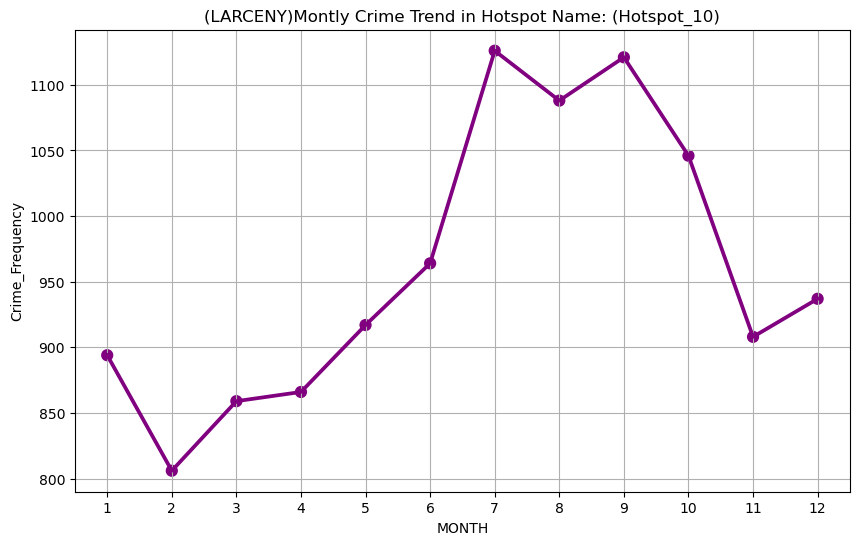

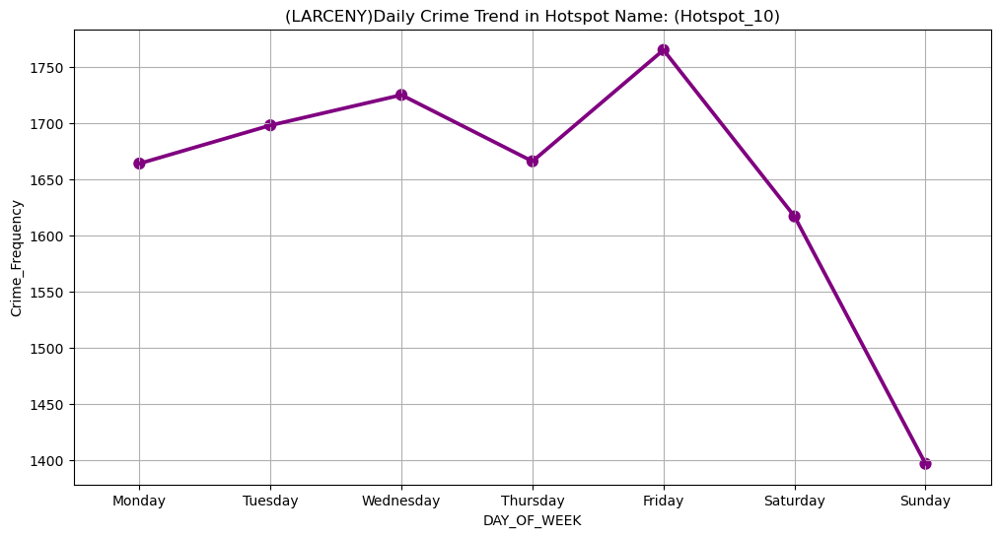

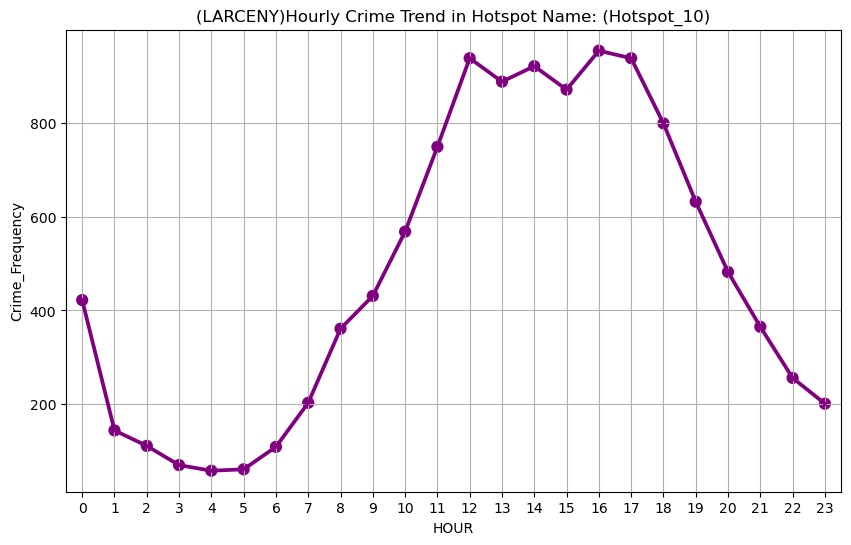

In [57]:
monthly_daily_hourly_trend_of_a_hotspot(final_df, crime_hotspot, crime_name=crime_option)

## 7.7 Shooting Crime Frequency for Each Hotspot

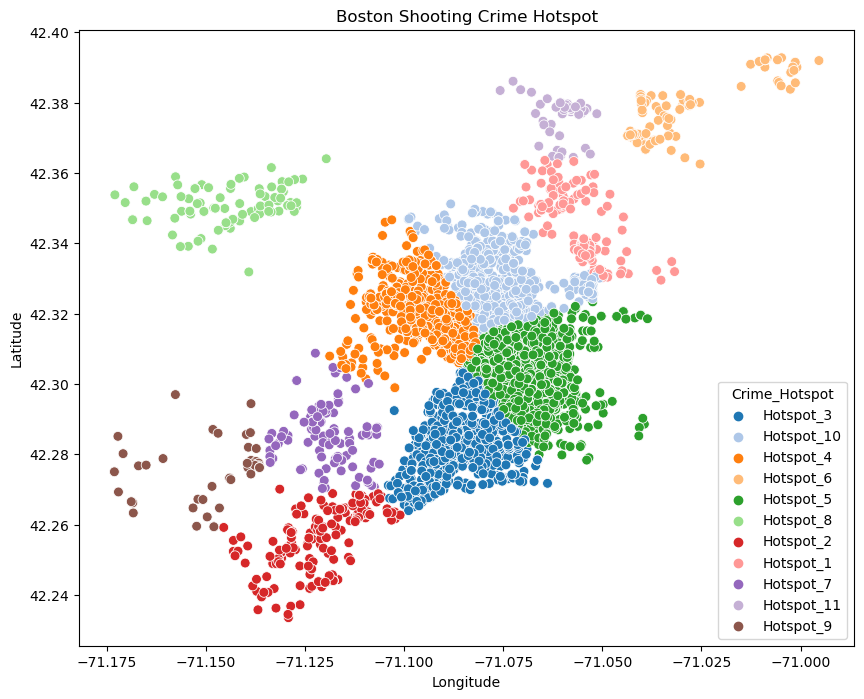

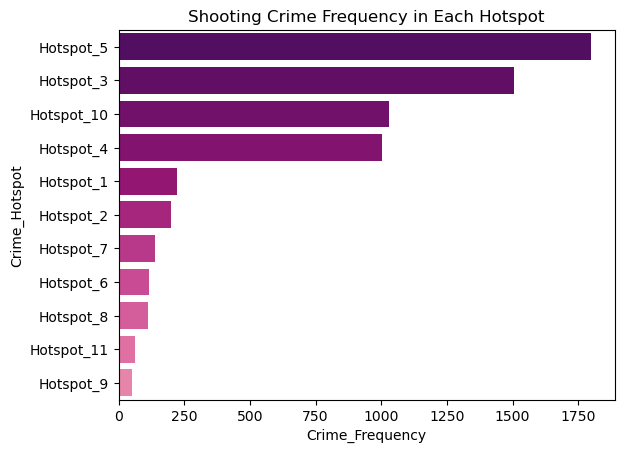

In [41]:
plot_graph_7_1(final_df[final_df['SHOOTING'] == 'Yes'], title1="Boston Shooting Crime Hotspot", title2='Shooting Crime Frequency in Each Hotspot')

## 7.8 Longtitude and Latitude of All Shooting Crime Inside a Crime Hotspot

In [43]:
hotspot_list = list(final_df['Crime_Hotspot'].unique())
print("These are the list of Hotspot: \n")
print(hotspot_list)
crime_hotspot = input('\nEnter the Hotspot Name: ')
print(f"You choose: {crime_hotspot}")

These are the list of Hotspot: 

['Hotspot_1', 'Hotspot_5', 'Hotspot_3', 'Hotspot_2', 'Hotspot_11', 'Hotspot_10', 'Hotspot_9', 'Hotspot_4', 'Hotspot_8', 'Hotspot_6', 'Hotspot_7']

Enter the Hotspot Name: Hotspot_5
You choose: Hotspot_5


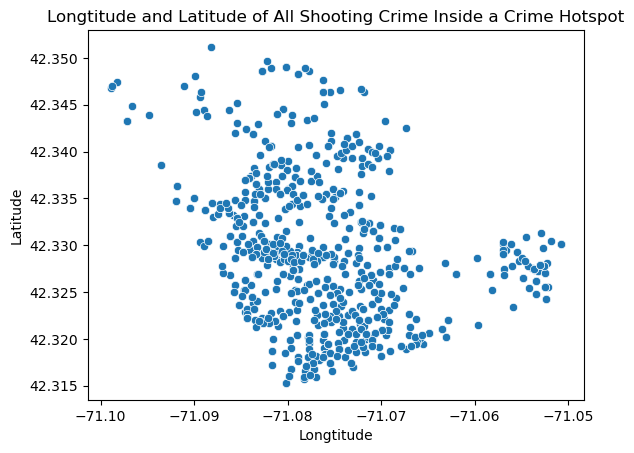

In [48]:
display_hotspot(df=final_df[final_df['SHOOTING'] == 'Yes'], crime_hotspot=crime_hotspot, title='Longtitude and Latitude of All Shooting Crime Inside a Crime Hotspot')   

## 7.9 Top 10 Shooting Crime in a Specific Hotspot

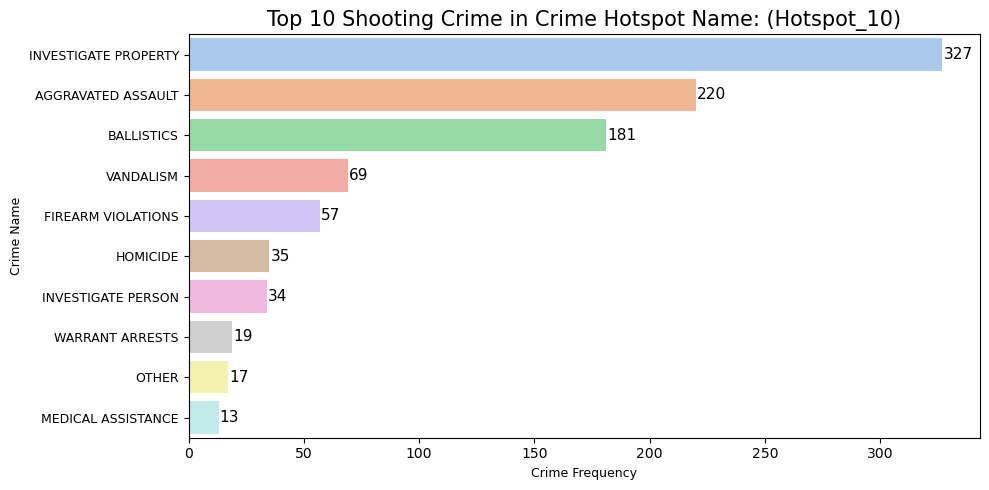

In [59]:
graph_top_10_crime_in_a_hotspot(final_df[final_df['SHOOTING'] == 'Yes'], title=f'Top 10 Shooting Crime in Crime Hotspot Name: ({crime_hotspot})')

## 7.10 Monthly, Daily and Hourly Trend of All Shooting Crime Inside a Hotspot

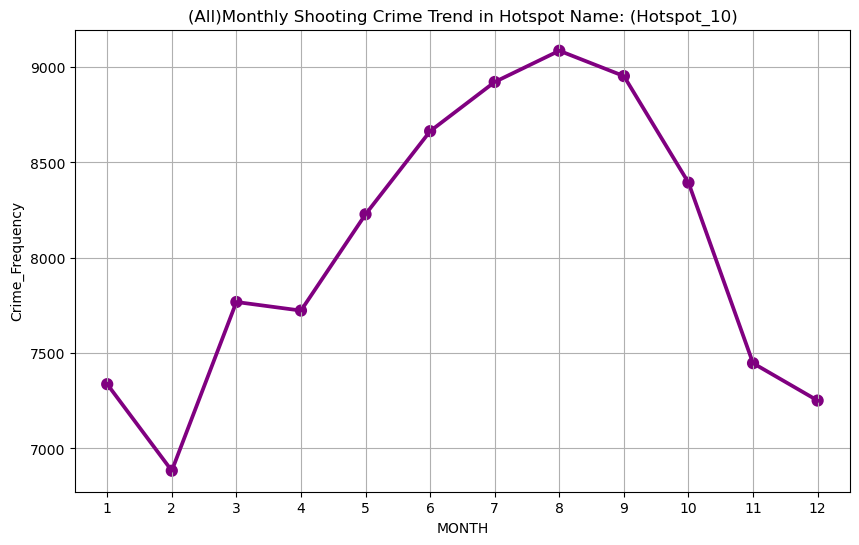

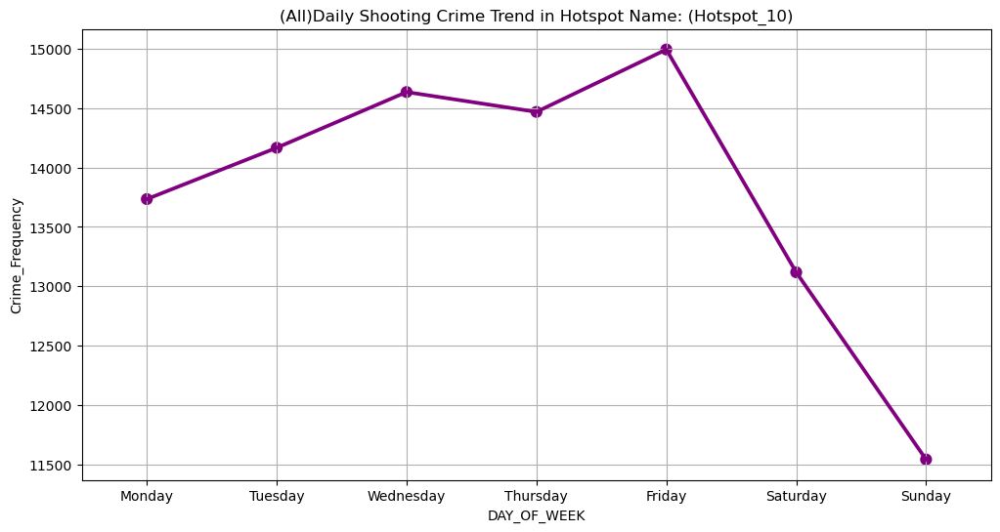

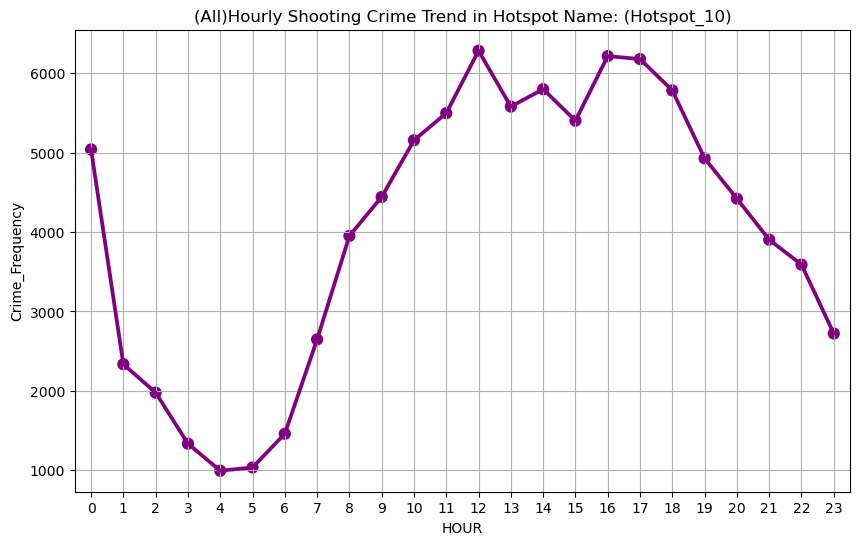

In [61]:
def monthly_daily_hourly_trend_of_a_hotspot(df, crime_hotspot, crime_name="All"):
    
    if crime_name == "All" or crime_name == None:
        df = df[df['Crime_Hotspot'] == crime_hotspot]
    else:
        df = df[(df['Crime_Hotspot'] == crime_hotspot) & (df['OFFENSE_CODE_GROUP'] == crime_name)]
    
    title = f"({crime_name})Monthly Shooting Crime Trend in Hotspot Name: ({crime_hotspot})"
    month_crime = df.groupby(['MONTH'])['OFFENSE_CODE'].count().reset_index()
    month_crime = month_crime.rename(columns={'OFFENSE_CODE': 'Crime_Frequency'})
    month_crime['MONTH'] = month_crime['MONTH'].astype('str')

    plt.figure(figsize=(10,6))
    colors = sns.color_palette(["purple"])  # Use light blue color

    ax = sns.pointplot(data=month_crime, x='MONTH', y='Crime_Frequency', color=colors[0])


    plt.title(title)
    plt.grid(True)
    plt.show()

    # Daily Crime-----------------------------------------------------------------------------------------------------------
    
    title = f"({crime_name})Daily Shooting Crime Trend in Hotspot Name: ({crime_hotspot})"
    daily_crime = df.groupby(['DAY_OF_WEEK'])['OFFENSE_CODE'].count().reset_index()
    daily_crime = daily_crime.rename(columns={'OFFENSE_CODE': 'Crime_Frequency'})
    daily_crime['DAY_OF_WEEK'] = daily_crime['DAY_OF_WEEK'].astype('str')
    days_of_week = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

    colors = sns.color_palette(["purple"])
    plt.figure(figsize=(12,6))

    ax = sns.pointplot(data=daily_crime, x='DAY_OF_WEEK', y='Crime_Frequency', color=colors[0], order=days_of_week)


    plt.title(title)
    plt.grid(True)
    plt.show()


    # Hourly Crime ------------------------------------------------------------------------------------------------
    title = f"({crime_name})Hourly Shooting Crime Trend in Hotspot Name: ({crime_hotspot})"
    hour_crime = df.groupby(['HOUR'])['OFFENSE_CODE'].count().reset_index()
    hour_crime = hour_crime.rename(columns={'OFFENSE_CODE': 'Crime_Frequency'})
    order_list = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23]
    plt.figure(figsize=(10,6))
    colors = sns.color_palette("pastel")
    ax = sns.pointplot(data=hour_crime, x='HOUR', y='Crime_Frequency', color='Purple', order=order_list)    


    plt.title(title)
    plt.grid(True) 
    plt.show()


monthly_daily_hourly_trend_of_a_hotspot(final_df, crime_hotspot)

## 7.11 Monthly, Daily and Hourly Crime Trend For a Specific Crime Inside a Hotspot

In [62]:
crime_list = list(final_df[final_df['SHOOTING'] == 'Yes']['OFFENSE_CODE_GROUP'].unique())
print(f'Below are all the Crime in Hotspot Name: {crime_hotspot}')
for index, crime in enumerate(crime_list, start=1):
    print(f"{index}. {crime}")
crime_option = input('Enter a Crime Name: \n')
print(f'You Choose: {crime_option}')

Below are all the Crime in Hotspot Name: Hotspot_10
1. INVESTIGATE PROPERTY
2. BALLISTICS
3. AGGRAVATED ASSAULT
4. INVESTIGATE PERSON
5. OTHER
6. FIREARM VIOLATIONS
7. HOMICIDE
8. ROBBERY
9. VANDALISM
10. PROPERTY RELATED DAMAGE
11. PROPERTY FOUND
12. WARRANT ARRESTS
13. SIMPLE ASSAULT
14. SEARCH WARRANTS
15. DRUG VIOLATION
16. MOTOR VEHICLE ACCIDENT RESPONSE
17. FIREARM DISCOVERY
18. TOWED
19. DISORDERLY CONDUCT
20. ASSEMBLY OR GATHERING VIOLATIONS
21. AUTO THEFT
22. MEDICAL ASSISTANCE
23. MANSLAUGHTER
24. VIOLATIONS
25. RECOVERED STOLEN PROPERTY
26. RESTRAINING ORDER VIOLATIONS
27. VERBAL DISPUTES
28. PROPERTY LOST
29. POLICE SERVICE INCIDENTS
30. LICENSE VIOLATION
31. LARCENY
32. RESIDENTIAL BURGLARY
Enter a Crime Name: INVESTIGATE PROPERTY
You Choose INVESTIGATE PROPERTY


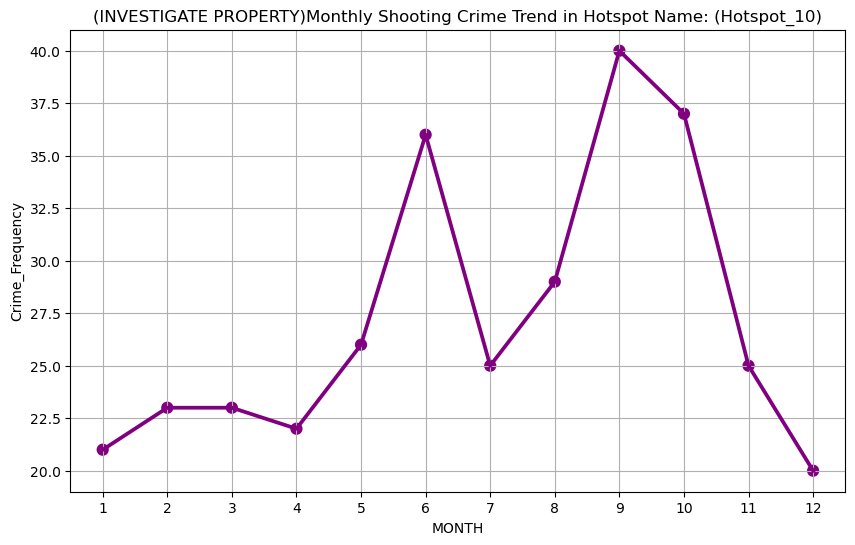

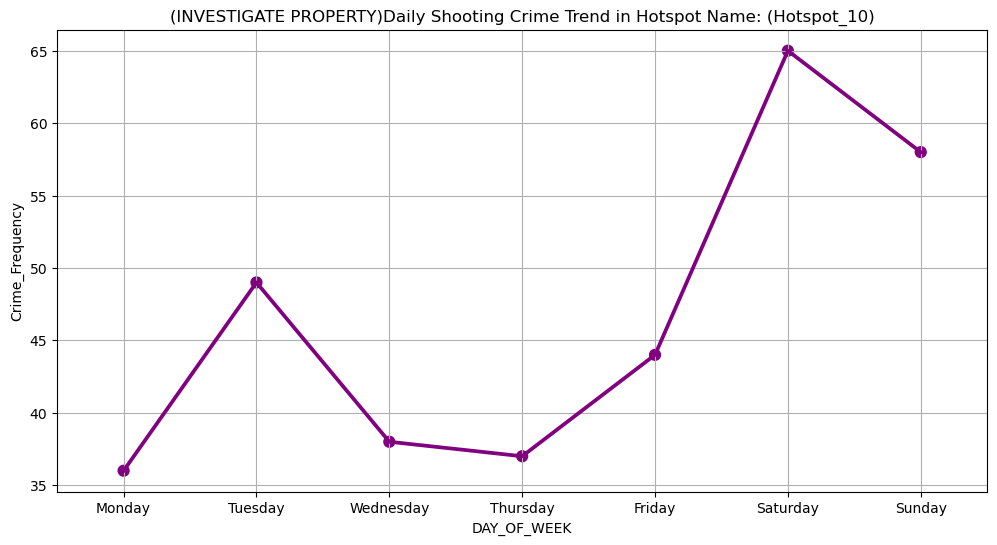

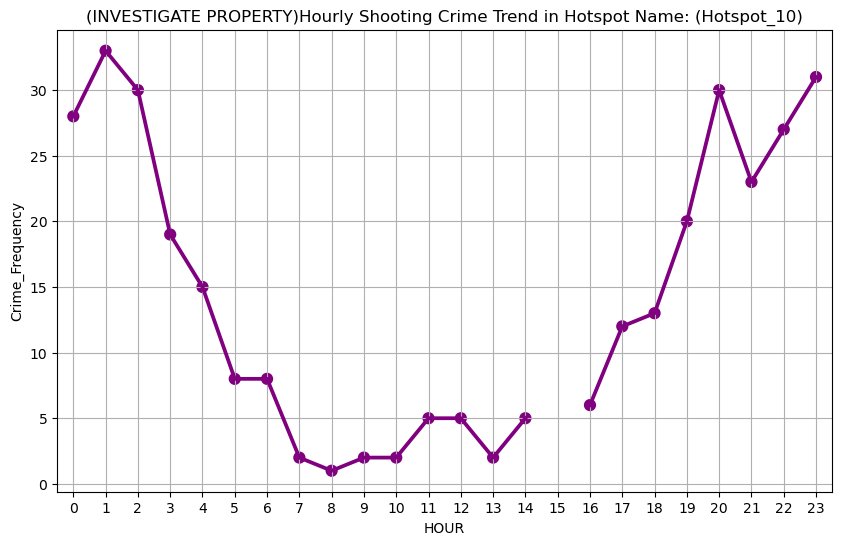

In [63]:
monthly_daily_hourly_trend_of_a_hotspot(final_df[final_df['SHOOTING'] == 'Yes'], crime_hotspot, crime_name=crime_option)

# 8. Conclusion

In summary, our study harnessed the power of the fuzzy-c-means unsupervised learning model to pinpoint 11 significant crime hotspots in Boston. Through meticulous analysis, we delved into each hotspot, unearthing valuable insights and trends.
